# Computer vision Final project

# *1. Introduction*

# *2. Getting the dataset*

## **2.1. Retrieval of the zip file**

In [1]:
!wget -nc http://host.robots.ox.ac.uk/pascal/VOC/voc2009/VOCtrainval_11-May-2009.tar
!tar -xf VOCtrainval_11-May-2009.tar --totals

--2020-05-29 07:29:13--  http://host.robots.ox.ac.uk/pascal/VOC/voc2009/VOCtrainval_11-May-2009.tar
Resolving host.robots.ox.ac.uk (host.robots.ox.ac.uk)... 129.67.94.152
Connecting to host.robots.ox.ac.uk (host.robots.ox.ac.uk)|129.67.94.152|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 935534080 (892M) [application/x-tar]
Saving to: ‘VOCtrainval_11-May-2009.tar’

VOCtrainval_11-May- 100%[===================>] 892.19M  5.19MB/s    in 2m 58s  

2020-05-29 07:35:30 (5.01 MB/s) - ‘VOCtrainval_11-May-2009.tar’ saved [935534080/935534080]

Total bytes read: 935536640 (893MiB, 270MiB/s)


Build training(65%), validation(20%) and test(15%) sets from the data.

The data provided consists of a set of images; each image has an annotation file giving a bounding box and object class label for each object in one of the twenty classes present in the image. Multiple objects from multiple classes may be present in the same image.

A subset of images are also annotated with pixel-wise segmentation of each object present.

The segmentations are like this:
- Object segmentation:
pixel indices correspond to the first, second, third object etc.

- Class segmentation:
pixel indices correspond to classes in alphabetical order (1=aeroplane, 2=bicycle, 3=bird, 4=boat, 5=bottle, 6=bus, 7=car , 8=cat, 9=chair, 10=cow, 11=diningtable, 12=dog, 13=horse, 14=motorbike, 15=person, 16=potted plant, 17=sheep, 18=sofa, 19=train, 20=tv/monitor) 

In [0]:
voc_root_folder = "/content/VOCdevkit/VOC2009"
root_path = "/content/VOCdevkit/VOC2009/"
images_path = root_path+"/JPEGImages/"
annotation_path = root_path+"/Annotations/"
class_segmentation_path = root_path+"SegmentationClass/"
object_segmentation_path = root_path+"SegmentationObject/"

seed = 1337

## **2.2. Retrieving the image names**

In [0]:
import os
import numpy as np
import xml.etree.ElementTree as ET
from collections import OrderedDict
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer
import cv2
import glob

In [0]:
def xml_file_ext(tree):
  Nobj = 0
  row = OrderedDict()
  for elems in tree.iter():
    if elems.tag == "size":
      for elem in elems:
        row[elem.tag] = int(elem.text)
    elif elems.tag == "object":
      for elem in elems:
        if elem.tag == "name":
          row["bbx_{}_{}".format(Nobj,elem.tag)] = str(elem.text)
        if elem.tag == "bndbox":
          for k in elem:
            row["bbx_{}_{}".format(Nobj,k.tag)] = float(k.text)
          Nobj += 1
  row["Nobj"] = Nobj
  return(row)

datframe = []
for fnm in os.listdir(annotation_path):
  if not fnm.startswith('.'):
    tree = ET.parse(os.path.join(annotation_path,fnm))
    row = xml_file_ext(tree)
    row["fileID"] = fnm.split(".")[0]
    datframe.append(row)
datframe = pd.DataFrame(datframe)
maxNobj = np.max(datframe["Nobj"])

print("-"*30)
print("datframe.shape={}=(N frames, N columns)".format(datframe.shape))
datframe.head()

------------------------------
datframe.shape=(7818, 285)=(N frames, N columns)


,bbx_0_name,bbx_0_xmax,bbx_0_xmin,bbx_0_ymax,bbx_0_ymin,bbx_1_name,bbx_1_xmax,bbx_1_xmin,bbx_1_ymax,bbx_1_ymin,bbx_2_name,bbx_2_xmax,bbx_2_xmin,bbx_2_ymax,bbx_2_ymin,bbx_3_name,bbx_3_xmax,bbx_3_xmin,bbx_3_ymax,bbx_3_ymin,depth,height,width,Nobj,fileID,bbx_4_name,bbx_4_xmin,bbx_4_ymin,bbx_4_xmax,bbx_4_ymax,bbx_5_name,bbx_5_xmin,bbx_5_ymin,bbx_5_xmax,bbx_5_ymax,bbx_6_name,bbx_6_xmin,bbx_6_ymin,bbx_6_xmax,bbx_6_ymax,...,bbx_48_name,bbx_48_xmin,bbx_48_ymin,bbx_48_xmax,bbx_48_ymax,bbx_49_name,bbx_49_xmin,bbx_49_ymin,bbx_49_xmax,bbx_49_ymax,bbx_50_name,bbx_50_xmin,bbx_50_ymin,bbx_50_xmax,bbx_50_ymax,bbx_51_name,bbx_51_xmin,bbx_51_ymin,bbx_51_xmax,bbx_51_ymax,bbx_52_name,bbx_52_xmin,bbx_52_ymin,bbx_52_xmax,bbx_52_ymax,bbx_53_name,bbx_53_xmin,bbx_53_ymin,bbx_53_xmax,bbx_53_ymax,bbx_54_name,bbx_54_xmin,bbx_54_ymin,bbx_54_xmax,bbx_54_ymax,bbx_55_name,bbx_55_xmin,bbx_55_ymin,bbx_55_xmax,bbx_55_ymax
0,tvmonitor,282.0,206.0,328.0,228.0,tvmonitor,204.0,158.0,330.0,230.0,person,329.0,1.0,375.0,38.0,bottle,452.0,431.0,285.0,232.0,3,375,500,4,2009_001106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,cat,352.0,1.0,272.0,16.0,cat,500.0,130.0,366.0,139.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,366,500,2,2008_002045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,car,500.0,291.0,228.0,109.0,car,169.0,1.0,253.0,141.0,person,258.0,152.0,332.0,83.0,NaN,NaN,NaN,NaN,NaN,3,332,500,3,2008_002857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dog,375.0,1.0,497.0,132.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,500,375,1,2009_000029,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,pottedplant,43.0,1.0,312.0,218.0,pottedplant,104.0,65.0,311.0,268.0,pottedplant,145.0,113.0,311.0,273.0,pottedplant,186.0,154.0,310.0,281.0,3,333,500,10,2008_005214,pottedplant,193.0,281.0,220.0,310.0,pottedplant,236.0,283.0,269.0,310.0,pottedplant,284.0,271.0,317.0,310.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## **2.3. Setting image labels**

In [0]:
classes = ('person', 'bird', 'cat', 'cow', 'dog', 'horse', 'sheep', 'aeroplane',
           'bicycle', 'boat', 'bus', 'car', 'motorbike', 'train', 'bottle',
           'chair', 'diningtable', 'pottedplant', 'sofa', 'tvmonitor')

def xml_get_label(tree):
  y = np.zeros([20])
  for elems in tree.iter():
    if elems.tag == "object":
      for elem in elems:
        if elem.tag == "name":
          k = str(elem.text)
          index = classes.index(k)
          y[index] = 1
  return y

labels = []
k = os.listdir(annotation_path)
k.sort()

for fnm in k:
  if not fnm.startswith('.'):
    tree =ET.parse(os.path.join(annotation_path,fnm))
    label = xml_get_label(tree)
    labels.append(label)   

labels = np.asarray(labels)
print(type(labels))
print(labels.shape)



<class 'numpy.ndarray'>
(7818, 20)


# *3. Supervised, end-to-end learning*

## **3.1. End-to-End Multiclass Classifier**

### ***3.1.1. Resizing images and preparing the data sets*** 

In [0]:
img_rows, img_cols = 360, 360
image_path = os.path.join(voc_root_folder, "JPEGImages/")
data_path = os.path.join(image_path, '*.jpg')

files = glob.glob(data_path)
files.sort()

images=[]
for f1 in files:
  img = cv2.imread(f1)
  img = cv2.resize(img, dsize=(img_cols, img_rows), interpolation=cv2.INTER_CUBIC)
  images.append(img)

print(len(images))

7818


In [0]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D

import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


In [0]:
X = np.asarray(images) 
y = labels
X_train, valtest_im, y_train, valtest_lab = train_test_split(X, y, test_size=0.35, random_state=seed)
X_val, X_test, y_val, y_test = train_test_split(valtest_im, valtest_lab, test_size=0.43, random_state=seed)

print('size of the training data:   ' + str(X_train.shape))
print('size of the validation data: ' + str(X_val.shape))
#print(y_train.shape)
#print(y_val.shape)


size of the training data:   (5081, 360, 360, 3)
size of the validation data: (1560, 360, 360, 3)


### ***3.1.2. Creating a model***

In [0]:
################################################################################
#         CREATION OF THE MULTI-CLASS-CLASSIFIER MODEL
# (not needed if model is loaded in)
################################################################################
"""
model2 = Sequential()
model2.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_rows, img_cols,3)))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Conv2D(64, (3, 3), activation='relu', input_shape=(img_rows, img_cols,3)))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Conv2D(64, (3, 3), activation='relu', input_shape=(img_rows, img_cols,3)))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Flatten())
model2.add(Dense(128, activation='relu'))
model2.add(Dense(128, activation='relu'))
model2.add(Dense(128, activation='relu'))
model2.add(Dense(128, activation='relu'))
model2.add(Dense(20, activation='sigmoid'))

print("done")
"""

In [0]:
################################################################################
#         LOAD IN PRE-EXISTING MODEL FOR THE MULTI-CLASS-CLASSIFIER
################################################################################
from tensorflow.keras.models import load_model
model2 = load_model('MultiClassClassifier.h5')

In [0]:
print(model2.summary())

### ***3.1.3. Training the clasifier***

In [0]:
################################################################################
#         STANDARD TRAININGLOOP FOR MULTI-CLASS-CLASSIFIER
# (in the code block below, a much more comples training loop is created,...)
# (... which are also possible using the 'compile' statement, though the...)
# (... version below allows for more of an overview of what happens)
################################################################################
"""
epochs = 5 #<-- Note that 5 is low, higher is adviced *(see text section above)

model2.compile(loss=keras.losses.mean_squared_error, 
               optimizer=keras.optimizers.SGD(learning_rate=0.001),
               metrics=['accuracy'])

history2 = model2.fit(X_train, y_train, 
                      epochs=epochs, 
                      verbose=1, 
                      validation_data=(X_val, y_val))
"""

In [0]:
################################################################################
#         ADVANCED TRAININGLOOP FOR MULTI-CLASS-CLASSIFIER
################################################################################
"""
import time

epoches = 20
start_lr = 0.001 # learning rate at start
kickin_lr = 7 #number of eposches before learning rate needs to start dropping
minimal_lr = 0.0002

score_train = np.zeros((epoches+1,2), dtype= np.float)
score_test  = np.zeros((epoches+1,2), dtype= np.float)
score_val   = np.zeros((epoches+1,2), dtype= np.float)

def get_time_string(eposch, start_time):
    if eposch == 0:
        return ''
    current_time = time.time()
    passed_time = current_time - start_time
    remaining = (passed_time/eposch)*(epoches-eposch)
    minuts = str(int(remaining/60))
    seconds = str(int(remaining % 60))
    time_string = '\u00B1 ' + minuts + 'm ' + seconds + 's remaining' 
    return time_string

def recompile(lr):
    model2.compile(loss=keras.losses.binary_crossentropy,
                   optimizer=keras.optimizers.SGD(learning_rate=lr),
                   metrics=['accuracy'])
    # model2.compile(loss=keras.losses.mean_squared_error,
    #                optimizer=keras.optimizers.SGD(learning_rate=lr),
    #                metrics=['accuracy'])

def print_stats(eposch, values, time_str=''):
    print('%7s' % 'epoch: ', '%3s' %  eposch, '|', end='')
    print('%2s' % ' ',  '%6s' % values[0], end='')
    print('%2s' % ' ',  '%6s' % values[1], end='')
    print('%2s' % ' ',  '%6s' % values[2], '|', end='')
    print('%2s' % ' ',  '%6s' % values[3], end='')
    print('%2s' % ' ',  '%6s' % values[4], end='')
    print('%2s' % ' ',  '%6s' % values[5], '|', end='')
    print(time_str)

def perform_tests(eposch, print_results=True, start_time=0):
    values = []
    score_train[eposch,:] = model2.evaluate(X_train, y_train, verbose=0)
    score_test[eposch,:]  = model2.evaluate(X_test, y_test, verbose=0)
    score_val[eposch,:]   = model2.evaluate(X_val, y_val, verbose=0)
    if print_results:
        values = []
        for i in range(2):
            values.append(str(score_train[eposch,i].round(4)))
            values.append(str(score_test[eposch,i].round(4)))
            values.append(str(score_val[eposch,i].round(4)))  
        if start_time != 0:
            time_string = get_time_string(eposch, start_time)
            print_stats(str(eposch), values, time_str=time_string)
        else:
            print_stats(str(eposch), values)    
    if eposch >= 5 and (np.median(score_val[1:eposch,0]))*1.2<score_val[eposch,0]:
        return True
    return False 

################################################################################
#             actual training loop starts below here
################################################################################

lr = start_lr
recompile(lr)
print('%11s' % 'eposche nr', '|', '%26s' % 'Loss', '|', '%26s' % 'Accuracy','|')
print_stats('//', ['train', 'test', 'val', 'train', 'test', 'val'])

start = time.time()
for i in range(epoches+1):
    if (i > kickin_lr) and (lr > minimal_lr):
        lr = max(lr - 0.0001, minimal_lr)
        recompile(lr)    
    if perform_tests(i, start_time=start):
        eposches = i
        break
    if i < epoches:
        model2.fit(X_train, y_train, verbose=0, validation_data=(X_val, y_val))


plt.plot(score_train[1:epoches+1,1])
plt.plot(score_test[1:epoches+1,1])
plt.plot(score_val[1:epoches+1,1])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test', 'Validation'], loc='lower right')
plt.show()

plt.plot(score_train[1:epoches+1,0])
plt.plot(score_test[1:epoches+1,0])
plt.plot(score_val[1:epoches+1,0])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test', 'Validation'], loc='upper right')
plt.show()
"""

In [0]:
################################################################################
#         SAVE THE MODEL LEARND FOR MULTI-CLASS-CLASSIFICATION
################################################################################
"""
model2.save('MultiClassClassifier.h5')
"""

### ***3.1.4. Some Tests and Conclusions***

In [0]:
numbers = np.array([2, 4, 7, 20, 40, 50, 55, 60])
images_ = []
labels_ = []

for i in numbers:
    images_.append(images[i])
    labels_.append(labels[i])
score_ = model2.evaluate(np.asarray(images_), np.asarray(labels_))
print(score_)
predictions =  model2.predict(np.asarray(images_))
for i in range(len(numbers)):
    print(files[numbers[i]])
    print(labels_[i], end='')
    p = max(labels_[i])    
    for j in range(20):
        if labels_[i][j] >= p:
            print(' ' + classes[j] +  '; ', end='')
    print()
    p = max(predictions[i]) 
    print(predictions[i], end='')
    for j in range(20):
        if predictions[i][j] >= p:
            print(classes[j] +  '; ', end='')
    print()


## **3.2 End-to-End Single Class Classifier**

In [0]:
import math
from tensorflow import keras
from google.colab.patches import cv2_imshow
from sklearn.utils import class_weight
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler
from sklearn.utils.class_weight import compute_sample_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization

#<><> THE FOLLOWING ARE NEEDED BUT SHOULD ALREADY BE IMPORTED IF RUN PROPERLY <>
"""
import cv2
import numpy as np
import matplotlib.pyplot as plt
"""
#<><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><>

### ***3.2.1. Re-constructing the data sets***
! In order to run this section, make sure the entirety of section 2 has been run prior!

In [0]:

classification_folder = os.path.join(voc_root_folder,"ImageSets/Main")
classfiles = os.listdir(classification_folder)
class_train_files = [os.path.join(classification_folder,'aeroplane_train.txt')]
class_val_files = [os.path.join(classification_folder,'aeroplane_val.txt')]


In [0]:
img_rows, img_cols = 256, 256


#training img
class_train_filenames = []
file = open(class_train_files[0],'r')
for line in file:
  class_train_filenames.append(line.split(None,1)[0])

train_img = []
for img_name in class_train_filenames:
  path = images_path+img_name+'.jpg'
  img = cv2.imread(path)
  img = cv2.resize(img, dsize=(img_cols,img_rows), interpolation=cv2.INTER_CUBIC)
  train_img.append(img)

#val img
class_val_filenames = []
file = open(class_val_files[0],'r')
for line in file:
  class_val_filenames.append(line.split(None,1)[0])


val_img = []
for img_name in class_val_filenames:
  path = images_path+img_name+'.jpg'
  img = cv2.imread(path)
  img = cv2.resize(img, dsize=(img_cols,img_rows), interpolation=cv2.INTER_CUBIC)
  val_img.append(img)



In [0]:
#labels
classes = ('aeroplane')


train_labels = []
for i in range(len(class_train_filenames)):
  y = np.zeros([1])
  img_name = class_train_filenames[i]
  path = annotation_path+img_name+'.xml'
  tree = ET.parse(path)
  for elems in tree.iter():
    if elems.tag == "object":
      for elem in elems:
        if elem.tag == "name":
          if str(elem.text) == "aeroplane":
            y[0] = 1
  train_labels.append(y)

val_labels = []
for i in range(len(class_val_filenames)):
  y = np.zeros([1])
  img_name = class_val_filenames[i]
  path = annotation_path+img_name+'.xml'
  tree = ET.parse(path)
  for elems in tree.iter():
    if elems.tag == "object":
      for elem in elems:
        if elem.tag == "name":
          if str(elem.text) == "aeroplane":
            y[0] = 1
  val_labels.append(y)

print(len(train_labels))
print(len(val_labels))


3473
3581


In [0]:
X_train = np.asarray(train_img)
y_train = np.asarray(train_labels)
X_val = np.asarray(val_img)
y_val = np.asarray(val_labels)
X_test = X_val
y_test = y_val
print(y_val.shape)
print(X_train.shape)

(3581, 1)
(3473, 256, 256, 3)


### ***3.2.2. Defining the Model***

In [0]:
################################################################################
#         CREATION OF THE SINGLE-CLASS-CLASSIFIER MODEL (FOR AEROPLANES)
# (not needed if model is loaded in)
################################################################################
"""
sample_weights = class_weight.compute_sample_weight('balanced', y_train)

ap_clf = Sequential()

ap_clf.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_rows, img_cols,3)))
ap_clf.add(BatchNormalization())
ap_clf.add(MaxPooling2D(pool_size=(2, 2)))
ap_clf.add(Dropout(0.2))

ap_clf.add(Conv2D(64, (3, 3), activation='relu'))
ap_clf.add(BatchNormalization())
ap_clf.add(MaxPooling2D(pool_size=(2, 2))) #this one was on in the last test, perhaps, if new test is not as good, turn back on
ap_clf.add(Dropout(0.2))

ap_clf.add(Conv2D(128, (3, 3), activation='relu'))
ap_clf.add(BatchNormalization())
ap_clf.add(MaxPooling2D(pool_size=(2, 2)))
ap_clf.add(Dropout(0.2))

ap_clf.add(Conv2D(128, (3,3), activation = 'relu'))
ap_clf.add(BatchNormalization())
ap_clf.add(MaxPooling2D(pool_size=(2, 2)))
ap_clf.add(Dropout(0.25))

ap_clf.add(Flatten())
#person_clf.add(Dense(264, activation='relu'))
#model2.add(Dropout(0.5))
#person_clf.add(Dense(264, activation='relu'))
#model2.add(Dropout(0.5))
ap_clf.add(Dense(128, activation='relu'))
ap_clf.add(Dense(128, activation='relu'))
#ap_clf.add(BatchNormalization())
#model2.add(Dropout(0.5))
ap_clf.add(Dense(64, activation='relu'))
#ap_clf.add(BatchNormalization())
ap_clf.add(Dense(1, activation = 'sigmoid'))
"""

In [0]:
################################################################################
#         LOAD IN PRE-EXISTING MODEL FOR THE SINGLE-CLASS-CLASSIFIER
################################################################################
from tensorflow.keras.models import load_model
ap_clf = load_model('AeroplaneClassifier.h5')

In [0]:
print(ap_clf.summary())

### ***3.2.3. Training the Airplane Classifier***

In [0]:
################################################################################
#         TRAININGLOOP FOR SINGLE-CLASS-CLASSIFIER
################################################################################
"""
#add weights
#sample_weights = compute_sample_weight('balanced', y_train)
#print(len(sample_weights))


# add decay
def step_decay(epoch):
  initial_lrate = 0.001
  drop = 0.5
  epochs_drop = 5
  lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
  return lrate

sgd = SGD(lr=0.0, momentum=0.9)
ap_clf.compile(loss='binary_crossentropy', optimizer = sgd, metrics=[keras.metrics.Precision(), keras.metrics.Recall(), 'accuracy'])

lrate = LearningRateScheduler(step_decay)
callbacks_list = [lrate]

epochs = 30
history = ap_clf.fit(X_train, y_train, epochs=epochs, verbose=1, validation_data=(X_val, y_val), callbacks=callbacks_list, sample_weight=sample_weights)
"""

In [0]:
################################################################################
#         PLOT THE ACCURACY AND LOSS DURING TRAINING
# (not possible if modal was loaded and not trained)
################################################################################
"""
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()
"""

In [0]:
################################################################################
#         SAVE THE MODEL LEARND FOR SINGLE-CLASS-CLASSIFICATION
################################################################################
"""
ap_clf.save('AeroplaneClassifier.h5')
"""

### ***3.2.4. Some Tests and Conclusions***

In [0]:
numbers = np.array([5, 6, 7, 8, 34])
images_ = []
labels_ = []

for i in numbers:
    images_.append(X_train[i])
    if y_train[i] == 1:
        labels_.append('Aeroplane')
    else:
      labels_.append('No Aeroplane')
#score_ = ap_clf.evaluate(np.asarray(images_), np.asarray(labels_))
#print(score_)
predictions =  ap_clf.predict(np.asarray(images_))
for i in range(len(numbers)):
    cv2_imshow(X_train[numbers[i]])
    print('label: ' + labels_[i])    
    p = predictions[i] 
    print('prediction: ' + str(round(predictions[i][0]*100, 2)) + '%')

In [0]:
print(np.median(score_val[1:4,0]))

score = ap_clf.evaluate(X_test, y_test, verbose=0)
print('Test loss: ', score[0])
print('Test accuracy: ', score[1])

## **3.3 Classification with Transfer Learning**
In this section, we will perform transfer learning, specifically, we will make an extension on the VGG16 model. This model is made available by keras and has an outputlayer of 1000 labels. VGG16 has many already good labels, though very specific (e.g. 5 types of cats, respectively 'siamese_cat', 'egyptian_cat', 'tiger_cat', 'persian_cat' and 'madagascar_cat', these not including various cat-like creatures like linxes, tigers, ect.). Since our labeling is very general (i.e. rather unspecific), it is very likely that one of our labels could/will correspond to multiple of the specific labels. In other words, when e.g., we ar searching for a cat, the vgg16 model will likely select one of its possible types of cats, likely even return high probability for multiple of them. We therefore consider it beneficial to keep the last layer of the origional network. Instead of swapping this layer for another outputlayer of dimension 20 (as we require), we will thus extend the network with an additional layer that translates the 1000 specific classes to the 20 unspecific classes we require.

In the transfer learning, we will both wish to train further on the oritional network as well as train this additional layer. Since this additional layer is obviously the most important one, and will be random at start, while other layers will already be trained rather well, we will add a dropoutlayer between the origional network and the new layer. This allows training to focus more on our additional layor, and only than look at altering the origional network.

In [0]:
import time
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras import Input, Sequential
from tensorflow.keras.models import Model#, Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import  vgg16 
from google.colab.patches import cv2_imshow

#<><> THE FOLLOWING ARE NEEDED BUT SHOULD ALREADY BE IMPORTED IF RUN PROPERLY <>
"""
import cv2
import numpy as np
"""
#<><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><>

'\nimport cv2\nimport numpy as np\n'

### ***3.3.1. Preparing the Data***
The network we will use (vgg16) expects image input to be of size (224, 224, 3). We will thus reconstruct a new versions of the training, validation and test sets for the input X. The labels (classes) remain the same, thus we intend on keeping these Y sets. Notice again that the entirety of section 2 is expected to be run priori. This both on account of imports, as well as reading in the data and labeling the images.

In [0]:
img_rows, img_cols = 224, 224
image_path = os.path.join(voc_root_folder, "JPEGImages/")
data_path = os.path.join(image_path, '*.jpg')

files = glob.glob(data_path)
files.sort()

images=[]
for f1 in files:
  img = cv2.imread(f1)
  img = cv2.resize(img, dsize=(img_cols, img_rows), interpolation=cv2.INTER_CUBIC)
  images.append(img)

print(len(images))

7818


In [0]:
X = np.asarray(images) 
y = labels
X_train, valtest_im, y_train, valtest_lab = train_test_split(X, y, test_size=0.35, random_state=seed)
X_val, X_test, y_val, y_test = train_test_split(valtest_im, valtest_lab, test_size=0.43, random_state=seed)

print('size of the training data:   ' + str(X_train.shape))
print('size of the validation data: ' + str(X_val.shape))
#print(y_train.shape)
#print(y_val.shape)

size of the training data:   (5081, 224, 224, 3)
size of the validation data: (1560, 224, 224, 3)


### ***3.3.2. Reading in and Extending the Model***

In [0]:
################################################################################
#         CREATION OF THE TRANSFER-LEARNING MODEL (FOR MULTIPLE CLASSES)
# (this section must be run regardless of loading a model, or training one)
################################################################################

#Load the VGG model
vgg16_model = vgg16.VGG16(weights='imagenet')
print('model loaded')
print('preparing alterations')

outmodel = vgg16_model.output
outmodel = Dense(128, activation='relu')(outmodel)
outmodel = Dense(20, activation='softmax')(outmodel)
vgg_model = Model(inputs=vgg16_model.input, outputs=outmodel)

for layer in vgg16_model.layers:
    layer.trainable = False

print('done')

In [0]:
################################################################################
#         CREATION OF THE TRANSFER-LEARNING MODEL (FOR MULTIPLE CLASSES)
# (not needed if model is loaded in)
################################################################################

outmodel = vgg16_model.output
outmodel = Dense(128, activation='relu')(outmodel)
outmodel = Dense(20, activation='softmax')(outmodel)
vgg_model = Model(inputs=vgg16_model.input, outputs=outmodel)

for layer in vgg16_model.layers:
    layer.trainable = False

In [0]:
################################################################################
#         LOAD IN PRE-EXISTING MODEL FOR THE TRANSFER LEARNING
# (if not trained, but started from loaded model instead, execute this section)
################################################################################
"""#                                                                            <-- TAKE THIS BLOCK OUT OF COMMENT
#                                                                                   (set to active) BEFORE SUBMISSION
saved_out = load_model('TransferTearningClassifierOverlay.h5')
origional_layers = len(vgg16_model.layers)
for i in range(len(vgg_model.layers)-origional_layers):
    vgg_model.layers[i+origional_layers] = saved_out.layers[i]
"""

In [0]:
print(vgg_model.summary())

### ***3.3.3. Training the new model***

In [0]:
################################################################################
#         ADVANCED TRAININGLOOP FOR TRANSFER LEARNING MODEL
################################################################################
"""#                                                                            <-- PUT THIS BLOCK IN COMMENT
#                                                                                   (deactivate) BEFORE SUBMISSION
"""
import time
print(y_train.shape)
print(y_val.shape)
# alternative training loop (handcrafted)
epoches = 5

score_train = np.zeros((epoches+1,2), dtype= np.float)
score_test  = np.zeros((epoches+1,2), dtype= np.float)
score_val   = np.zeros((epoches+1,2), dtype= np.float)

def get_time_string(eposch, start_time):
    if eposch == 0:
        return ''
    current_time = time.time()
    passed_time = current_time - start_time
    remaining = (passed_time/eposch)*(epoches-eposch)
    minuts = str(int(remaining/60))
    seconds = str(int(remaining % 60))
    time_string = '\u00B1 ' + minuts + 'm ' + seconds + 's remaining' 
    return time_string

def print_stats(eposch, values, time_str=''):
    print('%7s' % 'epoch: ', '%3s' %  eposch, '|', end='')
    print('%2s' % ' ',  '%6s' % values[0], end='')
    print('%2s' % ' ',  '%6s' % values[1], end='')
    print('%2s' % ' ',  '%6s' % values[2], '|', end='')
    print('%2s' % ' ',  '%6s' % values[3], end='')
    print('%2s' % ' ',  '%6s' % values[4], end='')
    print('%2s' % ' ',  '%6s' % values[5], '|', end='')
    print(time_str)

def perform_tests(eposch, print_results=True, start_time=0):
    values = []
    score_train[eposch,:] = vgg_model.evaluate(X_train, y_train, verbose=0)
    score_test[eposch,:]  = vgg_model.evaluate(X_test, y_test, verbose=0)
    score_val[eposch,:]   = vgg_model.evaluate(X_val, y_val, verbose=0)
    if print_results:
        values = []
        for i in range(2):
            values.append(str(score_train[eposch,i].round(4)))
            values.append(str(score_test[eposch,i].round(4)))
            values.append(str(score_val[eposch,i].round(4)))  
        if start_time != 0:
            time_string = get_time_string(eposch, start_time)
            print_stats(str(eposch), values, time_str=time_string)
        else:
            print_stats(str(eposch), values)    
    if eposch >= 3 and (np.median(score_val[1:eposch,0]))*1.2<score_val[eposch,0]:
        return True
    return False 

################################################################################
#             actual training loop starts below here
################################################################################

lr = 0.001
#recompile(lr)
vgg_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics = ['accuracy'])
print('%11s' % 'eposche nr', '|', '%26s' % 'Loss', '|', '%26s' % 'Accuracy','|')
print_stats('//', ['train', 'test', 'val', 'train', 'test', 'val'])

start = time.time()
for i in range(epoches+1):   
    if perform_tests(i, start_time=start):
        eposches = i
        break
    if i < epoches:
        vgg_model.fit(X_train, y_train, verbose=0, validation_data=(X_val, y_val))


plt.plot(score_train[1:epoches+1,1])
plt.plot(score_test[1:epoches+1,1])
plt.plot(score_val[1:epoches+1,1])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test', 'Validation'], loc='lower right')
plt.show()

plt.plot(score_train[1:epoches+1,0])
plt.plot(score_test[1:epoches+1,0])
plt.plot(score_val[1:epoches+1,0])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test', 'Validation'], loc='upper right')
plt.show()

In [0]:
################################################################################
#         SAVE THE MODEL LEARND WITH TRANSFER LEARNING
################################################################################
"""#                                                                            <-- PUT THIS BLOCK IN COMMENT
#                                                                                   (deactivate) BEFORE SUBMISSION
"""
from tensorflow.keras.models import load_model

saveable = Sequential()
saveable.add(Dense(128, activation='relu', input_shape=(1000,)))
saveable.add(Dense(20, activation='softmax'))
print(saveable.summary())


origional_layers = len(vgg16_model.layers)
for i in range(len(vgg_model.layers)-origional_layers):
    saveable.layers[i] = vgg_model.layers[origional_layers+i]
print(saveable.summary())

saveable.save('TransferTearningClassifierOverlay.h5')

### ***3.3.4. Some Tests and Conclusions***

In [0]:
test_numbers = [15, 35, 600, 1000, 900, 700, 500]
images_ = []
labels_ = []

for i in test_numbers:
    images_.append(X_train[i])
    labels_.append(y_train[i])

predictions = vgg_model.predict(np.asarray(images_))

for i in range(len(test_numbers)):
    cv2_imshow(X_train[test_numbers[i]])

    prediction = predictions[i]
    predicted_label = classes[np.argmax(prediction)]
    true_label = [classes[x] for x in range(20) if labels_[i][x] > 0]

    print('predicted_class:',predicted_label)
    print('Actual_class:',true_label)


In [0]:
test_numbers = [700, 1000, 500]
images_ = []
labels_ = []

for i in test_numbers:
    images_.append(X_val[i])
    labels_.append(y_val[i])

predictions = vgg_model.predict(np.asarray(images_))

for i in range(len(test_numbers)):
    cv2_imshow(X_val[test_numbers[i]])

    prediction = predictions[i]
    predicted_label = classes[np.argmax(prediction)]
    true_label = [classes[x] for x in range(20) if labels_[i][x] > 0]

    print('predicted_class:',predicted_label)
    print('Actual_class:',true_label)

## **3.3 Classification with Transfer Learning (old)**

In [0]:

import os
import numpy as np
from PIL import Image, ImageDraw
from pickle import load

from keras.models import load_model
from lxml import etree
import numpy as np
import cv2
import pandas as pd
import os
import matplotlib.pyplot as plt
from skimage import io
from skimage.transform import resize
import random
from time import time
from sklearn.decomposition import PCA
import pickle
import keras

from  tensorflow.keras.models import Sequential
from tensorflow.keras.models import model_from_json
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Activation
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import SGD, Adam
from keras import backend as K
from tensorflow.keras.models import Model

Using TensorFlow backend.


In [0]:
import  tensorflow.keras.models

###Preparing the data

In [0]:
n_classes = 8
filter =  ['bird', 'cat', 'cow', 'dog', 'horse', 'sheep', 'aeroplane','bicycle']   
voc_root_folder = "/content/VOCdevkit/"  
image_size = 360   
img_rows, img_cols = image_size, image_size
n_channels = 3

In [0]:

# step1 - build list of filtered filenames
annotation_folder = os.path.join(voc_root_folder, "VOC2009/Annotations/")
annotation_files = os.listdir(annotation_folder)
filtered_filenames = []
for a_f in annotation_files:
    tree = etree.parse(os.path.join(annotation_folder, a_f))
    if np.any([tag.text == filt for tag in tree.iterfind(".//name") for filt in filter]):
        filtered_filenames.append(a_f[:-4])

# step2 - build (x,y) for TRAIN/VAL (classification)
classes_folder = os.path.join(voc_root_folder, "VOC2009/ImageSets/Main/")
classes_files = os.listdir(classes_folder)
train_files = [os.path.join(classes_folder, c_f) for filt in filter for c_f in classes_files if filt in c_f and '_train.txt' in c_f]
val_files = [os.path.join(classes_folder, c_f) for filt in filter for c_f in classes_files if filt in c_f and '_val.txt' in c_f]

In [0]:
def build_classification_dataset(list_of_files):
    """ build training or validation set

    :param list_of_files: list of filenames to build trainset with
    :return: tuple with x np.ndarray of shape (n_images, image_size, image_size, 3) and  y np.ndarray of shape (n_images, n_classes)
    """
    temp = []
    train_labels = []
    for f_cf in list_of_files:
        with open(f_cf) as file:
            lines = file.read().splitlines()
            temp.append([line.split()[0] for line in lines if int(line.split()[-1]) == 1])
            label_id = [f_ind for f_ind, filt in enumerate(filter) if filt in f_cf][0]
            train_labels.append(len(temp[-1]) * [label_id])
    train_filter = [item for l in temp for item in l]

    image_folder = os.path.join(voc_root_folder, "VOC2009/JPEGImages/")
    image_filenames = [os.path.join(image_folder, file) for f in train_filter for file in os.listdir(image_folder) if
                       f in file]
    x = np.array([resize(io.imread(img_f), (image_size, image_size, 3)) for img_f in image_filenames]).astype(
        'float32')
    # changed y to an array of shape (num_examples, num_classes) with 0 if class is not present and 1 if class is present
    y_temp = []
    for tf in train_filter:
        y_temp.append([1 if tf in l else 0 for l in temp])
    y = np.array(y_temp)

    return x, y


x_train, y_train = build_classification_dataset(train_files)
print('%i training images from %i classes' %(x_train.shape[0], y_train.shape[1]))
x_val, y_val = build_classification_dataset(val_files)
print('%i validation images from %i classes' %(x_val.shape[0],  y_train.shape[1]))



1526 training images from 8 classes
1557 validation images from 8 classes


### Displaying 100 random images

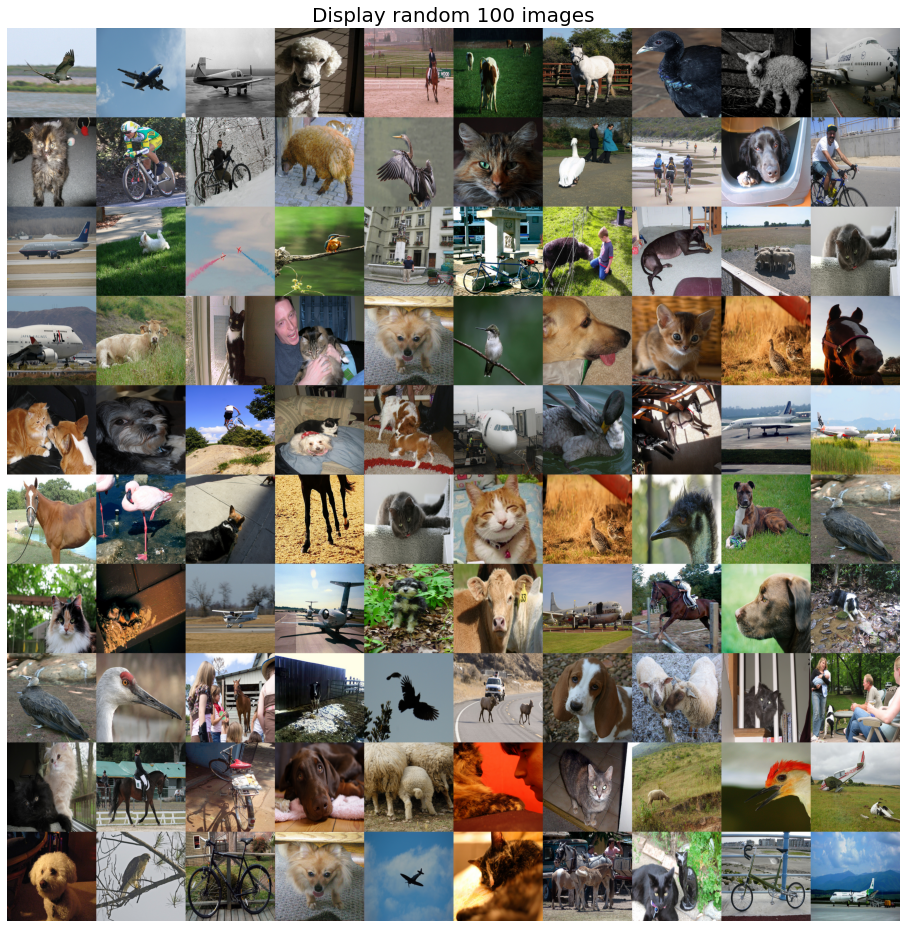

In [0]:
num_test_images = 100
random_indices = [random.randint(0, x_train.shape[0]) for i in range(num_test_images)] 
vStack = []
for j in range(10):
    h_list = [x_train[random_indices[i+j*10]] for i in range(10)]
    h_tuple = tuple(h_list)
    vStack.append(np.hstack((h_tuple)))

image_list = [tuple(vStack[j]) for j in range(10)]
image = np.vstack((tuple(image_list)))

plt.figure(figsize=(16,50))
plt.title('Display random 100 images', fontsize=20)
plt.axis('off')
plt.imshow(image)

### Training the model with pre trained weights

1.   Pretrained weights used : VGG16
2.   Data set on which the model is trained on : image net
3.   Number of epochs : 75
4.   




In [0]:
'''
from keras import applications
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense, GlobalAveragePooling2D

base_model = applications.VGG16(weights = 'imagenet', include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(8, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics = ['accuracy'])

model.summary()

model.fit(x_train, y_train,
          batch_size = 50,
          epochs = 150,
          validation_split = 0.1)
model.save('transfer_learning__classifier_model.h5')
'''


Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0   

In [0]:
# serialize model to JSON
model_json = model.to_json()
with open("transfer_learning_classifier_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("transfer_learning_classifier_model.h5")
   

In [0]:

model = load_model('transfer_learning__classifier_model.h5')
rep=  ['bird', 'cat', 'cow', 'dog', 'horse', 'sheep', 'aeroplane','bicycle'] 

In [0]:
y_predict_test = model.predict(x_train)

In [0]:
plt.imshow(x_train[15], cmap='gray')


y =y_predict_test[15]
y1 = y_train[15]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

In [0]:
plt.imshow(x_train[35], cmap='gray')


y =y_predict_test[35]
y1 = y_train[35]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

In [0]:
plt.imshow(x_train[600], cmap='gray')


y =y_predict_test[600]
y1 = y_train[600]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

In [0]:
plt.imshow(x_train[1000], cmap='gray')


y =y_predict_test[1000]
y1 = y_train[1000]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]
print(y)

print('predicted_class:',name)
print('Actual_class:',name1)

In [0]:
plt.imshow(x_train[900], cmap='gray')


y =y_predict_test[900]
y1 = y_train[900]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

In [0]:
plt.imshow(x_train[700], cmap='gray')


y =y_predict_test[700]
y1 = y_train[700]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

In [0]:
y_predict_test = model.predict(x_val)

predicted_class: dog
Actual_class: dog


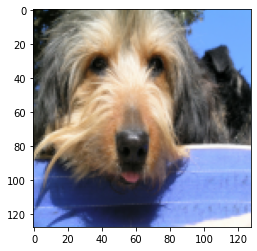

In [0]:
plt.imshow(x_val[700], cmap='gray')


y =y_predict_test[700]
y1 = y_val[700]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

predicted_class: horse
Actual_class: horse


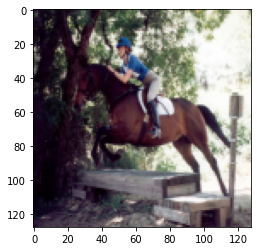

In [0]:
plt.imshow(x_val[1000], cmap='gray')


y =y_predict_test[1000]
y1 = y_val[1000]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

predicted_class: dog
Actual_class: cat


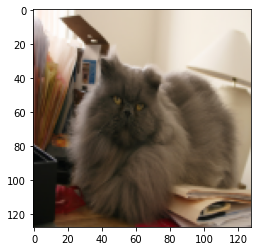

In [0]:
plt.imshow(x_train[500], cmap='gray')


y =y_predict_test[500]
y1 = y_train[500]
name=rep[np.argmax(y)]
name1=rep[np.argmax(y1)]

print('predicted_class:',name)
print('Actual_class:',name1)

## **3.4 Semantic segmentation**

### ***3.4.1 From scratch***

We will implement a segmentation model following the "skip connections" approach.

https://divamgupta.com/image-segmentation/2019/06/06/deep-learning-semantic-segmentation-keras.html

https://github.com/divamgupta/image-segmentation-keras/blob/master/keras_segmentation/train.py

A segmentation task differs from classification in that you want to label every single pixel in
the image (not just one label for entire image). Imagine that you are classifying the central
pixel of the image (a 1x1 output) based on its surroundings (a NxN input). In order to label
every pixel in the image, we can reformulate one NxN image as being N2 pixel-wise examples,
each having a different pixel in the center that gets classified based on a surrounding window
[Cir+12]. Later, more parallel implementations closely follow the encoder-decoder structure,
by using convolutional layers to encode and transposed convolution (a.k.a. deconvolution)
layers to decode directly into pixel-wise predictions [LSD15]. The loss function which you
should have used for the classification task is then applied to and averaged across all the
pixels. From this, one of the most popular networks for image segmentation was derived by
adding so-called skip connections from encoding layers to their corresponding decoding layers
at the same scale [RFB15] to enhance learning in earlier layers and improve the reconstruction
of feature maps at a higher resolution from feature maps at a lower resolution.

In [0]:
from lxml import etree
import xml.etree.ElementTree as ET
from PIL import Image
import numpy as np
import cv2
import pandas as pd
import os
import pickle
import matplotlib.pyplot as plt
from skimage import io
from skimage.transform import resize
import random

import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.models import model_from_json
from keras.layers import Input, Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.optimizers import SGD, Adam
from keras import backend as K
from keras.models import Model



Using TensorFlow backend.


##### **3.4.1.1 Binary Classification**






In [0]:
# parameters that you should set before running this script
voc_root_folder = "/content/VOCdevkit/"
image_size = 128    # image size that you will use for your network (input images will be resampled to this size), lower if you have troubles on your laptop (hint: use io.imshow to inspect the quality of the resampled images before feeding it into your network!)
img_rows, img_cols = image_size, image_size
n_channels = 3

In [0]:

codes = np.array(["background","aeroplane","bicycle","bird","boat","bottle","bus","car","cat","chair","cow","diningtable","dog","horse","motorbike","person","pottedplant","sheep","sofa","train","tvmonitor"])
 #(1=aeroplane, 2=bicycle, 3=bird, 4=boat, 5=bottle, 6=bus, 7=car , 8=cat, 9=chair, 10=cow, 11=diningtable, 12=dog, 13=horse, 14=motorbike, 15=person, 16=potted plant, 17=sheep, 18=sofa, 19=train, 20=tv/monitor)

In [0]:
# step1 - build list of filtered filenames
annotation_folder = os.path.join(voc_root_folder, "VOC2009/Annotations/")
annotation_files = os.listdir(annotation_folder)
filtered_filenames = []
for a_f in annotation_files:
    tree = etree.parse(os.path.join(annotation_folder, a_f))
    if np.any([tag.text == filt for tag in tree.iterfind("./name") for filt in filter]):
        filtered_filenames.append(a_f[:-4])

# step2 - build (x,y) for TRAIN/VAL (classification)
classes_folder = os.path.join(voc_root_folder, "VOC2009/ImageSets/Segmentation/")
classes_files = os.listdir(classes_folder)
seg_train_files = [os.path.join(classes_folder, c_f) for c_f in classes_files if 'train.txt' in c_f]
seg_val_files = [os.path.join(classes_folder, c_f) for c_f in classes_files if 'val.txt' in c_f]

In [0]:
print(seg_train_files)

['/content/VOCdevkit/VOC2009/ImageSets/Segmentation/train.txt']


In [0]:
seg_train_files

['/content/VOCdevkit/VOC2009/ImageSets/Segmentation/train.txt']

In [0]:
ann_files = [os.path.join(annotation_folder, a_f) for a_f in annotation_files]
columns = ['Filename','Fileid','Width','Height','Object_Name','Pose','Xmin','Ymin','Xmax','Ymax']
annotations_df = pd.DataFrame(columns=columns) #Each row corresponds to a segmented image
for ann_file in ann_files:
    tree = ET.parse(ann_file)
    root = tree.getroot()
    xmin,ymin,xmax,ymax = 0,0,0,0
    for elem in root:
        if elem.tag == 'filename':
            filename = elem.text
            fileid = filename[:10]
        if elem.tag == 'size':
            for e in elem:
                if e.tag == 'width':
                    width = e.text
                    #print(width)
                if e.tag == 'height':
                    height = e.text
                    #print(height)
        if elem.tag == 'object':
            for e in elem:
                if e.tag == 'name':
                    name = e.text
                if e.tag == 'pose':
                    pose = e.text
                   # print("pose",pose)
                if e.tag == 'bndbox':
                    for b in e:
                        if b.tag == 'xmin':
                            xmin = b.text
                        if b.tag == 'ymin':
                            ymin = b.text
                        if b.tag == 'xmax':
                            xmax = b.text
                        if b.tag == 'ymax':
                            ymax = b.text
                    df = pd.DataFrame([[filename,fileid,width,height,name,pose,xmin,ymin,xmax,ymax]],columns = columns)
                    annotations_df = annotations_df.append(df)
    

In [0]:
annotations_df.reset_index(drop=True,inplace=True)
annotations_df.to_csv('annotations_df.csv')
print(annotations_df.shape)
annotations_df.head()  

(21544, 10)


,Filename,Fileid,Width,Height,Object_Name,Pose,Xmin,Ymin,Xmax,Ymax
0,2008_005653.jpg,2008_00565,500,386,train,Frontal,210,82,500,341
1,2009_004765.jpg,2009_00476,500,386,bird,Frontal,82,37,261,365
2,2009_004765.jpg,2009_00476,500,386,bird,Frontal,187,177,470,282
3,2008_002418.jpg,2008_00241,357,500,person,Unspecified,63,29,264,422
4,2008_002418.jpg,2008_00241,357,500,bicycle,Right,40,201,309,475


###### **Get the data for training and validation.**

Group all the objects into one to perform binary image segmentation.
Keep the training images the way it is
But divide the validation set into two parts: one for validation & other for testing

In [0]:
#Training
image_path = os.path.join(voc_root_folder, "VOC2009/JPEGImages/")
segmentation_classes_path = os.path.join(voc_root_folder, "VOC2009/SegmentationClass/")

file = open(seg_train_files[0], 'r') 
seg_train_filenames = file.read().splitlines()

seg_train_images = []
segmented_images = []
grayscale_images = []
binary_segmented_images = []
for img_name in seg_train_filenames:
    img = io.imread(image_path+img_name+'.jpg')
    img = cv2.resize(img, dsize=(img_rows,img_cols), interpolation=cv2.INTER_CUBIC) #Resize the images
    seg_train_images.append(img)
    
    seg_img = io.imread(segmentation_classes_path+img_name+'.png')
    seg_img = cv2.resize(seg_img, dsize=(img_rows,img_cols), interpolation=cv2.INTER_CUBIC) #Resize the segments
    segmented_images.append(seg_img)
    
    #Gray scale image of the original image
    grayscale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    grayscale_img = cv2.cvtColor(grayscale_img, cv2.COLOR_GRAY2BGR)
    grayscale_images.append(grayscale_img)
    
    #Group the objects into one intensity and do binary image segmentation
    binary_seg_img = cv2.cvtColor(seg_img, cv2.COLOR_BGR2GRAY)
    binary_seg_img = 255*((binary_seg_img>0).astype('uint8'))
    binary_seg_img = cv2.cvtColor(binary_seg_img, cv2.COLOR_GRAY2BGR)
    binary_segmented_images.append(binary_seg_img)

segmentation_class_train_df = pd.DataFrame()
segmentation_class_train_df['Image_Name'] = seg_train_filenames
segmentation_class_train_df['Image_Array'] = seg_train_images
segmentation_class_train_df['Segmented_Image_Array'] = segmented_images
segmentation_class_train_df['Grayscale_Image_Array'] = grayscale_images
segmentation_class_train_df['Binary_Segmented_Image_Array'] = binary_segmented_images

segmentation_class_train_df = segmentation_class_train_df.sample(frac=1) #Shuffle the rows so different classes are mixed
segmentation_class_train_df.reset_index(drop=True,inplace=True)
print('Saving training images')
#segmentation_class_train_df.to_pickle('X_Train_Segmentation_'+str(img_rows)+'.pkl') #Save the dataframe to pickle
print('Saved ' + str(segmentation_class_train_df.shape[0]) + ' images')

print(segmentation_class_train_df.shape)
segmentation_class_train_df.head()

Saving training images
Saved 749 images
(749, 5)


,Image_Name,Image_Array,Segmented_Image_Array,Grayscale_Image_Array,Binary_Segmented_Image_Array
0,2009_005287,"[[[247, 247, 247], [248, 248, 248], [248, 248,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[247, 247, 247], [248, 248, 248], [248, 248,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,2009_001140,"[[[81, 81, 31], [80, 81, 27], [84, 85, 29], [8...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[66, 66, 66], [65, 65, 65], [68, 68, 68], [6...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,2007_002142,"[[[70, 25, 4], [71, 24, 4], [72, 25, 5], [73, ...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[24, 24, 24], [23, 23, 23], [24, 24, 24], [2...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,2008_003381,"[[[218, 234, 255], [216, 232, 255], [214, 232,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[238, 238, 238], [237, 237, 237], [237, 237,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
4,2007_007698,"[[[125, 160, 200], [127, 163, 201], [125, 163,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[168, 168, 168], [170, 170, 170], [170, 170,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


###### Visualization of *images*

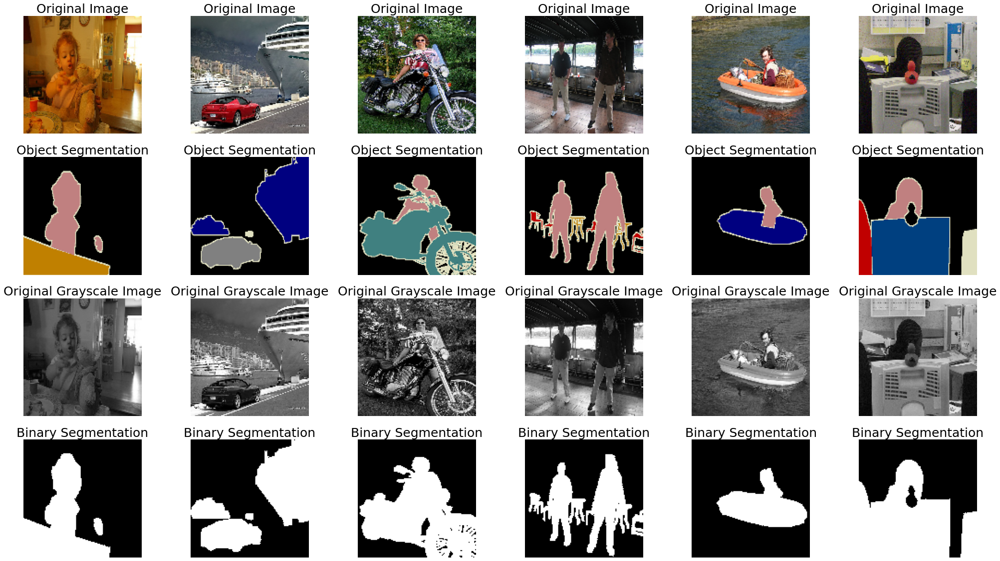

In [0]:

random_indices = [random.randint(0, segmentation_class_train_df.shape[0]) for i in range(6)] 
fig = plt.figure(figsize=(35,20))
ax = fig.subplots(4, 6)
i=0
for index in random_indices:
    actual = segmentation_class_train_df.iloc[index]['Image_Array']
    segmented = segmentation_class_train_df.iloc[index]['Segmented_Image_Array']
    actual_grayscale = segmentation_class_train_df.iloc[index]['Grayscale_Image_Array']
    binary_segmented = segmentation_class_train_df.iloc[index]['Binary_Segmented_Image_Array']
    ax[0,i].imshow(actual)
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(segmented)
    ax[1,i].axis('off')
    ax[1,i].set_title('Object Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[2,i].imshow(actual_grayscale)
    ax[2,i].axis('off')
    ax[2,i].set_title('Original Grayscale Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[3,i].imshow(binary_segmented, cmap='gray')
    ax[3,i].axis('off')
    ax[3,i].set_title('Binary Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

###### Validation images

In [0]:
#Validation images
file = open(seg_val_files[0], 'r') 
temp_filenames = file.read().splitlines()
seg_val_filenames = [f_n for f_n in temp_filenames if f_n not in seg_train_filenames]

seg_val_images = []
segmented_images = []
grayscale_images = []
binary_segmented_images = []
for img_name in seg_val_filenames:
    img = io.imread(image_path+img_name+'.jpg')
    img = cv2.resize(img, dsize=(img_rows,img_cols), interpolation=cv2.INTER_CUBIC) #Resize the images
    seg_val_images.append(img)
    
    seg_img = io.imread(segmentation_classes_path+img_name+'.png')
    seg_img = cv2.resize(seg_img, dsize=(img_rows,img_cols), interpolation=cv2.INTER_CUBIC) #Resize the segments
    segmented_images.append(seg_img)
    
    #Gray scale image of the original image
    grayscale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    grayscale_img = cv2.cvtColor(grayscale_img, cv2.COLOR_GRAY2BGR)
    grayscale_images.append(grayscale_img)
    
    #Group the objects into one intensity and do binary image segmentation    
    binary_seg_img = cv2.cvtColor(seg_img, cv2.COLOR_BGR2GRAY)
    binary_seg_img = 255*((binary_seg_img>0).astype('uint8'))
    binary_seg_img = cv2.cvtColor(binary_seg_img, cv2.COLOR_GRAY2BGR)
    binary_segmented_images.append(binary_seg_img)
    
segmentation_class_val_df = pd.DataFrame()
segmentation_class_val_df['Image_Name'] = seg_val_filenames
segmentation_class_val_df['Image_Array'] = seg_val_images
segmentation_class_val_df['Segmented_Image_Array'] = segmented_images
segmentation_class_val_df['Grayscale_Image_Array'] = grayscale_images
segmentation_class_val_df['Binary_Segmented_Image_Array'] = binary_segmented_images

segmentation_class_val_df = segmentation_class_val_df.sample(frac=1) #Shuffle the rows so different classes are mixed
segmentation_class_val_df.reset_index(drop=True,inplace=True)

#Divide the validation data into two equal halves - one for validation and other for test
segmentation_class_test_df = segmentation_class_val_df[np.int(segmentation_class_val_df.shape[0]/2):]  #Contains the test image (375 segmented images)
segmentation_class_test_df.reset_index(drop=True,inplace=True)
print(segmentation_class_test_df.shape)

segmentation_class_val_df = segmentation_class_val_df[:np.int(segmentation_class_val_df.shape[0]/2)]   #Contains the validation image (375 segmented images)
segmentation_class_val_df.reset_index(drop=True,inplace=True)
print(segmentation_class_val_df.shape)

print('Saving validation images')
#segmentation_class_val_df.to_pickle('X_Val_Segmentation_'+str(img_rows)+'.pkl') #Save the dataframe to pickle
print('Saved ' + str(segmentation_class_val_df.shape[0]) + ' images')
print(segmentation_class_val_df.shape)
segmentation_class_val_df.head()

(375, 5)
(375, 5)
Saving validation images
Saved 375 images
(375, 5)


,Image_Name,Image_Array,Segmented_Image_Array,Grayscale_Image_Array,Binary_Segmented_Image_Array
0,2008_000589,"[[[170, 170, 158], [170, 170, 158], [170, 170,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[166, 166, 166], [166, 166, 166], [166, 166,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,2008_001966,"[[[255, 241, 236], [236, 222, 194], [203, 192,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[241, 241, 241], [215, 215, 215], [184, 184,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,2008_002900,"[[[255, 255, 255], [255, 255, 255], [255, 255,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[255, 255, 255], [255, 255, 255], [255, 255,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,2009_004043,"[[[97, 101, 47], [88, 97, 40], [92, 96, 40], [...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[84, 84, 84], [79, 79, 79], [79, 79, 79], [8...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
4,2008_000763,"[[[153, 139, 127], [148, 133, 119], [142, 126,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[137, 137, 137], [131, 131, 131], [123, 123,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


###### Testing Images

In [0]:
#Testing images
print('Saving test images')
#segmentation_class_test_df.to_pickle('X_Test_Segmentation_'+str(img_rows)+'.pkl') #Save the dataframe to pickle
print('Saved ' + str(segmentation_class_test_df.shape[0]) + ' images')
print(segmentation_class_test_df.shape)
segmentation_class_test_df.head()

Saving test images
Saved 375 images
(375, 5)


,Image_Name,Image_Array,Segmented_Image_Array,Grayscale_Image_Array,Binary_Segmented_Image_Array
0,2009_000840,"[[[28, 18, 10], [33, 24, 9], [32, 22, 14], [26...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[17, 17, 17], [21, 21, 21], [21, 21, 21], [1...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,2007_005460,"[[[5, 5, 5], [7, 7, 7], [3, 3, 3], [7, 7, 7], ...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[5, 5, 5], [7, 7, 7], [3, 3, 3], [7, 7, 7], ...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,2007_000332,"[[[205, 184, 184], [222, 225, 199], [216, 202,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[186, 186, 186], [217, 217, 217], [202, 202,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,2008_002358,"[[[107, 112, 106], [94, 110, 108], [16, 98, 10...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[110, 110, 110], [108, 108, 108], [90, 90, 9...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
4,2009_003080,"[[[179, 203, 237], [178, 203, 237], [179, 203,...","[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[[[210, 210, 210], [210, 210, 210], [211, 211,...","[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


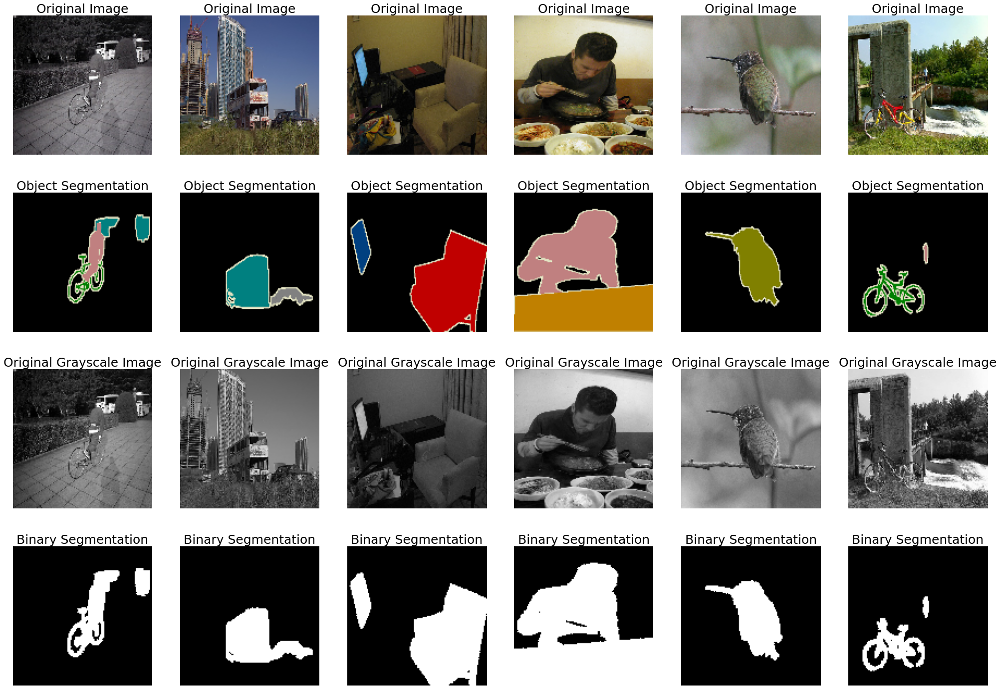

In [0]:
random_indices = [random.randint(0, segmentation_class_val_df.shape[0]) for i in range(6)] 
fig = plt.figure(figsize=(35,25))
ax = fig.subplots(4, 6)
i=0
for index in random_indices:
    actual = segmentation_class_val_df.iloc[index]['Image_Array']
    segmented = segmentation_class_val_df.iloc[index]['Segmented_Image_Array']
    actual_grayscale = segmentation_class_val_df.iloc[index]['Grayscale_Image_Array']
    binary_segmented = segmentation_class_val_df.iloc[index]['Binary_Segmented_Image_Array']
    ax[0,i].imshow(actual)
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(segmented)
    ax[1,i].axis('off')
    ax[1,i].set_title('Object Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[2,i].imshow(actual_grayscale)
    ax[2,i].axis('off')
    ax[2,i].set_title('Original Grayscale Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[3,i].imshow(binary_segmented, cmap='gray')
    ax[3,i].axis('off')
    ax[3,i].set_title('Binary Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

Define the  mtrics to test the performance of the model


* Dice score
* Dice Score Loss
* Jaccard Score metric

In [0]:
#Metrics for Keras
from keras import backend as K
from keras.losses import binary_crossentropy
  
#Dice Score Metric
def dice_coef(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
  
#Dice Score Loss
def dice_p_bce(in_gt, in_pred):
    return 0.0*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)

#Jaccard Score Metric
def jaccard_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (intersection + smooth) / (union + smooth), axis=0)   

In [0]:
#segmentation_class_train_df = pd.read_pickle('X_Train_Segmentation_128.pkl')
#segmentation_class_val_df = pd.read_pickle('X_Val_Segmentation_128.pkl')
#segmentation_class_test_df = pd.read_pickle('X_Test_Segmentation_128.pkl')

x_train = np.array(segmentation_class_train_df['Image_Array'].values.tolist())
print(x_train.shape)
x_train_grayscale = np.array(segmentation_class_train_df['Grayscale_Image_Array'].values.tolist())
print(x_train_grayscale.shape)
y_train = np.array(segmentation_class_train_df['Binary_Segmented_Image_Array'].values.tolist())
print(y_train.shape)

x_val = np.array(segmentation_class_val_df['Image_Array'].values.tolist())
print(x_val.shape)
x_val_grayscale = np.array(segmentation_class_val_df['Grayscale_Image_Array'].values.tolist())
print(x_val_grayscale.shape)
y_val = np.array(segmentation_class_val_df['Binary_Segmented_Image_Array'].values.tolist())
print(y_val.shape)

x_test = np.array(segmentation_class_test_df['Image_Array'].values.tolist())
print(x_test.shape)
x_test_grayscale = np.array(segmentation_class_test_df['Grayscale_Image_Array'].values.tolist())
print(x_test_grayscale.shape)
y_test = np.array(segmentation_class_test_df['Binary_Segmented_Image_Array'].values.tolist())
print(y_test.shape)

(749, 128, 128, 3)
(749, 128, 128, 3)
(749, 128, 128, 3)
(375, 128, 128, 3)
(375, 128, 128, 3)
(375, 128, 128, 3)
(375, 128, 128, 3)
(375, 128, 128, 3)
(375, 128, 128, 3)


###### **Auto-encoder like structure for binary segmentation**¶
The training is performed using the convolutional auto-encoder with input being the original image and output being the binary segmented image like shown in the figure below:
Auto encoder is a simple network with :


* Total params: 52,975
* Trainable params: 52,521
* Non-trainable params: 454

In [0]:
#CONV Auto-encoder like structure for pixelwise classification
n_epochs = 2
n_batches = 256
#Run on Google Colab. Takes time

input_img = Input(shape=(img_rows, img_cols, n_channels))
layer = Conv2D(64, (3, 3), padding='same')(input_img)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = MaxPooling2D((2, 2), padding='same')(layer)
layer = Conv2D(32, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = MaxPooling2D((2, 2), padding='same')(layer)
layer = Conv2D(16, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
encoded = MaxPooling2D((2, 2), padding='same', name='code')(layer)

layer = Conv2D(16, (3, 3), padding='same')(encoded)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = UpSampling2D((2, 2))(layer)
layer = Conv2D(32, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = UpSampling2D((2, 2))(layer)
layer = Conv2D(64, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = UpSampling2D((2, 2))(layer)
layer = Conv2D(3, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
decoded = Activation('sigmoid')(layer)

binary_segmenter_model = Model(input_img, decoded)
print(binary_segmenter_model.summary())
binary_segmenter_model.compile(optimizer='adam', loss=[dice_coef]) #Try with other optimizers like 'adadelta'
#binary_crossentropy loss function provided a better iou & dice score than cosine_proximity or logcosh
#With default metrics, I got a better performance

history = binary_segmenter_model.fit(x_train, y_train,epochs=n_epochs,batch_size=n_batches,verbose=1,
                                     validation_data=(x_val, y_val),shuffle=True)

# serialize model to JSON
model_json = binary_segmenter_model.to_json()
with open("binary_segmenter_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
binary_segmenter_model.save_weights("binary_segmenter_model.h5")
with open('binary_segmenter_model_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

print("Saved model & history to disk")


In [0]:
#load json and create model
json_file = open('binary_segmenter_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
binary_segmenter_model = model_from_json(loaded_model_json)
# load weights into new model
binary_segmenter_model.load_weights("binary_segmenter_model.h5")
print("Loaded model from disk")
binary_segmenter_model.summary()

Loaded model from disk
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
batch_normalization_8 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
activation_8 (Activation)    (None, 128, 128, 64)      0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 64, 64, 32)        18464     
_________________________________________________________________
batch_normalization_9 (Batch (None, 

###### Prediction using the binary trained model

Mean IoU score on the test set is: 0.3935693121102263
Mean Dice score on the test set is: 0.82604855207388


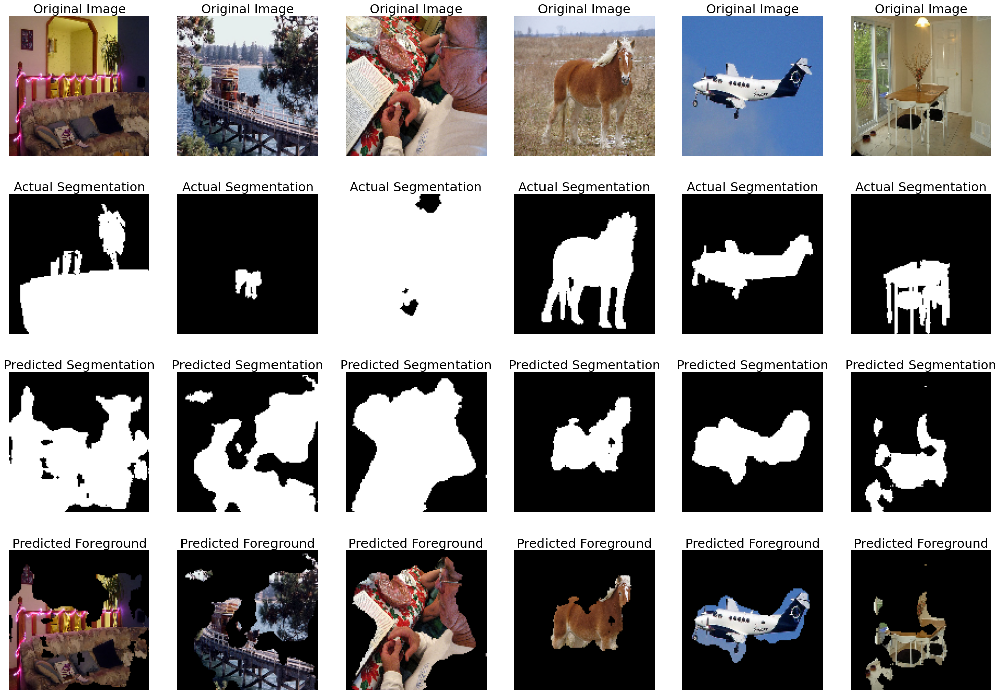

In [0]:
y_test_predict = binary_segmenter_model.predict(x_test)

y_test_predict_list = []
iou_scores_list = []
dice_scores_list = []
for i in range(len(y_test_predict)):
    y_test_pred_i = cv2.cvtColor(y_test_predict[i], cv2.COLOR_BGR2GRAY)
    y_test_pred_i = 255*((y_test_pred_i<=0.5).astype('uint8'))
    y_test_pred_i = cv2.cvtColor(y_test_pred_i, cv2.COLOR_GRAY2BGR)
    y_test_predict_list.append(y_test_pred_i)

    actual = y_test[i]
    predicted = y_test_pred_i
    axes = tuple(range(1, len(y_test_pred_i.shape)-1)) 

    intersection = np.logical_and(actual, predicted)
    union = np.logical_or(actual, predicted)
    iou_score = np.sum(intersection) / np.sum(union)
    iou_scores_list.append(iou_score)


    numerator = 2. * np.sum(predicted * actual, axes)
    denominator = np.sum(np.square(predicted) + np.square(actual), axes)
    dice_score =  1 - np.mean(numerator / (denominator+100)) # average over classes and batch
    dice_scores_list.append(dice_score)
  
y_test_predict = np.array(y_test_predict_list)

print('Mean IoU score on the test set is: ' + str(np.mean(iou_scores_list)))
print('Mean Dice score on the test set is: ' + str(np.mean(dice_scores_list)))

random_indices = [random.randint(0, segmentation_class_val_df.shape[0]) for i in range(6)] 
random_indices = [126, 216, 58, 166, 132, 50]
fig = plt.figure(figsize=(35,25))
ax = fig.subplots(4, 6)
i=0

for index in random_indices:
    actual_image = x_test[index]
    segmented_image = y_test[index]
    predicted_segmented_image = y_test_predict[index]
    
    ax[0,i].imshow(actual_image, cmap='gray')
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(segmented_image)
    ax[1,i].axis('off')
    ax[1,i].set_title('Actual Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[2,i].imshow(predicted_segmented_image, cmap='gray')
    ax[2,i].axis('off')
    ax[2,i].set_title('Predicted Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[3,i].imshow(cv2.subtract(actual_image,255-predicted_segmented_image))
    ax[3,i].axis('off')
    ax[3,i].set_title('Predicted Foreground', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1

plt.show()

#### 3.4.1.2 From Scrach Multiclass Segmentation

Here we are going to perform from the scrach training for multiclass segmentation

#####Preparing the data
First, we put our training, validation and test images in separate folders

In [0]:
from sklearn.model_selection import train_test_split
import os 

# Get list of img ids
img_ids = [os.path.splitext(filename)[0] for filename in os.listdir(images_path)]
# Get list of ids of images prepared for segmentation
segmentation_ids = [os.path.splitext(filename)[0] for filename in os.listdir(class_segmentation_path)]

# Seed necessary to get the same datasets each time the cell is run
seed = 12374

# Training set = 65%, validation + test = 35%
train_ids, valtest = train_test_split(img_ids, test_size=0.35, random_state=seed)

# Validation = 20%, test = 15%
validation_ids, test_ids = train_test_split(valtest, test_size=0.43, random_state=seed)

# Only some images are prepared for segmentation, so the data subsets are filtered for this task
train_ids_segmentation = list(filter(lambda id: id in segmentation_ids, train_ids))
validation_ids_segmentation = list(filter(lambda id: id in segmentation_ids, validation_ids))
test_ids_segmentation = list(filter(lambda id: id in segmentation_ids, test_ids))

In [0]:
from shutil import copyfile
import os 

# Prepare segmentation dataset
def move_images(imgs_path, segments_path, ids):
  for id in ids:
    image_filename = id + ".jpg"
    full_path_image = images_path + image_filename
    copyfile(full_path_image, imgs_path + image_filename)

    segment_filename = id + ".png"
    full_path_segment = class_segmentation_path + segment_filename
    copyfile(full_path_segment, segments_path + segment_filename)

# Train 
train_images_path = "/content/segmentation_dataset/train/images/"
os.makedirs(train_images_path, exist_ok=True)

train_segments_path = "/content/segmentation_dataset/train/segments/"
os.makedirs(train_segments_path, exist_ok=True)

move_images(train_images_path, train_segments_path, train_ids_segmentation)

# Validation
val_images_path = "/content/segmentation_dataset/val/images/"
os.makedirs(val_images_path, exist_ok=True)

val_segments_path = "/content/segmentation_dataset/val/segments/"
os.makedirs(val_segments_path, exist_ok=True)

move_images(val_images_path, val_segments_path, validation_ids_segmentation)

# Test
test_images_path = "/content/segmentation_dataset/test/images/"
os.makedirs(test_images_path, exist_ok=True)

test_segments_path = "/content/segmentation_dataset/test/segments/"
os.makedirs(test_segments_path, exist_ok=True)

move_images(test_images_path, test_segments_path, test_ids_segmentation)

NameError: ignored

#####Pre-processing the data
The VOC 2009 segmentation dataset comes in a peculiar format: each pixel has a different colour depending on its class.

There are, in total, 23 classes. 20 of them correspond to the different types of objects present in the dataset. Then there's one for the background, one for the separation lines, and one for unlabelled pixels.

In order for us to be able to use these segmentation images, we need to convert them to a more comprehensive format:

First, all images are cropped to the same dimensions, in our case 256x256. We do not resize them, as doing this would distort the RGB pixel values.
Then each pixel RGB value is replaced by its class value. E.g. [0, 64, 128] becomes [7]
Then, each pixel is one hot encoded. As there are 23 classes, each pixel is replaced by an array of length 23 representing the pixel class. For example, if a pixel corresponds to class 12, the 12th element of the array will have a value of 1 and the rest will be zero. [0, ..., 1, ..., 0]
The final dimensions of our data array are (number of examples, height, width, number of classes), more specifically (982, 256, 256, 23).

In [0]:
from os import listdir
import cv2
import numpy as np
import tensorflow as tf

def load_train_data():

  # Format segment images to comply with the segmentation library specs
  # The pixel values indicate the class(not the pixel indices as in the original dataset)
  # Pixel values of every class
  # 23 classes in total -> 20 object classes + background + unlabeled + separation line
  palette = [[0, 0, 0], #background
             
              [0, 0, 64],
              [0, 0, 128],
              [0, 0, 192],
              [0, 64, 0],
              [0, 128, 0],
              [0, 192, 0],
              [0, 64, 128],
              [0, 128, 64],
              [0, 128, 128],
              [0, 128, 192],
              [0, 192, 128],
              [128, 0, 0],
              [128, 0, 64],
              [128, 0, 128],
              [128, 0, 192],
              [128, 64, 0],
              [128, 128, 0],
              [128, 128, 64],
              [128, 128, 128],
              [128, 128, 192],
             
              [192, 224, 224], # separating line
              [255, 255, 255]] # unlabelled

  dim = 256

  print("Formatting training dataset...")

  n = 1
  total = len(listdir(train_segments_path))
  x_train = []
  y_train = []
  for f in listdir(train_segments_path):
    print(str(n) + "/" + str(total))

    # Image
    img = cv2.imread(train_images_path + f[:-3] + "jpg")
    if(img.shape[0] < dim or img.shape[1] < dim):
      continue
    img = img[0:dim, 0:dim]
    x_train.append(img)

    # Segment
    segment = cv2.imread(train_segments_path + f)
    segment = segment[0:dim, 0:dim]
    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(segment, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)
    y_train.append(one_hot_map.numpy())
    n += 1

  x_train = np.array(x_train)
  y_train = np.array(y_train)

  print("Done!")


  print("Formatting validation dataset...")

  n = 1
  total = len(listdir(val_segments_path))
  x_val = []
  y_val = []
  for f in listdir(val_segments_path):
    #print(str(n) + "/" + str(total))

    # Image
    img = cv2.imread(val_images_path + f[:-3] + "jpg")
    if(img.shape[0] < dim or img.shape[1] < dim):
      continue
    img = img[0:dim, 0:dim]
    x_val.append(img)

    # Segment
    segment = cv2.imread(val_segments_path + f)
    segment = segment[0:dim, 0:dim]
    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(segment, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)
    y_val.append(one_hot_map.numpy())
    n += 1

  x_val = np.array(x_val)
  y_val = np.array(y_val)

  print("Done!")

  return x_train, y_train, x_val, y_val
# load data
x_train, y_train, x_val, y_val = load_train_data()

Formatting training dataset...
1/963
2/963
3/963
4/963
5/963
6/963
7/963
8/963
9/963
10/963
11/963
12/963
13/963
14/963
15/963
15/963
16/963
17/963
18/963
19/963
20/963
21/963
22/963
23/963
24/963
25/963
26/963
27/963
28/963
29/963
30/963
31/963
32/963
33/963
34/963
35/963
36/963
37/963
38/963
39/963
40/963
41/963
42/963
43/963
44/963
45/963
46/963
47/963
48/963
49/963
50/963
51/963
52/963
53/963
54/963
55/963
56/963
57/963
57/963
58/963
59/963
60/963
61/963
62/963
63/963
64/963
65/963
66/963
67/963
68/963
69/963
70/963
71/963
72/963
73/963
74/963
75/963
76/963
77/963
78/963
79/963
80/963
81/963
82/963
83/963
84/963
85/963
86/963
87/963
88/963
89/963
90/963
91/963
92/963
93/963
94/963
95/963
96/963
97/963
98/963
99/963
100/963
101/963
102/963
103/963
104/963
105/963
106/963
107/963
108/963
109/963
110/963
111/963
112/963
113/963
114/963
115/963
116/963
117/963
118/963
119/963
120/963
121/963
122/963
123/963
124/963
125/963
126/963
127/963
128/963
129/963
130/963
131/963
132/963
133/963

#####Building and training the model
Our final segmentation model has the following architecture:


Resnet18 as backbone
Unet as model skeleton
Adam as optimizer
Softmax activation
Categorical cross-entropy as loss function
Categorical accuracy as metric
Several other options were tested, but they gave worse results. A non-exhaustive list of the things we tried includes: sigmoid activation, SGD optimizer, Dice loss function, normalized input data.


The architecture has :
* Total params: 14,343,760
* Trainable params: 14,333,834
* Non-trainable params: 9,926
______________________________


In [0]:
import segmentation_models as sm
from segmentation_models.metrics import iou_score, f1_score
from keras.metrics import categorical_accuracy
from keras.callbacks import ModelCheckpoint
from keras import optimizers
import pickle 

# define backbone of the model
BACKBONE = 'resnet18'
preprocess_input = sm.get_preprocessing(BACKBONE)

# preprocess input
x_train_f = preprocess_input(x_train)
x_val_f = preprocess_input(x_val)

# define loss function
categorical_loss = sm.losses.CategoricalCELoss() 

# define and compile the model
model = sm.Unet(BACKBONE, classes=23, activation='softmax')
model.compile(
    'Adam',
    loss=categorical_loss,
    metrics=[categorical_accuracy],
  )

# visualize model architecture
model.summary()

# weights checkpoint
filepath="/content/Fromthescrach-model-{epoch:02d}-{val_categorical_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_categorical_accuracy', verbose=1, save_best_only=False, mode='max')
callbacks_list = [checkpoint]

# fit model
history = model.fit(
   x=x_train_f,
   y=y_train,
   batch_size=16,
   epochs=50,
   validation_data=(x_val_f, y_val),
   callbacks=callbacks_list,
)

# serialize model to JSON
model_json = model.to_json()
with open("/content/Fromthescrach_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("/content/Fromthescrach_model.h5")
# serialize training history for later visualization
with open('/content/TL_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, None, None, 3 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, None, None, 3 9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_19 (ZeroPadding2 (None, None, None, 3 0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, None, None, 6 9408        zero_padding2d_19[0][0]          
____________________________________________________________________________________________

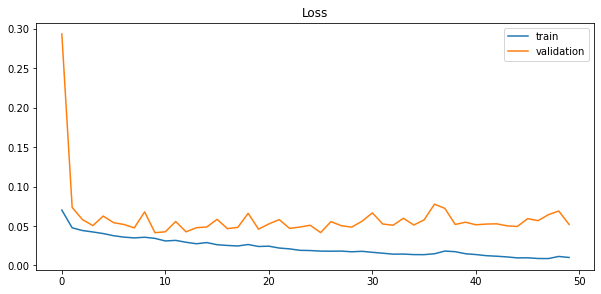

In [0]:
import matplotlib.pyplot as plt
import pickle

with open("/content/TL_history_dict", "rb") as pickle_file:
    history = pickle.load(pickle_file)


    plt.figure(figsize=(10,10))
    # plot loss during training
    plt.subplot(211)
    plt.title('Loss')
    plt.plot(history['loss'], label='train')
    plt.plot(history['val_loss'], label='validation')
    plt.legend()
    # plot accuracy during training
    '''
    plt.subplot(212)
    plt.title('Accuracy')
    #plt.plot(history['accuracy'], label='train')
    plt.plot(history['val_accuracy'], label='validation')
    plt.legend()
    plt.show()
    '''

In [0]:
from keras.models import model_from_json

# Load trained model
print("Loading model...")
json_file = open('/content/Fromthescrach_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/content/Fromthescrach_model.h5")
print("Model loaded!")

Loading model...
Model loaded!


In [0]:
def plot_results(x_test, y_test, masks):
  fig = plt.figure(figsize=(35,20))
  ax = fig.subplots(3, 5)

  indices = [0, 15, 23, 30, 40]

  i = 0
  for index in indices:
      image = x_test[index]
      real_mask = y_test[index]
      predicted_mask = masks[index]
      
      ax[0,i].imshow(image)
      ax[0,i].axis('off')
      ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
      ax[1,i].imshow(real_mask)
      ax[1,i].axis('off')
      ax[1,i].set_title('Original Class Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
      ax[2,i].imshow(predicted_mask)
      ax[2,i].axis('off')
      ax[2,i].set_title('Predicted Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
      i += 1
        
  plt.show()

In [0]:
 palette = [[0, 0, 0], #background
             
              [0, 0, 64],
              [0, 0, 128],
              [0, 0, 192],
              [0, 64, 0],
              [0, 128, 0],
              [0, 192, 0],
              [0, 64, 128],
              [0, 128, 64],
              [0, 128, 128],
              [0, 128, 192],
              [0, 192, 128],
              [128, 0, 0],
              [128, 0, 64],
              [128, 0, 128],
              [128, 0, 192],
              [128, 64, 0],
              [128, 128, 0],
              [128, 128, 64],
              [128, 128, 128],
              [128, 128, 192],
             
              [192, 224, 224], # separating line
              [255, 255, 255]] # unlabelled

dim = 256


In [0]:
import cv2
import numpy as np
from os import listdir

def load_test_data():
  dim = 256
  x_test = []
  y_test = []
  y_test_f = []
  
  for name in listdir(test_images_path):
    img = cv2.imread(test_images_path + name)
    if(img.shape[0] < dim or img.shape[1] < dim):
      continue
    img = img[0:dim, 0:dim]

    x_test.append(img)

    segment_name = name[:-3] + "png"
    segment = cv2.imread(test_segments_path + segment_name)
    segment = segment[0:dim, 0:dim]
    y_test.append(segment)

    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(segment, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)
    y_test_f.append(one_hot_map.numpy())

  return np.array(x_test), np.array(y_test), np.array(y_test_f)

In [0]:
# load test data
print("Loading test data...")
x_test, y_test, y_test_f = load_test_data()

Loading test data...


##### Prediction on test data

Predicting...
Formatting 20 masks...
Plotting...


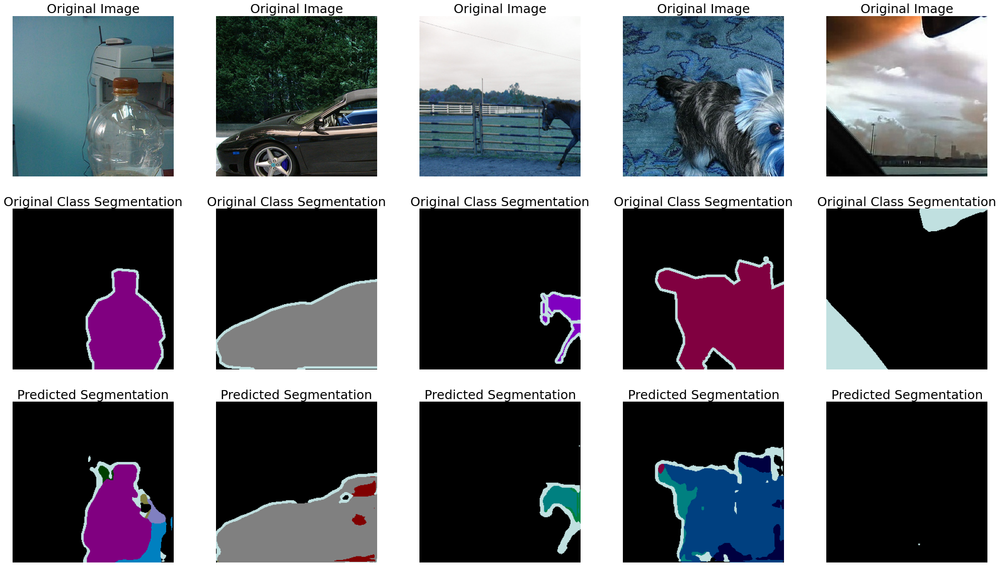

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import segmentation_models as sm

BACKBONE = 'resnet18'
preprocess_input = sm.get_preprocessing(BACKBONE)

x_test = preprocess_input(x_test)

print("Predicting...")
predicted_masks = model.predict(x_test)

palette = [[0, 0, 0], #background
             
              [0, 0, 64],
              [0, 0, 128],
              [0, 0, 192],
              [0, 64, 0],
              [0, 128, 0],
              [0, 192, 0],
              [0, 64, 128],
              [0, 128, 64],
              [0, 128, 128],
              [0, 128, 192],
              [0, 192, 128],
              [128, 0, 0],
              [128, 0, 64],
              [128, 0, 128],
              [128, 0, 192],
              [128, 64, 0],
              [128, 128, 0],
              [128, 128, 64],
              [128, 128, 128],
              [128, 128, 192],
             
              [192, 224, 224], # separating line
              [255, 255, 255]] # unlabelled

print("Formatting 20 masks...")
mask_images = np.zeros((predicted_masks.shape[0], predicted_masks.shape[1], predicted_masks.shape[2], 3), dtype=np.uint8)
for i in range(50):
  for x in range(len(predicted_masks[i])):
    for y in range(len(predicted_masks[i][x])):
      agm = np.argmax(predicted_masks[i][x][y])
      mask_images[i][x][y] = np.array(palette[agm])

print("Plotting...")
plot_results(x_test, y_test, mask_images)

In [0]:
from keras.metrics import categorical_accuracy

categorical_loss = sm.losses.CategoricalCELoss() 
print(model)
model.compile(
    'Adam',
    loss=categorical_loss,
    metrics=[categorical_accuracy, "accuracy"],
  )
# evaluate the model on the test data
loss, cat_accuracy, accuracy = model.evaluate(x_test, y_test_f, verbose=0)
#print(metrics)
print('Test categorical accuracy: %.3f' % (cat_accuracy))
print('Test categorical crossentropy loss: %.3f' % (loss))

Test categorical accuracy: 0.789
Test categorical crossentropy loss: 0.048


### 3.4.2 Using transfer learning

###### Preparing the data

First, we put our training, validation and test images in separate folders

In [0]:
from sklearn.model_selection import train_test_split
import os 

# Get list of img ids
img_ids = [os.path.splitext(filename)[0] for filename in os.listdir(images_path)]
# Get list of ids of images prepared for segmentation
segmentation_ids = [os.path.splitext(filename)[0] for filename in os.listdir(class_segmentation_path)]

# Seed necessary to get the same datasets each time the cell is run
seed = 12374

# Training set = 65%, validation + test = 35%
train_ids, valtest = train_test_split(img_ids, test_size=0.35, random_state=seed)

# Validation = 20%, test = 15%
validation_ids, test_ids = train_test_split(valtest, test_size=0.43, random_state=seed)

# Only some images are prepared for segmentation, so the data subsets are filtered for this task
train_ids_segmentation = list(filter(lambda id: id in segmentation_ids, train_ids))
validation_ids_segmentation = list(filter(lambda id: id in segmentation_ids, validation_ids))
test_ids_segmentation = list(filter(lambda id: id in segmentation_ids, test_ids))

In [0]:
from shutil import copyfile
import os 

# Prepare segmentation dataset
def move_images(imgs_path, segments_path, ids):
  for id in ids:
    image_filename = id + ".jpg"
    full_path_image = images_path + image_filename
    copyfile(full_path_image, imgs_path + image_filename)

    segment_filename = id + ".png"
    full_path_segment = class_segmentation_path + segment_filename
    copyfile(full_path_segment, segments_path + segment_filename)

# Train 
train_images_path = "/content/segmentation_dataset/train/images/"
os.makedirs(train_images_path, exist_ok=True)

train_segments_path = "/content/segmentation_dataset/train/segments/"
os.makedirs(train_segments_path, exist_ok=True)

move_images(train_images_path, train_segments_path, train_ids_segmentation)

# Validation
val_images_path = "/content/segmentation_dataset/val/images/"
os.makedirs(val_images_path, exist_ok=True)

val_segments_path = "/content/segmentation_dataset/val/segments/"
os.makedirs(val_segments_path, exist_ok=True)

move_images(val_images_path, val_segments_path, validation_ids_segmentation)

# Test
test_images_path = "/content/segmentation_dataset/test/images/"
os.makedirs(test_images_path, exist_ok=True)

test_segments_path = "/content/segmentation_dataset/test/segments/"
os.makedirs(test_segments_path, exist_ok=True)

move_images(test_images_path, test_segments_path, test_ids_segmentation)

###### Pre-processing the data

The VOC 2009 segmentation dataset comes in a peculiar format: each pixel has a different colour depending on its class.

There are, in total, 23 classes. 20 of them correspond to the different types of objects present in the dataset. Then there's one for the background, one for the separation lines, and one for unlabelled pixels.

In order for us to be able to use these segmentation images, we need to convert them to a more comprehensive format:

1. First, all images are cropped to the same dimensions, in our case 256x256. We do not resize them, as doing this would distort the RGB pixel values.
2. Then each pixel RGB value is replaced by its class value. E.g. [0, 64, 128] becomes [7]
3. Then, each pixel is one hot encoded. As there are 23 classes, each pixel is replaced by an array of length 23 representing the pixel class. For example, if a pixel corresponds to class 12, the 12th element of the array will have a value of 1 and the rest will be zero. [0, ..., 1, ..., 0]

The final dimensions of our data array are (number of examples, height, width, number of classes), more specifically (982, 256, 256, 23).

In [0]:
from os import listdir
import cv2
import numpy as np
import tensorflow as tf

def load_train_data():

  # Format segment images to comply with the segmentation library specs
  # The pixel values indicate the class(not the pixel indices as in the original dataset)
  # Pixel values of every class
  # 23 classes in total -> 20 object classes + background + unlabeled + separation line
  palette = [[0, 0, 0], #background
             
              [0, 0, 64],
              [0, 0, 128],
              [0, 0, 192],
              [0, 64, 0],
              [0, 128, 0],
              [0, 192, 0],
              [0, 64, 128],
              [0, 128, 64],
              [0, 128, 128],
              [0, 128, 192],
              [0, 192, 128],
              [128, 0, 0],
              [128, 0, 64],
              [128, 0, 128],
              [128, 0, 192],
              [128, 64, 0],
              [128, 128, 0],
              [128, 128, 64],
              [128, 128, 128],
              [128, 128, 192],
             
              [192, 224, 224], # separating line
              [255, 255, 255]] # unlabelled

  dim = 256

  print("Formatting training dataset...")

  n = 1
  total = len(listdir(train_segments_path))
  x_train = []
  y_train = []
  for f in listdir(train_segments_path):
    print(str(n) + "/" + str(total))

    # Image
    img = cv2.imread(train_images_path + f[:-3] + "jpg")
    if(img.shape[0] < dim or img.shape[1] < dim):
      continue
    img = img[0:dim, 0:dim]
    x_train.append(img)

    # Segment
    segment = cv2.imread(train_segments_path + f)
    segment = segment[0:dim, 0:dim]
    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(segment, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)
    y_train.append(one_hot_map.numpy())
    n += 1

  x_train = np.array(x_train)
  y_train = np.array(y_train)

  print("Done!")


  print("Formatting validation dataset...")

  n = 1
  total = len(listdir(val_segments_path))
  x_val = []
  y_val = []
  for f in listdir(val_segments_path):
    print(str(n) + "/" + str(total))

    # Image
    img = cv2.imread(val_images_path + f[:-3] + "jpg")
    if(img.shape[0] < dim or img.shape[1] < dim):
      continue
    img = img[0:dim, 0:dim]
    x_val.append(img)

    # Segment
    segment = cv2.imread(val_segments_path + f)
    segment = segment[0:dim, 0:dim]
    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(segment, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)
    y_val.append(one_hot_map.numpy())
    n += 1

  x_val = np.array(x_val)
  y_val = np.array(y_val)

  print("Done!")

  return x_train, y_train, x_val, y_val


In [0]:
import cv2
import numpy as np
from os import listdir

def load_test_data():
  dim = 256
  x_test = []
  y_test = []
  y_test_f = []
  
  for name in listdir(test_images_path):
    img = cv2.imread(test_images_path + name)
    if(img.shape[0] < dim or img.shape[1] < dim):
      continue
    img = img[0:dim, 0:dim]

    x_test.append(img)

    segment_name = name[:-3] + "png"
    segment = cv2.imread(test_segments_path + segment_name)
    segment = segment[0:dim, 0:dim]
    y_test.append(segment)

    one_hot_map = []
    for colour in palette:
        class_map = tf.reduce_all(tf.equal(segment, colour), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)
    y_test_f.append(one_hot_map.numpy())

  return np.array(x_test), np.array(y_test), np.array(y_test_f)

In [11]:
# load data
x_train, y_train, x_val, y_val = load_train_data()

Formatting training dataset...
1/966
2/966
3/966
4/966
5/966
6/966
7/966
8/966
9/966
10/966
11/966
12/966
13/966
14/966
15/966
16/966
17/966
18/966
19/966
20/966
21/966
22/966
23/966
23/966
24/966
24/966
25/966
26/966
27/966
28/966
29/966
30/966
31/966
32/966
33/966
34/966
35/966
36/966
37/966
38/966
39/966
40/966
41/966
42/966
43/966
44/966
45/966
46/966
47/966
48/966
49/966
50/966
51/966
51/966
52/966
53/966
54/966
55/966
56/966
57/966
58/966
59/966
60/966
61/966
62/966
63/966
64/966
65/966
66/966
67/966
68/966
69/966
70/966
71/966
72/966
73/966
74/966
75/966
76/966
77/966
78/966
79/966
80/966
81/966
82/966
83/966
84/966
85/966
86/966
87/966
88/966
89/966
90/966
91/966
92/966
93/966
94/966
95/966
96/966
97/966
98/966
99/966
100/966
100/966
101/966
102/966
103/966
104/966
105/966
106/966
107/966
108/966
109/966
110/966
111/966
112/966
113/966
114/966
115/966
116/966
117/966
118/966
119/966
120/966
121/966
122/966
123/966
124/966
125/966
126/966
127/966
128/966
129/966
130/966
131/966


###### Building and training the model

We install the package who contains the pretrained model:

In [12]:
 !pip install segmentation-models
 !pip show segmentation-models

Name: segmentation-models
Version: 1.0.1
Summary: Image segmentation models with pre-trained backbones with Keras.
Home-page: https://github.com/qubvel/segmentation_models
Author: Pavel Yakubovskiy
Author-email: qubvel@gmail.com
License: MIT
Location: /usr/local/lib/python3.6/dist-packages
Requires: image-classifiers, efficientnet, keras-applications
Required-by: 


Our final segmentation model has the following architecture:
- Pretrained weights on the imagenet dataset
- Resnet18 as backbone
- Unet as model skeleton
- Adam as optimizer
- Softmax activation
- Categorical cross-entropy as loss function
- Categorical accuracy as metric

Several other options were tested, but they gave worse results. A non-exhaustive list of the things we tried includes: sigmoid activation, SGD optimizer, Dice loss function, normalized input data.

In [59]:
import segmentation_models as sm
from segmentation_models.metrics import iou_score, f1_score
sm.set_framework('tf.keras')

from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import optimizers

import pickle 

# define backbone of the model
BACKBONE = "resnet18"
preprocess_input = sm.get_preprocessing(BACKBONE)

# preprocess input
x_train_f = preprocess_input(x_train)
x_val_f = preprocess_input(x_val)

# define loss function
categorical_loss = sm.losses.CategoricalCELoss() 

# define and compile the model
model = sm.Unet(BACKBONE, 
                classes=23, 
                activation="softmax", 
                encoder_weights="imagenet", 
                encoder_freeze=True)
model.compile(
    "Adam",
    loss=categorical_loss,
    metrics=[categorical_accuracy, iou_score])

# visualize model architecture
model.summary()

# model checkpoint
filepath="/content/Segmentation-TL-weights-{epoch:02d}.h5"
checkpoint = ModelCheckpoint(filepath=filepath, 
                             save_weights_only=True, 
                             save_best_only=True, 
                             monitor="val_categorical_accuracy",
                             verbose=1)
callbacks_list = [checkpoint]

# pretrain model decoder
history = model.fit(
   x=x_train_f,
   y=y_train,
   batch_size=32,
   epochs=100,
   callbacks=callbacks_list,
   validation_data=(x_val_f, y_val))

# serialize model to JSON
model_json = model.to_json()
with open("/content/Segmentation-TL-model.json", "w") as json_file:
    json_file.write(model_json)
# serialize training history for later visualization
with open("/content/Segmentation-TL-history", "wb") as file_pi:
    pickle.dump(history.history, file_pi)

Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               [(None, None, None,  0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, None, None, 3 9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_306 (ZeroPadding (None, None, None, 3 0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, None, None, 6 9408        zero_padding2d_306[0][0]         
___________________________________________________________________________________________

Visualize learning curve

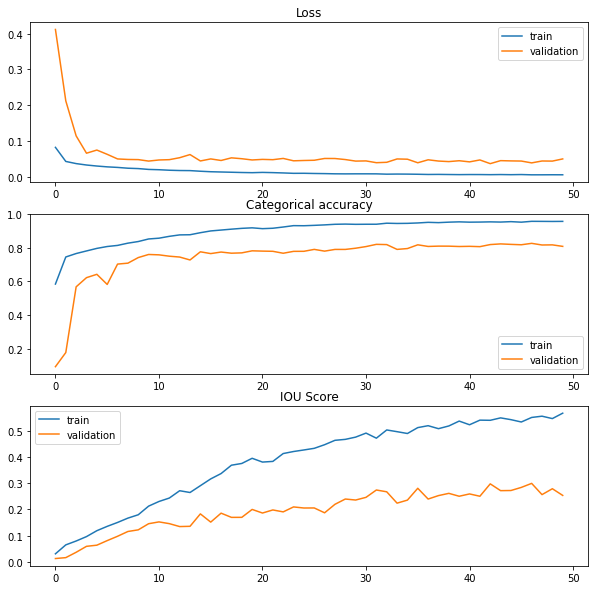

In [39]:
import matplotlib.pyplot as plt
import pickle

with open("/content/Segmentation-TL-history", "rb") as pickle_file:
    history = pickle.load(pickle_file)

    plt.figure(figsize=(10,10))
    # plot loss 
    plt.subplot(311)
    plt.title('Loss')
    plt.plot(history['loss'], label='train')
    plt.plot(history['val_loss'], label='validation')
    plt.legend()
    # plot categorical accuracy
    plt.subplot(312)
    plt.title('Categorical accuracy')
    plt.plot(history['categorical_accuracy'], label='train')
    plt.plot(history['val_categorical_accuracy'], label='validation')
    plt.legend()
    # plot iou
    plt.subplot(313)
    plt.title('IOU Score')
    plt.plot(history['iou_score'], label='train')
    plt.plot(history['val_iou_score'], label='validation')
    plt.legend()
    plt.show()

###### Testing the model and visualizing the results

In [40]:
from tensorflow.keras.models import model_from_json

# Load trained model
print("Loading model...")
json_file = open('/content/Segmentation-TL-model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/content/Segmentation-TL-weights-47.h5")
print("Model loaded!")

Loading model...
Model loaded!


In [44]:
# load test data
print("Loading test data...")
x_test, y_test, y_test_f = load_test_data()

Loading test data...


Predicting...
Formatting 20 masks...
Plotting...


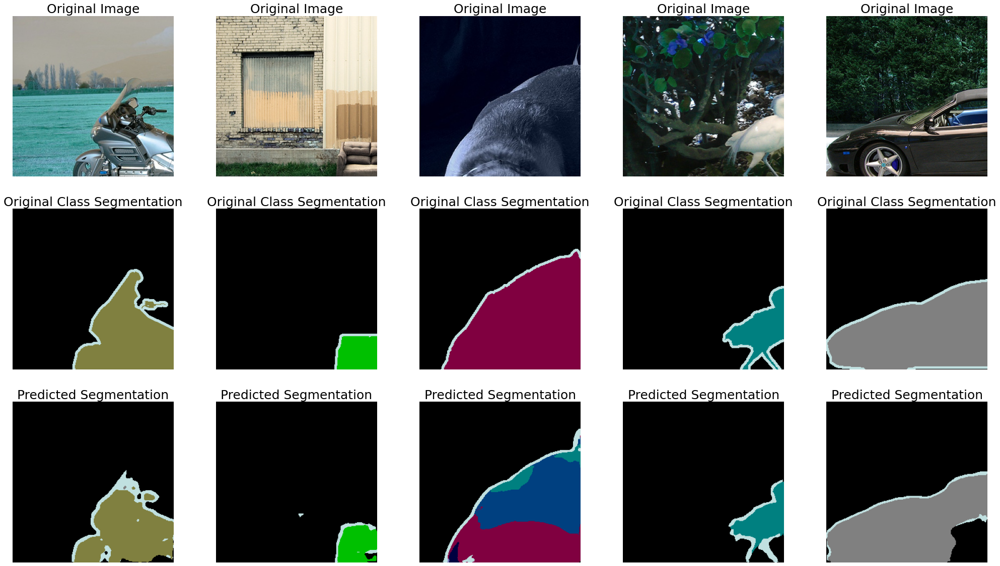

In [55]:
import matplotlib.pyplot as plt
import numpy as np
import segmentation_models as sm
sm.set_framework('tf.keras')


def plot_results(x_test, y_test, masks):
  fig = plt.figure(figsize=(35,20))
  ax = fig.subplots(3, 5)

  indices = [1, 2, 7, 8, 14]

  i = 0
  for index in indices:
      image = x_test[index]
      real_mask = y_test[index]
      predicted_mask = masks[index]
      
      ax[0,i].imshow(image)
      ax[0,i].axis('off')
      ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
      ax[1,i].imshow(real_mask)
      ax[1,i].axis('off')
      ax[1,i].set_title('Original Class Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
      ax[2,i].imshow(predicted_mask)
      ax[2,i].axis('off')
      ax[2,i].set_title('Predicted Segmentation', fontdict={'fontsize': 25, 'fontweight': 'medium'})
      i += 1
        
  plt.show()

BACKBONE = 'resnet18'
preprocess_input = sm.get_preprocessing(BACKBONE)

x_test = preprocess_input(x_test)

print("Predicting...")
predicted_masks = model.predict(x_test)

palette = [[0, 0, 0], #background
             
              [0, 0, 64],
              [0, 0, 128],
              [0, 0, 192],
              [0, 64, 0],
              [0, 128, 0],
              [0, 192, 0],
              [0, 64, 128],
              [0, 128, 64],
              [0, 128, 128],
              [0, 128, 192],
              [0, 192, 128],
              [128, 0, 0],
              [128, 0, 64],
              [128, 0, 128],
              [128, 0, 192],
              [128, 64, 0],
              [128, 128, 0],
              [128, 128, 64],
              [128, 128, 128],
              [128, 128, 192],
             
              [192, 224, 224], # separating line
              [255, 255, 255]] # unlabelled


print("Formatting 20 masks...")
mask_images = np.zeros((predicted_masks.shape[0], predicted_masks.shape[1], predicted_masks.shape[2], 3), dtype=np.uint8)
for i in range(50):
  for x in range(len(predicted_masks[i])):
    for y in range(len(predicted_masks[i][x])):
      agm = np.argmax(predicted_masks[i][x][y])
      mask_images[i][x][y] = np.array(palette[agm])

print("Plotting...")
plot_results(x_test, y_test, mask_images)

In [58]:
from tensorflow.keras.metrics import categorical_accuracy

categorical_loss = sm.losses.CategoricalCELoss() 
model.compile(
    'Adam',
    loss=categorical_loss,
    metrics=[categorical_accuracy],
  )
# evaluate the model on the test data
loss, cat_accuracy = model.evaluate(x_test, y_test_f, verbose=0)
print('Test categorical accuracy: %.3f' % (cat_accuracy))
print('Test categorical crossentropy loss: %.3f' % (loss))

Test categorical accuracy: 0.860
Test categorical crossentropy loss: 0.030


# *4. Adversarial learning*


### 4.1 Generating noise with an autoencoder

First we select the images that we want to use to fool the classifier. In this case class 2, which corresponds to cats.

In [0]:
import numpy as np

# Selected id of class of interest
# e.g person = 0
#     cat = 2
selected_class_id = 2

print("All labels: " + str(len(labels)))
selected_idx = np.where(labels[:, selected_class_id] == 1)
labels_selected = labels[selected_idx]
print("Selected labels: " + str(len(labels_selected)))

print("All images: " + str(len(images)))
images = np.asarray(images) 
images_selected = images[selected_idx]
print("Selected images: " + str(len(images_selected)))

All labels: 7818
Selected labels: 587
All images: 7818
Selected images: 587


We split the data into training and test.

In [0]:
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

# Split dataset
x_train, valtest_im, y_train, valtest_lab = train_test_split(images_selected, labels_selected, test_size=0.35, random_state=seed)
x_val, x_test, y_val, y_test = train_test_split(valtest_im, valtest_lab, test_size=0.43, random_state=seed)

print('size of the training data:   ' + str(x_train.shape))
print('size of the validation data: ' + str(x_val.shape))

size of the training data:   (381, 360, 360, 3)
size of the validation data: (117, 360, 360, 3)


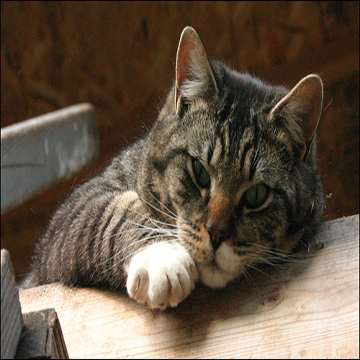

In [0]:
cv2_imshow(x_train[0])

In [0]:
# Generate random noisy images
noise_factor = 0.2
x_train_noise = (x_train * 0) + noise_factor * np.random.normal(loc=0.0, scale=255.0, size=x_train.shape) 
x_test_noise = (x_test * 0) + noise_factor * np.random.normal(loc=0.0, scale=255.0, size=x_test.shape) 

x_train_noise = np.clip(x_train_noise, 0., 255.)
x_test_noise = np.clip(x_test_noise, 0., 255.)

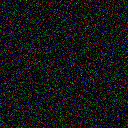

In [0]:
cv2_imshow(x_train_noise[0])

In [0]:
# Convolutional autoencoder for denoising with L2 regularization
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
from tensorflow.keras.constraints import max_norm
from tensorflow.keras import regularizers

input_img = Input(shape=(256, 256, 3))

x = Conv2D(16, (3, 3), activation='relu', padding='same',
           activity_regularizer=regularizers.l2(10e-5))(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

autoencoder.summary()

Model: "model_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d_38 (MaxPooling (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 128, 128, 8)       1160      
_________________________________________________________________
max_pooling2d_39 (MaxPooling (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_90 (Conv2D)           (None, 64, 64, 8)         584       
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 32, 32, 8)         0  

In [0]:
# Fit the model
history = autoencoder.fit(x_train / 255., 
                          x_train_noise / 255., 
                          epochs=100, 
                          shuffle=True,
                          batch_size=32)

Epoch 1/100
381/381 [==============================] - 4s 10ms/step - loss: 54.7965
Epoch 2/100
381/381 [==============================] - 3s 9ms/step - loss: 10.9421
Epoch 3/100
381/381 [==============================] - 3s 9ms/step - loss: 1.9378
Epoch 4/100
381/381 [==============================] - 3s 9ms/step - loss: 0.8412
Epoch 5/100
381/381 [==============================] - 3s 9ms/step - loss: 0.6909
Epoch 6/100
381/381 [==============================] - 3s 9ms/step - loss: 0.6331
Epoch 7/100
381/381 [==============================] - 3s 9ms/step - loss: 0.5999
Epoch 8/100
381/381 [==============================] - 3s 9ms/step - loss: 0.5746
Epoch 9/100
381/381 [==============================] - 3s 9ms/step - loss: 0.5519
Epoch 10/100
381/381 [==============================] - 3s 9ms/step - loss: 0.5347
Epoch 11/100
381/381 [==============================] - 3s 9ms/step - loss: 0.5174
Epoch 12/100
381/381 [==============================] - 3s 9ms/step - loss: 0.5015
Epoch 13/1

In [0]:
noise = autoencoder.predict(x_test_noise / 255.) * 255.

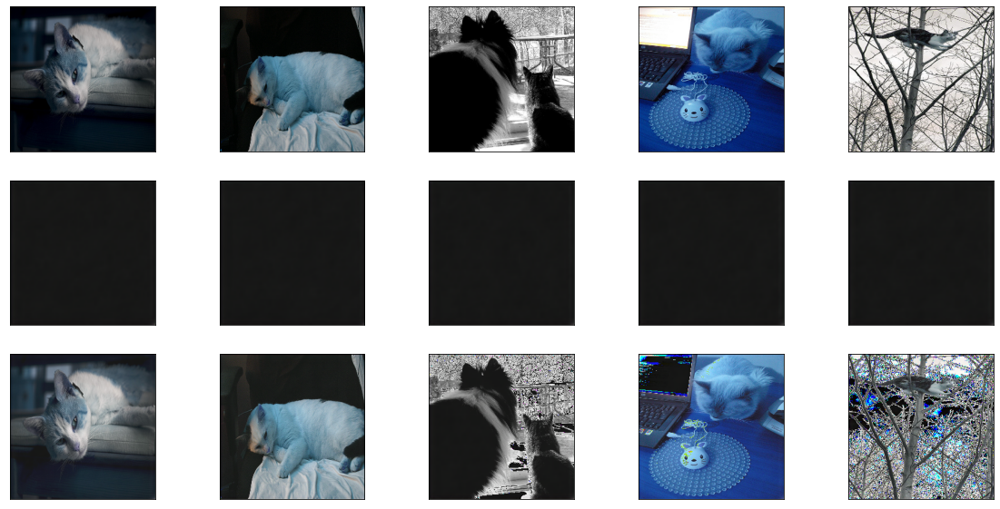

In [0]:
import matplotlib.pyplot as plt

n = 5
fig, axs = plt.subplots(3, n, figsize=(20, 10))
for i in range(n):
    # display original image
    axs[0, i].imshow(x_test[i].astype(np.uint8))
    plt.gray()
    axs[0, i].get_xaxis().set_visible(False)
    axs[0, i].get_yaxis().set_visible(False)

    # display noise
    axs[1, i].imshow(noise[i].astype(np.uint8))
    plt.gray()
    axs[1, i].get_xaxis().set_visible(False)
    axs[1, i].get_yaxis().set_visible(False)

    # display original image + generated noise
    axs[2, i].imshow(x_test[i].astype(np.uint8) + noise[i].astype(np.uint8))
    plt.gray()
    axs[2, i].get_xaxis().set_visible(False)
    axs[2, i].get_yaxis().set_visible(False)
plt.show()


### 4.2 Loading the previously trained classifier

In [0]:
from tensorflow.keras.models import model_from_json
import numpy as np

# load json and create model
json_file = open("/content/transfer_learning_classifier_model.json", "r")
classifier_json = json_file.read()
json_file.close()
classifier = model_from_json(classifier_json)
# load weights into new model
classifier.load_weights("/content/transfer_learning_classifier_model.h5")
print("Loaded model from disk")

# ['bird', 'cat', 'cow', 'dog', 'horse', 'sheep', 'aeroplane','bicycle']
y_pred = np.argmax(classifier.predict(x_test), axis=1)
print(classifier.predict(x_test)[0])
print(y_pred)

# class cat = 1
y_test = np.ones(len(x_test), dtype=np.uint8)

print(y_test)
print("Accuracy of the model for classifying cats/chair: {}%".format(100 * np.sum(y_pred == y_test) / len(y_pred)))

Loaded model from disk
[2.2522457e-30 1.0000000e+00 0.0000000e+00 0.0000000e+00 1.2809781e-29
 0.0000000e+00 0.0000000e+00 0.0000000e+00]
[1 1 0 1 4 3 1 1 1 1 1 3 7 1 1 1 1 0 3 1 1 1 1 1 1 0 3 4 1 1 1 1 1 1 3 0 3
 3 3 1 3 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 3 1 1 1 1 1 1 3 1 1
 1 3 1 3 1 1 1 1 3 1 1 3 1 1 3 1 1 1 3 0 1 1 1 7 1 3 3 1 1 4 1 5 3 1 1 3 1
 1 3 1 0 3 7 3 1 1 3 0 1 1 3 1 1 1 1 1 1 3 3 0 1 7 1 1 3 1 1 1 1 1 3 0 3 1
 1 3 1 3 1 3 7 0 3 3 0 1 1 3 1 3 1 1 3 1 3 0 1 0 1 3 4 3 1 1 3 3 3 1 3 3 1
 1 1 1 1 1 1 1 0 4 1 1 1 1 5 1 7 1 3 1 3 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Accuracy of the model fo

In [0]:
weights = np.array(cat_classifier.get_weights())
print(weights[0].shape)
print(weights[1].shape)
print(weights[2].shape)
print(weights[3].shape)
print(weights[4].shape)
print(weights[5].shape)

(3, 3, 3, 64)
(64,)
(64,)
(64,)
(64,)
(64,)


In [0]:
true_labels = np.zeros((32, 8))
true_labels[:, 3] = 1
print(true_labels)


[[0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]]


### 4.3 WIP: Fooling the classifier with adversarial learning

In [0]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Sequential, Model, model_from_json
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

from google.colab.patches import cv2_imshow

import matplotlib.pyplot as plt
import numpy as np

class GAN():
    def __init__(self):
      self.img_rows = 360
      self.img_cols = 360
      self.channels = 3
      self.img_shape = (self.img_rows, self.img_cols, self.channels)

      optimizer = Adam(0.0002, 0.5)  

      self.discriminator = self.build_discriminator()
      self.discriminator.trainable = False
      self.discriminator.compile(
          loss='categorical_crossentropy',
          optimizer=optimizer,
          metrics=[categorical_accuracy])
                
      self.generator = self.build_generator()

      input_img = Input(shape=self.img_shape)
      img = self.generator(input_img)
      #img = input_img + noise
      validity = self.discriminator(img)
        
      self.combined = Model(input_img, validity)
      self.combined.compile(loss='categorical_crossentropy', optimizer=optimizer)

    def build_generator(self):
      # Convolutional autoencoder with L2 activity regularization
      # Inputs -> image
      # Output -> noise
      input_img = Input(shape=self.img_shape)

      x = Conv2D(16, (3, 3), activation='relu', padding='same',
                activity_regularizer=regularizers.l2(10e-6))(input_img)
      x = MaxPooling2D((2, 2), padding='same')(x)
      x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
      x = MaxPooling2D((2, 2), padding='same')(x)
      x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
      encoded = MaxPooling2D((2, 2), padding='same')(x)

      x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
      x = UpSampling2D((2, 2))(x)
      x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
      x = UpSampling2D((2, 2))(x)
      x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
      x = UpSampling2D((2, 2))(x)
      decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

      return Model(input_img, decoded)

    def build_discriminator(self):
      # Input-> image
      # Output-> class
      json_file = open("/content/transfer_learning_classifier_model.json", "r")
      classifier_json = json_file.read()
      json_file.close()
      classifier = model_from_json(classifier_json)
      classifier.load_weights("/content/transfer_learning_classifier_model.h5")

      img = Input(shape=self.img_shape)
      validity = classifier(img)

      return Model(img, validity)

    def train(self, 
              x_train, 
              true_class=0, 
              fake_class=1, 
              epochs=1000, 
              batch_size=128, 
              sample_interval=50):
      
      true_labels = np.zeros((batch_size, 8))
      true_labels[:, true_class] = 1

      fake_labels = np.zeros((batch_size, 8))
      fake_labels[:, fake_class] = 1

      print("true labels", true_labels[0])
      print("fake labels", fake_labels[0])

      for epoch in range(epochs):  
        # Random batch selection
        idx = np.random.randint(0, x_train.shape[0], batch_size)
        imgs = x_train[idx]        
        # Generate noise
        gen_noise = self.generator.predict(imgs)
        # Add noise to original images
        gen_imgs = imgs + gen_noise    

        #d_loss_real = self.discriminator.train_on_batch(imgs, fake_labels) # true_labels
        #d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake_labels) # fake labels
        #d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # Train model with the fake labels to improve the fooling abilities of the generated noise
        # The discriminator is set to "not trainable", so we are effectively just training the generator
        g_loss = self.combined.train_on_batch(gen_imgs, fake_labels)

        # Print images given a specific interval
        print ("%d [G loss: %f]" % (epoch, g_loss))
        if epoch % sample_interval == 0:
          self.sample_image(imgs[0], gen_noise[0], gen_imgs[0])
        if epoch == epochs - 1:
          self.sample_image(imgs[0], gen_noise[0], gen_imgs[0])
          self.test_classifier_accuracy(imgs, gen_imgs, true_class)

    def test_classifier_accuracy(self, imgs, gen_imgs, true_class):
      real_labels = np.full(len(imgs), true_class)
      print(self.discriminator.predict_on_batch(imgs))
      print(self.discriminator.predict_on_batch(gen_imgs))
      print(imgs[0][0][0])
      print(gen_imgs[0][0][0])
      orig_pred_labels = np.argmax(self.discriminator.predict_on_batch(imgs), axis=1)
      fool_pred_labels = np.argmax(self.discriminator.predict_on_batch(gen_imgs), axis=1)
      print("Original predictions ", str(orig_pred_labels))
      print("Tampered predictions ", str(fool_pred_labels))
      print("Accuracy of the model on real data : {}%".format(100 * np.sum(orig_pred_labels == real_labels) / len(real_labels)))
      print("Accuracy of the model on tampered data : {}%".format(100 * np.sum(fool_pred_labels == real_labels) / len(real_labels)))
      
    def sample_image(self, img, gen_noise, gen_img):   
      fig, axs = plt.subplots(1, 3, figsize=(8, 8))
      # display original image
      axs[0].imshow(img.astype(np.uint8))
      plt.gray()
      axs[0].get_xaxis().set_visible(False)
      axs[0].get_yaxis().set_visible(False)

      # display noise
      axs[1].imshow(gen_noise.astype(np.uint8))
      plt.gray()
      axs[1].get_xaxis().set_visible(False)
      axs[1].get_yaxis().set_visible(False)

      # display original image + generated noise
      axs[2].imshow(gen_img.astype(np.uint8))
      plt.gray()
      axs[2].get_xaxis().set_visible(False)
      axs[2].get_yaxis().set_visible(False)

      plt.show()

true labels [0. 1. 0. 0. 0. 0. 0. 0.]
fake labels [0. 0. 0. 0. 0. 1. 0. 0.]
0 [G loss: 35450.496094]


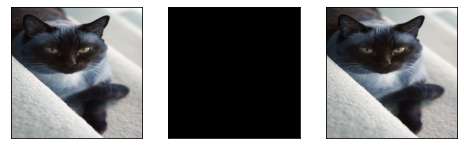

1 [G loss: 34654.382812]
2 [G loss: 34397.222656]
3 [G loss: 34637.687500]
4 [G loss: 39363.402344]
5 [G loss: 34532.531250]
6 [G loss: 35579.042969]
7 [G loss: 32257.740234]
8 [G loss: 33544.394531]
9 [G loss: 27978.873047]
10 [G loss: 30499.759766]
11 [G loss: 30248.609375]
12 [G loss: 29458.382812]
13 [G loss: 21016.925781]
14 [G loss: 28943.832031]
15 [G loss: 29472.267578]
16 [G loss: 26788.939453]
17 [G loss: 27217.878906]
18 [G loss: 25081.529297]
19 [G loss: 24341.367188]
20 [G loss: 29778.785156]
21 [G loss: 23818.001953]
22 [G loss: 24360.843750]
23 [G loss: 25249.486328]
24 [G loss: 25200.892578]
25 [G loss: 22924.484375]
26 [G loss: 24295.853516]
27 [G loss: 24114.421875]
28 [G loss: 22945.632812]
29 [G loss: 23793.402344]
30 [G loss: 21916.378906]
31 [G loss: 25415.035156]
32 [G loss: 20154.138672]
33 [G loss: 19386.906250]
34 [G loss: 17395.814453]
35 [G loss: 20524.976562]
36 [G loss: 20193.142578]
37 [G loss: 16688.539062]
38 [G loss: 19211.058594]
39 [G loss: 17731.162

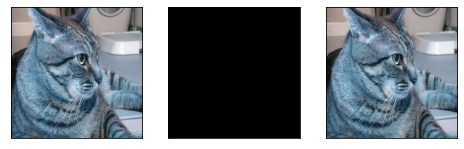

101 [G loss: 5899.062500]
102 [G loss: 6099.609375]
103 [G loss: 5978.978516]
104 [G loss: 4907.313477]
105 [G loss: 6078.956543]
106 [G loss: 5388.386230]
107 [G loss: 5661.105957]
108 [G loss: 5248.564941]
109 [G loss: 4896.205078]
110 [G loss: 4784.587402]
111 [G loss: 4935.737305]
112 [G loss: 4708.043457]
113 [G loss: 5035.638672]
114 [G loss: 4722.575195]
115 [G loss: 5124.884277]
116 [G loss: 4151.080566]
117 [G loss: 4483.259766]
118 [G loss: 3843.434814]
119 [G loss: 4226.023438]
120 [G loss: 4274.208984]
121 [G loss: 3751.601318]
122 [G loss: 4569.620605]
123 [G loss: 4828.842773]
124 [G loss: 3994.010742]
125 [G loss: 3904.905518]
126 [G loss: 3561.278564]
127 [G loss: 3516.937744]
128 [G loss: 3236.817627]
129 [G loss: 3986.205322]
130 [G loss: 3731.019043]
131 [G loss: 3856.176025]
132 [G loss: 3449.627686]
133 [G loss: 3628.336670]
134 [G loss: 3210.811035]
135 [G loss: 3024.811279]
136 [G loss: 2955.807861]
137 [G loss: 3127.425049]
138 [G loss: 3292.217041]
139 [G loss:

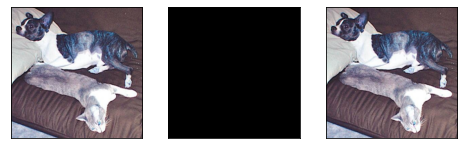

201 [G loss: 1023.381714]
202 [G loss: 1017.945129]
203 [G loss: 988.539795]
204 [G loss: 1048.476929]
205 [G loss: 1007.394043]
206 [G loss: 887.358704]
207 [G loss: 888.620239]
208 [G loss: 1001.358887]
209 [G loss: 900.944946]
210 [G loss: 1012.905884]
211 [G loss: 975.477905]
212 [G loss: 897.765259]
213 [G loss: 923.799133]
214 [G loss: 889.544800]
215 [G loss: 738.855774]
216 [G loss: 781.247498]
217 [G loss: 814.808289]
218 [G loss: 874.691040]
219 [G loss: 873.992126]
220 [G loss: 797.245300]
221 [G loss: 765.830200]
222 [G loss: 735.195557]
223 [G loss: 711.000793]
224 [G loss: 683.425537]
225 [G loss: 748.546570]
226 [G loss: 714.487549]
227 [G loss: 577.868225]
228 [G loss: 711.674988]
229 [G loss: 610.593140]
230 [G loss: 686.827759]
231 [G loss: 548.145569]
232 [G loss: 610.408875]
233 [G loss: 576.289185]
234 [G loss: 639.493408]
235 [G loss: 574.498169]
236 [G loss: 558.967957]
237 [G loss: 752.303833]
238 [G loss: 504.592560]
239 [G loss: 491.889771]
240 [G loss: 583.90

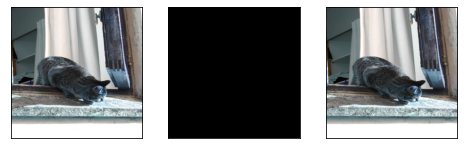

301 [G loss: 330.955475]
302 [G loss: 263.544037]
303 [G loss: 257.388580]
304 [G loss: 301.261810]
305 [G loss: 258.865479]
306 [G loss: 341.357483]
307 [G loss: 255.861450]
308 [G loss: 298.795288]
309 [G loss: 252.893585]
310 [G loss: 236.975189]
311 [G loss: 234.372101]
312 [G loss: 244.436829]
313 [G loss: 310.348419]
314 [G loss: 247.380936]
315 [G loss: 250.155197]
316 [G loss: 219.707733]
317 [G loss: 312.118988]
318 [G loss: 286.642944]
319 [G loss: 290.123810]
320 [G loss: 269.886963]
321 [G loss: 241.021530]
322 [G loss: 272.223480]
323 [G loss: 228.676270]
324 [G loss: 226.083405]
325 [G loss: 230.218842]
326 [G loss: 242.372726]
327 [G loss: 287.242401]
328 [G loss: 177.386459]
329 [G loss: 256.417511]
330 [G loss: 277.099884]
331 [G loss: 200.553101]
332 [G loss: 221.705017]
333 [G loss: 287.178955]
334 [G loss: 218.059357]
335 [G loss: 234.666931]
336 [G loss: 214.056915]
337 [G loss: 181.629913]
338 [G loss: 240.901184]
339 [G loss: 222.879974]
340 [G loss: 240.146561]


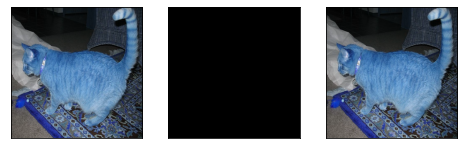

401 [G loss: 169.067108]
402 [G loss: 177.483292]
403 [G loss: 158.193161]
404 [G loss: 141.557724]
405 [G loss: 209.868744]
406 [G loss: 157.996841]
407 [G loss: 192.094925]
408 [G loss: 198.125992]
409 [G loss: 156.517456]
410 [G loss: 275.670288]
411 [G loss: 189.542496]
412 [G loss: 194.244263]
413 [G loss: 171.902374]
414 [G loss: 203.884201]
415 [G loss: 169.712814]
416 [G loss: 87.134438]
417 [G loss: 165.202896]
418 [G loss: 184.112427]
419 [G loss: 195.045090]
420 [G loss: 141.430466]
421 [G loss: 135.967972]
422 [G loss: 122.828316]
423 [G loss: 129.637314]
424 [G loss: 171.992477]
425 [G loss: 134.719162]
426 [G loss: 158.038071]
427 [G loss: 180.759048]
428 [G loss: 120.993782]
429 [G loss: 120.513275]
430 [G loss: 138.972443]
431 [G loss: 167.993118]
432 [G loss: 183.177094]
433 [G loss: 196.193100]
434 [G loss: 162.461151]
435 [G loss: 126.593803]
436 [G loss: 174.945480]
437 [G loss: 157.342880]
438 [G loss: 132.184616]
439 [G loss: 101.738617]
440 [G loss: 156.495407]
4

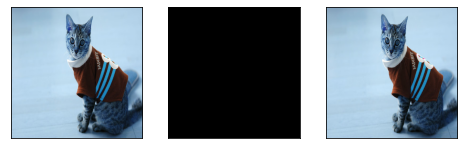

501 [G loss: 129.028519]
502 [G loss: 94.915375]
503 [G loss: 97.455002]
504 [G loss: 100.167389]
505 [G loss: 137.977417]
506 [G loss: 94.967957]
507 [G loss: 100.718025]
508 [G loss: 141.300491]
509 [G loss: 123.993027]
510 [G loss: 141.338058]
511 [G loss: 130.872635]
512 [G loss: 157.649536]
513 [G loss: 99.401237]
514 [G loss: 122.868477]
515 [G loss: 81.581070]
516 [G loss: 164.263138]
517 [G loss: 127.804573]
518 [G loss: 130.049683]
519 [G loss: 134.894501]
520 [G loss: 112.086296]
521 [G loss: 150.291931]
522 [G loss: 160.403168]
523 [G loss: 123.443748]
524 [G loss: 149.997543]
525 [G loss: 128.547440]
526 [G loss: 114.497192]
527 [G loss: 122.116409]
528 [G loss: 107.027466]
529 [G loss: 147.264160]
530 [G loss: 111.483444]
531 [G loss: 132.331909]
532 [G loss: 90.162163]
533 [G loss: 120.271561]
534 [G loss: 111.419914]
535 [G loss: 95.276337]
536 [G loss: 136.068680]
537 [G loss: 137.068451]
538 [G loss: 97.053612]
539 [G loss: 89.623184]
540 [G loss: 99.783707]
541 [G los

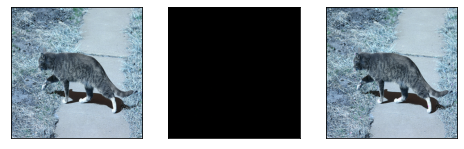

601 [G loss: 120.693138]
602 [G loss: 112.310165]
603 [G loss: 103.848930]
604 [G loss: 94.673836]
605 [G loss: 71.509293]
606 [G loss: 113.807701]
607 [G loss: 69.742310]
608 [G loss: 125.674583]
609 [G loss: 97.268524]
610 [G loss: 79.587440]
611 [G loss: 114.507675]
612 [G loss: 109.008316]
613 [G loss: 77.112167]
614 [G loss: 96.977066]
615 [G loss: 115.568710]
616 [G loss: 78.594902]
617 [G loss: 119.563637]
618 [G loss: 83.792938]
619 [G loss: 86.961388]
620 [G loss: 102.567482]
621 [G loss: 80.606842]
622 [G loss: 138.373322]
623 [G loss: 96.526123]
624 [G loss: 83.793953]
625 [G loss: 122.160919]
626 [G loss: 91.353470]
627 [G loss: 151.466873]
628 [G loss: 117.890480]
629 [G loss: 125.608582]
630 [G loss: 99.604050]
631 [G loss: 88.900764]
632 [G loss: 98.970192]
633 [G loss: 101.268791]
634 [G loss: 118.311043]
635 [G loss: 106.929970]
636 [G loss: 134.791458]
637 [G loss: 101.314613]
638 [G loss: 90.209465]
639 [G loss: 95.441223]
640 [G loss: 127.469856]
641 [G loss: 78.021

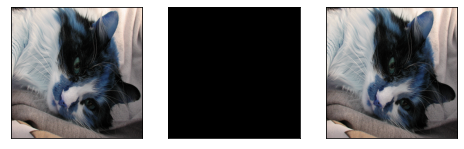

701 [G loss: 56.792988]
702 [G loss: 103.463661]
703 [G loss: 85.736710]
704 [G loss: 85.058090]
705 [G loss: 86.525803]
706 [G loss: 86.012680]
707 [G loss: 78.574020]
708 [G loss: 90.672493]
709 [G loss: 90.467628]
710 [G loss: 94.827705]
711 [G loss: 78.944786]
712 [G loss: 132.318741]
713 [G loss: 83.656570]
714 [G loss: 81.871666]
715 [G loss: 81.610672]
716 [G loss: 88.169739]
717 [G loss: 60.075920]
718 [G loss: 86.672028]
719 [G loss: 118.570335]
720 [G loss: 117.110802]
721 [G loss: 93.990349]
722 [G loss: 77.444809]
723 [G loss: 114.590004]
724 [G loss: 98.438652]
725 [G loss: 80.409096]
726 [G loss: 58.663574]
727 [G loss: 67.778854]
728 [G loss: 59.383541]
729 [G loss: 76.336311]
730 [G loss: 89.115417]
731 [G loss: 93.949036]
732 [G loss: 73.618912]
733 [G loss: 61.478561]
734 [G loss: 67.717812]
735 [G loss: 67.920486]
736 [G loss: 81.213737]
737 [G loss: 89.903519]
738 [G loss: 83.660439]
739 [G loss: 84.946800]
740 [G loss: 81.934692]
741 [G loss: 133.135864]
742 [G los

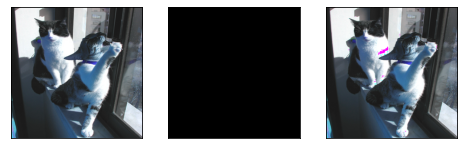

801 [G loss: 73.690041]
802 [G loss: 61.538822]
803 [G loss: 50.297943]
804 [G loss: 94.577560]
805 [G loss: 81.686844]
806 [G loss: 79.193359]
807 [G loss: 87.227676]
808 [G loss: 67.367165]
809 [G loss: 80.065376]
810 [G loss: 80.796310]
811 [G loss: 69.233948]
812 [G loss: 77.803772]
813 [G loss: 56.384499]
814 [G loss: 72.273430]
815 [G loss: 85.762604]
816 [G loss: 66.191452]
817 [G loss: 73.389557]
818 [G loss: 88.720795]
819 [G loss: 80.500175]
820 [G loss: 76.998482]
821 [G loss: 77.519661]
822 [G loss: 78.500160]
823 [G loss: 84.726349]
824 [G loss: 86.311249]
825 [G loss: 65.726845]
826 [G loss: 51.004940]
827 [G loss: 78.599403]
828 [G loss: 88.854156]
829 [G loss: 86.452446]
830 [G loss: 52.459648]
831 [G loss: 72.171463]
832 [G loss: 69.209366]
833 [G loss: 51.590683]
834 [G loss: 66.653458]
835 [G loss: 69.586555]
836 [G loss: 66.456764]
837 [G loss: 66.845932]
838 [G loss: 60.547001]
839 [G loss: 64.557884]
840 [G loss: 60.875637]
841 [G loss: 64.251350]
842 [G loss: 104

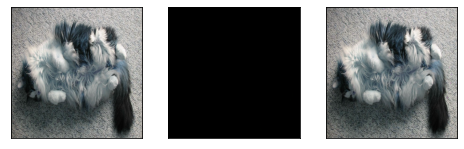

901 [G loss: 47.852261]
902 [G loss: 60.349369]
903 [G loss: 47.225742]
904 [G loss: 79.927399]
905 [G loss: 50.177872]
906 [G loss: 75.122231]
907 [G loss: 83.441376]
908 [G loss: 63.664276]
909 [G loss: 64.107689]
910 [G loss: 54.272331]
911 [G loss: 100.359871]
912 [G loss: 77.087051]
913 [G loss: 63.091114]
914 [G loss: 53.646156]
915 [G loss: 61.205605]
916 [G loss: 46.516014]
917 [G loss: 84.729790]
918 [G loss: 64.483780]
919 [G loss: 60.095146]
920 [G loss: 69.380547]
921 [G loss: 53.254940]
922 [G loss: 73.443939]
923 [G loss: 42.087284]
924 [G loss: 56.980255]
925 [G loss: 71.915138]
926 [G loss: 62.688416]
927 [G loss: 53.496456]
928 [G loss: 53.389767]
929 [G loss: 61.496410]
930 [G loss: 71.357903]
931 [G loss: 87.873230]
932 [G loss: 61.726131]
933 [G loss: 53.729359]
934 [G loss: 66.605591]
935 [G loss: 52.623199]
936 [G loss: 67.193115]
937 [G loss: 64.446434]
938 [G loss: 32.979679]
939 [G loss: 75.361549]
940 [G loss: 51.098698]
941 [G loss: 74.190880]
942 [G loss: 70

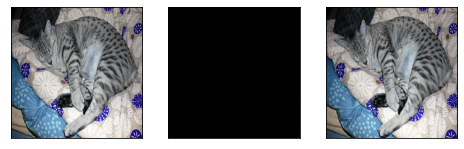

1001 [G loss: 57.912403]
1002 [G loss: 46.600750]
1003 [G loss: 59.989662]
1004 [G loss: 36.299335]
1005 [G loss: 60.783569]
1006 [G loss: 48.740326]
1007 [G loss: 54.349171]
1008 [G loss: 72.497345]
1009 [G loss: 44.639217]
1010 [G loss: 60.284389]
1011 [G loss: 50.633091]
1012 [G loss: 59.548744]
1013 [G loss: 43.280163]
1014 [G loss: 85.727806]
1015 [G loss: 53.953716]
1016 [G loss: 66.312195]
1017 [G loss: 48.096718]
1018 [G loss: 57.955330]
1019 [G loss: 64.830757]
1020 [G loss: 50.393635]
1021 [G loss: 41.619598]
1022 [G loss: 73.806854]
1023 [G loss: 43.634621]
1024 [G loss: 67.107201]
1025 [G loss: 69.939514]
1026 [G loss: 68.376274]
1027 [G loss: 65.396202]
1028 [G loss: 48.063152]
1029 [G loss: 56.115147]
1030 [G loss: 42.747612]
1031 [G loss: 48.788754]
1032 [G loss: 41.142002]
1033 [G loss: 55.943413]
1034 [G loss: 47.876492]
1035 [G loss: 49.254139]
1036 [G loss: 42.612957]
1037 [G loss: 52.430592]
1038 [G loss: 57.022896]
1039 [G loss: 54.978489]
1040 [G loss: 47.290504]


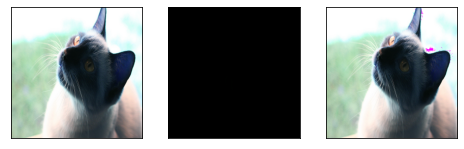

1101 [G loss: 53.488918]
1102 [G loss: 37.550468]
1103 [G loss: 44.091541]
1104 [G loss: 73.196190]
1105 [G loss: 32.915615]
1106 [G loss: 46.347675]
1107 [G loss: 61.159149]
1108 [G loss: 56.833267]
1109 [G loss: 58.000774]
1110 [G loss: 52.616928]
1111 [G loss: 51.665417]
1112 [G loss: 49.267014]
1113 [G loss: 49.018600]
1114 [G loss: 49.923447]
1115 [G loss: 39.330437]
1116 [G loss: 70.277336]
1117 [G loss: 38.016899]
1118 [G loss: 42.041832]
1119 [G loss: 30.804790]
1120 [G loss: 47.551098]
1121 [G loss: 42.329247]
1122 [G loss: 79.216499]
1123 [G loss: 49.898277]
1124 [G loss: 28.598291]
1125 [G loss: 43.488041]
1126 [G loss: 53.661102]
1127 [G loss: 33.220333]
1128 [G loss: 41.233356]
1129 [G loss: 38.885597]
1130 [G loss: 51.676849]
1131 [G loss: 40.716007]
1132 [G loss: 37.331417]
1133 [G loss: 86.840050]
1134 [G loss: 58.785229]
1135 [G loss: 35.351192]
1136 [G loss: 39.705688]
1137 [G loss: 47.749081]
1138 [G loss: 49.866608]
1139 [G loss: 48.689644]
1140 [G loss: 50.820400]


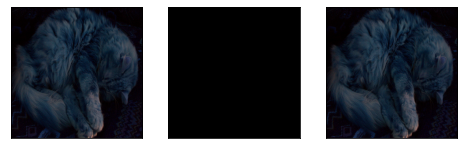

1201 [G loss: 45.890560]
1202 [G loss: 47.984730]
1203 [G loss: 48.149895]
1204 [G loss: 46.029984]
1205 [G loss: 59.630238]
1206 [G loss: 45.494186]
1207 [G loss: 50.015415]
1208 [G loss: 39.508736]
1209 [G loss: 35.271782]
1210 [G loss: 41.566448]
1211 [G loss: 36.581806]
1212 [G loss: 48.529449]
1213 [G loss: 43.081654]
1214 [G loss: 36.236565]
1215 [G loss: 38.818001]
1216 [G loss: 40.773170]
1217 [G loss: 32.126705]
1218 [G loss: 41.132587]
1219 [G loss: 46.554111]
1220 [G loss: 39.162296]
1221 [G loss: 42.594105]
1222 [G loss: 64.212402]
1223 [G loss: 40.985420]
1224 [G loss: 32.461323]
1225 [G loss: 34.161221]
1226 [G loss: 45.715874]
1227 [G loss: 50.585941]
1228 [G loss: 51.662766]
1229 [G loss: 59.097393]
1230 [G loss: 55.083881]
1231 [G loss: 40.786991]
1232 [G loss: 36.334557]
1233 [G loss: 48.778236]
1234 [G loss: 61.704418]
1235 [G loss: 37.010300]
1236 [G loss: 48.454887]
1237 [G loss: 37.147999]
1238 [G loss: 44.530323]
1239 [G loss: 50.945663]
1240 [G loss: 49.137447]


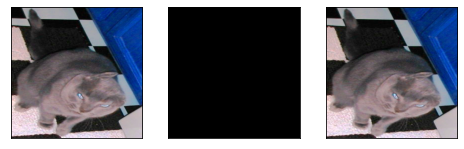

1301 [G loss: 43.618912]
1302 [G loss: 36.130867]
1303 [G loss: 31.936068]
1304 [G loss: 45.235218]
1305 [G loss: 40.671131]
1306 [G loss: 21.648977]
1307 [G loss: 33.708900]
1308 [G loss: 44.784168]
1309 [G loss: 42.936157]
1310 [G loss: 39.272099]
1311 [G loss: 40.339554]
1312 [G loss: 42.025047]
1313 [G loss: 40.821384]
1314 [G loss: 47.154167]
1315 [G loss: 29.898138]
1316 [G loss: 27.703091]
1317 [G loss: 40.195724]
1318 [G loss: 30.732111]
1319 [G loss: 43.892914]
1320 [G loss: 39.535561]
1321 [G loss: 36.766678]
1322 [G loss: 35.248764]
1323 [G loss: 49.870514]
1324 [G loss: 40.751926]
1325 [G loss: 45.575928]
1326 [G loss: 34.854874]
1327 [G loss: 48.203480]
1328 [G loss: 34.432098]
1329 [G loss: 42.819710]
1330 [G loss: 32.233513]
1331 [G loss: 38.255573]
1332 [G loss: 28.026073]
1333 [G loss: 36.876991]
1334 [G loss: 43.466824]
1335 [G loss: 35.916836]
1336 [G loss: 34.970432]
1337 [G loss: 62.670349]
1338 [G loss: 35.229519]
1339 [G loss: 35.942722]
1340 [G loss: 33.802937]


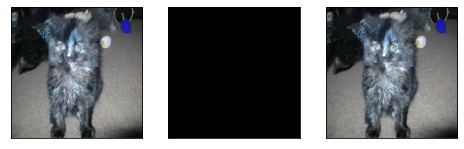

1401 [G loss: 34.378765]
1402 [G loss: 18.301291]
1403 [G loss: 46.858414]
1404 [G loss: 41.938343]
1405 [G loss: 41.061348]
1406 [G loss: 52.703602]
1407 [G loss: 35.178299]
1408 [G loss: 38.450516]
1409 [G loss: 36.617210]
1410 [G loss: 25.540077]
1411 [G loss: 42.408104]
1412 [G loss: 30.371204]
1413 [G loss: 28.664602]
1414 [G loss: 37.845936]
1415 [G loss: 39.225307]
1416 [G loss: 26.018320]
1417 [G loss: 31.324495]
1418 [G loss: 35.439720]
1419 [G loss: 35.748142]
1420 [G loss: 40.818565]
1421 [G loss: 74.897346]
1422 [G loss: 37.925922]
1423 [G loss: 28.151226]
1424 [G loss: 41.955780]
1425 [G loss: 38.435638]
1426 [G loss: 52.713173]
1427 [G loss: 39.713253]
1428 [G loss: 30.513823]
1429 [G loss: 50.459698]
1430 [G loss: 33.101330]
1431 [G loss: 30.571369]
1432 [G loss: 41.220764]
1433 [G loss: 40.803795]
1434 [G loss: 34.669357]
1435 [G loss: 36.554157]
1436 [G loss: 31.428682]
1437 [G loss: 34.911896]
1438 [G loss: 47.768814]
1439 [G loss: 45.198284]
1440 [G loss: 29.571512]


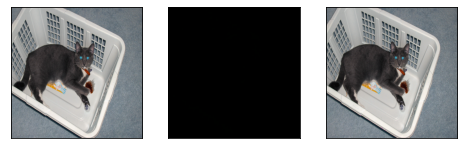

1501 [G loss: 47.927177]
1502 [G loss: 23.735899]
1503 [G loss: 27.697096]
1504 [G loss: 32.080204]
1505 [G loss: 36.432686]
1506 [G loss: 36.977100]
1507 [G loss: 35.478542]
1508 [G loss: 21.311281]
1509 [G loss: 24.921871]
1510 [G loss: 29.466690]
1511 [G loss: 33.159782]
1512 [G loss: 43.152760]
1513 [G loss: 28.936605]
1514 [G loss: 40.696106]
1515 [G loss: 39.414070]
1516 [G loss: 60.568695]
1517 [G loss: 32.257870]
1518 [G loss: 32.671749]
1519 [G loss: 33.600101]
1520 [G loss: 38.638115]
1521 [G loss: 36.249355]
1522 [G loss: 29.784714]
1523 [G loss: 23.813944]
1524 [G loss: 56.122250]
1525 [G loss: 23.911697]
1526 [G loss: 32.796703]
1527 [G loss: 31.580809]
1528 [G loss: 21.411844]
1529 [G loss: 21.301100]
1530 [G loss: 25.713406]
1531 [G loss: 30.213558]
1532 [G loss: 26.743944]
1533 [G loss: 52.475300]
1534 [G loss: 40.345997]
1535 [G loss: 27.647028]
1536 [G loss: 39.166855]
1537 [G loss: 15.829099]
1538 [G loss: 26.761183]
1539 [G loss: 23.327717]
1540 [G loss: 32.630718]


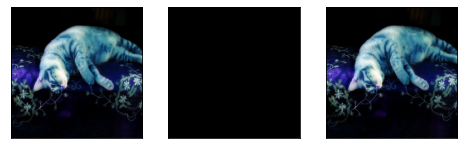

1601 [G loss: 20.426981]
1602 [G loss: 27.261185]
1603 [G loss: 23.357981]
1604 [G loss: 31.817591]
1605 [G loss: 29.956736]
1606 [G loss: 30.903887]
1607 [G loss: 31.023487]
1608 [G loss: 27.123123]
1609 [G loss: 30.263695]
1610 [G loss: 24.416092]
1611 [G loss: 40.489902]
1612 [G loss: 30.145332]
1613 [G loss: 30.342810]
1614 [G loss: 30.411940]
1615 [G loss: 17.576569]
1616 [G loss: 27.400328]
1617 [G loss: 32.842411]
1618 [G loss: 15.837446]
1619 [G loss: 33.868771]
1620 [G loss: 37.440395]
1621 [G loss: 38.222328]
1622 [G loss: 28.236593]
1623 [G loss: 33.780518]
1624 [G loss: 34.110516]
1625 [G loss: 29.021070]
1626 [G loss: 27.733711]
1627 [G loss: 33.272892]
1628 [G loss: 29.495773]
1629 [G loss: 24.138023]
1630 [G loss: 26.368383]
1631 [G loss: 24.721642]
1632 [G loss: 30.208553]
1633 [G loss: 34.876831]
1634 [G loss: 25.349985]
1635 [G loss: 36.922070]
1636 [G loss: 37.066261]
1637 [G loss: 37.722969]
1638 [G loss: 29.622601]
1639 [G loss: 40.766941]
1640 [G loss: 29.131035]


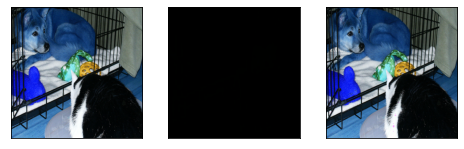

1701 [G loss: 26.578150]
1702 [G loss: 23.172148]
1703 [G loss: 21.257986]
1704 [G loss: 35.461792]
1705 [G loss: 28.476311]
1706 [G loss: 23.381157]
1707 [G loss: 23.475489]
1708 [G loss: 24.494667]
1709 [G loss: 23.821043]
1710 [G loss: 16.724070]
1711 [G loss: 26.566936]
1712 [G loss: 18.129084]
1713 [G loss: 33.309448]
1714 [G loss: 32.488277]
1715 [G loss: 21.850208]
1716 [G loss: 20.805717]
1717 [G loss: 14.372025]
1718 [G loss: 27.970657]
1719 [G loss: 20.424059]
1720 [G loss: 17.617571]
1721 [G loss: 17.389013]
1722 [G loss: 19.618349]
1723 [G loss: 24.748919]
1724 [G loss: 25.830385]
1725 [G loss: 29.288681]
1726 [G loss: 21.473579]
1727 [G loss: 20.550022]
1728 [G loss: 31.751778]
1729 [G loss: 36.565235]
1730 [G loss: 27.482256]
1731 [G loss: 25.811800]
1732 [G loss: 24.898344]
1733 [G loss: 40.807682]
1734 [G loss: 33.963852]
1735 [G loss: 23.235426]
1736 [G loss: 23.486221]
1737 [G loss: 28.208858]
1738 [G loss: 26.604326]
1739 [G loss: 26.292191]
1740 [G loss: 20.983644]


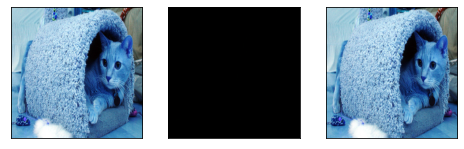

1801 [G loss: 13.960779]
1802 [G loss: 22.907650]
1803 [G loss: 30.858681]
1804 [G loss: 31.389563]
1805 [G loss: 19.662674]
1806 [G loss: 19.068489]
1807 [G loss: 22.066349]
1808 [G loss: 27.078236]
1809 [G loss: 25.270880]
1810 [G loss: 20.125711]
1811 [G loss: 44.707001]
1812 [G loss: 15.046603]
1813 [G loss: 29.317482]
1814 [G loss: 18.970568]
1815 [G loss: 18.792187]
1816 [G loss: 15.416842]
1817 [G loss: 18.430468]
1818 [G loss: 16.001307]
1819 [G loss: 20.384756]
1820 [G loss: 27.639175]
1821 [G loss: 18.620869]
1822 [G loss: 30.360027]
1823 [G loss: 19.570002]
1824 [G loss: 29.859283]
1825 [G loss: 36.915001]
1826 [G loss: 19.663906]
1827 [G loss: 24.364531]
1828 [G loss: 33.747513]
1829 [G loss: 23.752235]
1830 [G loss: 46.346291]
1831 [G loss: 11.128030]
1832 [G loss: 27.025406]
1833 [G loss: 29.113194]
1834 [G loss: 22.566109]
1835 [G loss: 30.252802]
1836 [G loss: 24.248545]
1837 [G loss: 30.057013]
1838 [G loss: 17.474192]
1839 [G loss: 23.057537]
1840 [G loss: 18.080635]


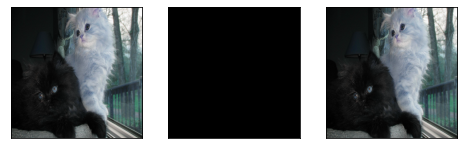

1901 [G loss: 19.554939]
1902 [G loss: 20.869064]
1903 [G loss: 18.408001]
1904 [G loss: 15.541468]
1905 [G loss: 27.431087]
1906 [G loss: 12.833428]
1907 [G loss: 17.197233]
1908 [G loss: 23.730150]
1909 [G loss: 19.674358]
1910 [G loss: 28.571735]
1911 [G loss: 13.199248]
1912 [G loss: 16.754894]
1913 [G loss: 17.589846]
1914 [G loss: 18.963961]
1915 [G loss: 16.604124]
1916 [G loss: 31.397991]
1917 [G loss: 16.508942]
1918 [G loss: 18.999763]
1919 [G loss: 14.795363]
1920 [G loss: 21.918159]
1921 [G loss: 16.636580]
1922 [G loss: 19.336130]
1923 [G loss: 18.856670]
1924 [G loss: 24.416821]
1925 [G loss: 17.164757]
1926 [G loss: 31.656029]
1927 [G loss: 26.233002]
1928 [G loss: 20.689812]
1929 [G loss: 17.596630]
1930 [G loss: 15.071579]
1931 [G loss: 17.713600]
1932 [G loss: 27.399006]
1933 [G loss: 24.813637]
1934 [G loss: 27.761034]
1935 [G loss: 26.334526]
1936 [G loss: 27.888248]
1937 [G loss: 13.681398]
1938 [G loss: 21.271275]
1939 [G loss: 13.625931]
1940 [G loss: 23.964771]


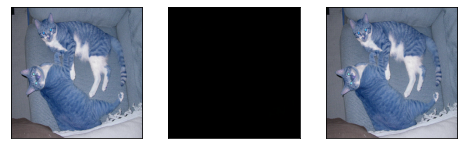

2001 [G loss: 12.870887]
2002 [G loss: 24.374100]
2003 [G loss: 29.847429]
2004 [G loss: 30.493378]
2005 [G loss: 17.000860]
2006 [G loss: 14.241752]
2007 [G loss: 14.247274]
2008 [G loss: 23.127018]
2009 [G loss: 19.410570]
2010 [G loss: 18.457602]
2011 [G loss: 29.108549]
2012 [G loss: 22.013790]
2013 [G loss: 27.686560]
2014 [G loss: 18.324890]
2015 [G loss: 18.687088]
2016 [G loss: 33.238369]
2017 [G loss: 34.864449]
2018 [G loss: 23.129723]
2019 [G loss: 18.912544]
2020 [G loss: 21.818422]
2021 [G loss: 14.807178]
2022 [G loss: 10.845230]
2023 [G loss: 23.652260]
2024 [G loss: 23.067259]
2025 [G loss: 24.929695]
2026 [G loss: 23.808485]
2027 [G loss: 16.547466]
2028 [G loss: 15.355836]
2029 [G loss: 15.521675]
2030 [G loss: 42.191162]
2031 [G loss: 21.251841]
2032 [G loss: 23.234940]
2033 [G loss: 20.131287]
2034 [G loss: 23.569035]
2035 [G loss: 13.256638]
2036 [G loss: 29.598728]
2037 [G loss: 20.675631]
2038 [G loss: 22.842470]
2039 [G loss: 16.637777]
2040 [G loss: 22.018681]


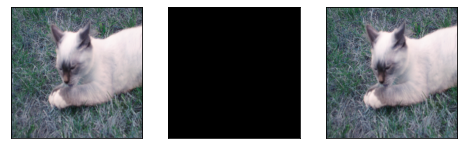

2101 [G loss: 22.377098]
2102 [G loss: 21.222843]
2103 [G loss: 18.906849]
2104 [G loss: 13.950211]
2105 [G loss: 22.088097]
2106 [G loss: 20.984108]
2107 [G loss: 16.984207]
2108 [G loss: 19.427986]
2109 [G loss: 22.654142]
2110 [G loss: 16.099340]
2111 [G loss: 33.885143]
2112 [G loss: 24.531149]
2113 [G loss: 20.698116]
2114 [G loss: 23.222864]
2115 [G loss: 15.515039]
2116 [G loss: 24.286421]
2117 [G loss: 23.368151]
2118 [G loss: 18.881361]
2119 [G loss: 25.404402]
2120 [G loss: 24.608091]
2121 [G loss: 23.236731]
2122 [G loss: 15.503248]
2123 [G loss: 14.872239]
2124 [G loss: 19.701406]
2125 [G loss: 18.152973]
2126 [G loss: 18.236141]
2127 [G loss: 21.066339]
2128 [G loss: 20.200724]
2129 [G loss: 22.654575]
2130 [G loss: 20.149380]
2131 [G loss: 11.840236]
2132 [G loss: 19.019451]
2133 [G loss: 13.713066]
2134 [G loss: 15.991033]
2135 [G loss: 18.500463]
2136 [G loss: 23.207598]
2137 [G loss: 12.131701]
2138 [G loss: 22.266027]
2139 [G loss: 17.297512]
2140 [G loss: 12.902871]


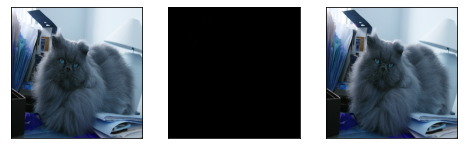

2201 [G loss: 27.385695]
2202 [G loss: 30.255196]
2203 [G loss: 20.553144]
2204 [G loss: 13.938848]
2205 [G loss: 15.234652]
2206 [G loss: 12.251163]
2207 [G loss: 14.010378]
2208 [G loss: 10.928495]
2209 [G loss: 12.786834]
2210 [G loss: 16.693634]
2211 [G loss: 20.288742]
2212 [G loss: 18.200708]
2213 [G loss: 31.062368]
2214 [G loss: 23.166548]
2215 [G loss: 25.496441]
2216 [G loss: 21.908913]
2217 [G loss: 13.415499]
2218 [G loss: 14.534766]
2219 [G loss: 18.412798]
2220 [G loss: 19.657164]
2221 [G loss: 15.042038]
2222 [G loss: 17.535900]
2223 [G loss: 25.425404]
2224 [G loss: 12.998541]
2225 [G loss: 16.826708]
2226 [G loss: 20.960634]
2227 [G loss: 14.747732]
2228 [G loss: 13.204391]
2229 [G loss: 10.759263]
2230 [G loss: 19.188450]
2231 [G loss: 25.050503]
2232 [G loss: 21.099373]
2233 [G loss: 18.898251]
2234 [G loss: 11.879080]
2235 [G loss: 13.055168]
2236 [G loss: 28.987741]
2237 [G loss: 15.285989]
2238 [G loss: 25.762896]
2239 [G loss: 13.379134]
2240 [G loss: 16.229473]


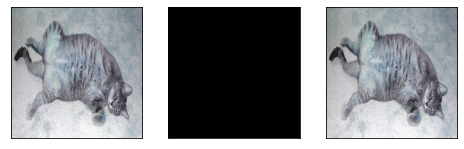

2301 [G loss: 19.851776]
2302 [G loss: 18.254986]
2303 [G loss: 19.658344]
2304 [G loss: 13.885615]
2305 [G loss: 17.751860]
2306 [G loss: 14.619992]
2307 [G loss: 12.984759]
2308 [G loss: 17.179012]
2309 [G loss: 14.694690]
2310 [G loss: 12.203374]
2311 [G loss: 23.953575]
2312 [G loss: 31.982615]
2313 [G loss: 20.860910]
2314 [G loss: 18.796263]
2315 [G loss: 23.143322]
2316 [G loss: 16.030226]
2317 [G loss: 16.962744]
2318 [G loss: 15.255370]
2319 [G loss: 18.285200]
2320 [G loss: 10.802686]
2321 [G loss: 10.081232]
2322 [G loss: 16.810862]
2323 [G loss: 9.815238]
2324 [G loss: 10.904572]
2325 [G loss: 17.603693]
2326 [G loss: 19.625093]
2327 [G loss: 12.335723]
2328 [G loss: 14.768998]
2329 [G loss: 15.064749]
2330 [G loss: 16.385828]
2331 [G loss: 9.936824]
2332 [G loss: 12.942870]
2333 [G loss: 14.378379]
2334 [G loss: 12.032996]
2335 [G loss: 13.950674]
2336 [G loss: 11.652040]
2337 [G loss: 15.974195]
2338 [G loss: 18.217848]
2339 [G loss: 11.074811]
2340 [G loss: 16.748281]
23

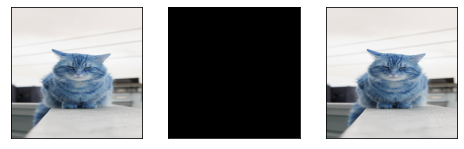

2401 [G loss: 15.647564]
2402 [G loss: 20.095926]
2403 [G loss: 16.165789]
2404 [G loss: 16.956713]
2405 [G loss: 7.847467]
2406 [G loss: 22.873127]
2407 [G loss: 16.254507]
2408 [G loss: 18.242388]
2409 [G loss: 13.439964]
2410 [G loss: 18.345072]
2411 [G loss: 12.824412]
2412 [G loss: 12.701714]
2413 [G loss: 15.631838]
2414 [G loss: 14.612342]
2415 [G loss: 11.739863]
2416 [G loss: 13.318470]
2417 [G loss: 19.054863]
2418 [G loss: 22.384098]
2419 [G loss: 14.010809]
2420 [G loss: 11.637033]
2421 [G loss: 15.431845]
2422 [G loss: 12.357551]
2423 [G loss: 15.754851]
2424 [G loss: 19.280245]
2425 [G loss: 16.908207]
2426 [G loss: 13.339334]
2427 [G loss: 15.295480]
2428 [G loss: 9.112037]
2429 [G loss: 16.173784]
2430 [G loss: 25.347374]
2431 [G loss: 11.953165]
2432 [G loss: 28.068497]
2433 [G loss: 15.686752]
2434 [G loss: 24.739002]
2435 [G loss: 10.821350]
2436 [G loss: 22.768951]
2437 [G loss: 13.186902]
2438 [G loss: 11.458107]
2439 [G loss: 15.028677]
2440 [G loss: 13.047859]
24

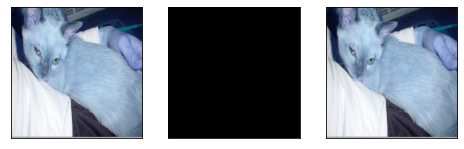

2501 [G loss: 23.045155]
2502 [G loss: 12.751417]
2503 [G loss: 10.469450]
2504 [G loss: 13.715870]
2505 [G loss: 19.971752]
2506 [G loss: 12.546311]
2507 [G loss: 11.252940]
2508 [G loss: 10.069370]
2509 [G loss: 16.479797]
2510 [G loss: 10.576938]
2511 [G loss: 8.985328]
2512 [G loss: 15.485446]
2513 [G loss: 21.395351]
2514 [G loss: 10.867488]
2515 [G loss: 9.652249]
2516 [G loss: 14.799906]
2517 [G loss: 10.516535]
2518 [G loss: 16.232563]
2519 [G loss: 15.935738]
2520 [G loss: 18.621725]
2521 [G loss: 12.286531]
2522 [G loss: 21.672235]
2523 [G loss: 12.672403]
2524 [G loss: 18.104412]
2525 [G loss: 14.708830]
2526 [G loss: 14.907857]
2527 [G loss: 13.343263]
2528 [G loss: 12.073225]
2529 [G loss: 22.419313]
2530 [G loss: 10.335162]
2531 [G loss: 18.175129]
2532 [G loss: 18.187815]
2533 [G loss: 19.156384]
2534 [G loss: 21.907631]
2535 [G loss: 8.023617]
2536 [G loss: 12.558542]
2537 [G loss: 14.143234]
2538 [G loss: 18.229000]
2539 [G loss: 14.884023]
2540 [G loss: 15.164809]
254

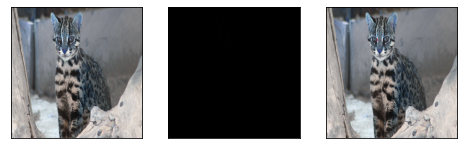

2601 [G loss: 17.211361]
2602 [G loss: 13.694616]
2603 [G loss: 26.556549]
2604 [G loss: 14.144803]
2605 [G loss: 14.915716]
2606 [G loss: 12.670044]
2607 [G loss: 9.870969]
2608 [G loss: 18.182837]
2609 [G loss: 19.231749]
2610 [G loss: 16.974575]
2611 [G loss: 11.617326]
2612 [G loss: 8.713387]
2613 [G loss: 12.949214]
2614 [G loss: 9.954167]
2615 [G loss: 20.616423]
2616 [G loss: 13.020854]
2617 [G loss: 7.813680]
2618 [G loss: 9.264154]
2619 [G loss: 10.235213]
2620 [G loss: 18.275295]
2621 [G loss: 10.163795]
2622 [G loss: 12.627846]
2623 [G loss: 5.947218]
2624 [G loss: 16.977150]
2625 [G loss: 14.241127]
2626 [G loss: 15.065755]
2627 [G loss: 25.409575]
2628 [G loss: 16.976955]
2629 [G loss: 20.215670]
2630 [G loss: 13.549099]
2631 [G loss: 11.810109]
2632 [G loss: 21.094440]
2633 [G loss: 16.950344]
2634 [G loss: 6.110009]
2635 [G loss: 8.689229]
2636 [G loss: 12.966920]
2637 [G loss: 13.673407]
2638 [G loss: 13.067364]
2639 [G loss: 15.579785]
2640 [G loss: 8.712417]
2641 [G l

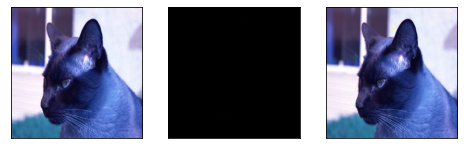

2701 [G loss: 11.921276]
2702 [G loss: 14.835104]
2703 [G loss: 10.813533]
2704 [G loss: 6.378309]
2705 [G loss: 9.128763]
2706 [G loss: 9.495392]
2707 [G loss: 13.429453]
2708 [G loss: 10.003101]
2709 [G loss: 15.891965]
2710 [G loss: 19.718523]
2711 [G loss: 11.808460]
2712 [G loss: 17.804853]
2713 [G loss: 10.969034]
2714 [G loss: 10.999721]
2715 [G loss: 11.079937]
2716 [G loss: 10.793809]
2717 [G loss: 11.451067]
2718 [G loss: 7.750621]
2719 [G loss: 12.804324]
2720 [G loss: 12.628687]
2721 [G loss: 13.731827]
2722 [G loss: 11.148967]
2723 [G loss: 19.554556]
2724 [G loss: 7.411256]
2725 [G loss: 11.139681]
2726 [G loss: 11.630398]
2727 [G loss: 13.988029]
2728 [G loss: 11.125995]
2729 [G loss: 9.301600]
2730 [G loss: 8.025630]
2731 [G loss: 13.903810]
2732 [G loss: 10.816646]
2733 [G loss: 10.207742]
2734 [G loss: 15.671489]
2735 [G loss: 10.242242]
2736 [G loss: 18.646418]
2737 [G loss: 14.185481]
2738 [G loss: 10.788540]
2739 [G loss: 8.567295]
2740 [G loss: 14.785886]
2741 [G 

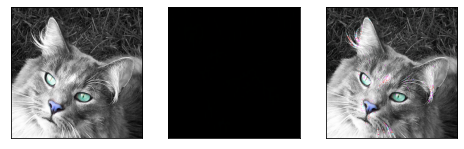

2801 [G loss: 10.039275]
2802 [G loss: 11.935738]
2803 [G loss: 11.067596]
2804 [G loss: 8.169778]
2805 [G loss: 11.011637]
2806 [G loss: 14.374719]
2807 [G loss: 11.952444]
2808 [G loss: 9.810865]
2809 [G loss: 11.901054]
2810 [G loss: 14.899503]
2811 [G loss: 10.071889]
2812 [G loss: 12.324590]
2813 [G loss: 12.790150]
2814 [G loss: 9.434282]
2815 [G loss: 8.852870]
2816 [G loss: 8.867716]
2817 [G loss: 16.405209]
2818 [G loss: 11.887297]
2819 [G loss: 10.632929]
2820 [G loss: 7.060568]
2821 [G loss: 14.079216]
2822 [G loss: 21.180246]
2823 [G loss: 11.835421]
2824 [G loss: 8.939849]
2825 [G loss: 11.590896]
2826 [G loss: 16.811579]
2827 [G loss: 17.386940]
2828 [G loss: 8.515407]
2829 [G loss: 7.745885]
2830 [G loss: 7.480612]
2831 [G loss: 15.566906]
2832 [G loss: 10.141982]
2833 [G loss: 9.824332]
2834 [G loss: 11.836946]
2835 [G loss: 19.115488]
2836 [G loss: 9.154741]
2837 [G loss: 10.840887]
2838 [G loss: 10.208469]
2839 [G loss: 10.887701]
2840 [G loss: 10.121791]
2841 [G loss

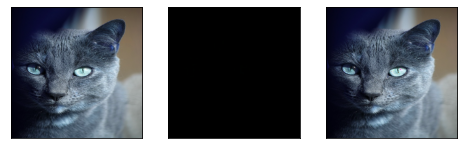

2901 [G loss: 7.152439]
2902 [G loss: 8.116478]
2903 [G loss: 14.340389]
2904 [G loss: 13.794175]
2905 [G loss: 10.605291]
2906 [G loss: 10.824469]
2907 [G loss: 8.878827]
2908 [G loss: 9.001892]
2909 [G loss: 7.677149]
2910 [G loss: 9.158931]
2911 [G loss: 7.882786]
2912 [G loss: 17.877249]
2913 [G loss: 15.009470]
2914 [G loss: 10.490588]
2915 [G loss: 7.294678]
2916 [G loss: 15.207891]
2917 [G loss: 9.112738]
2918 [G loss: 10.009975]
2919 [G loss: 8.907686]
2920 [G loss: 6.154700]
2921 [G loss: 12.819964]
2922 [G loss: 8.272703]
2923 [G loss: 10.751242]
2924 [G loss: 11.295931]
2925 [G loss: 13.610572]
2926 [G loss: 10.607019]
2927 [G loss: 11.930024]
2928 [G loss: 5.197232]
2929 [G loss: 9.935919]
2930 [G loss: 9.076569]
2931 [G loss: 11.145655]
2932 [G loss: 10.531284]
2933 [G loss: 12.424667]
2934 [G loss: 12.319407]
2935 [G loss: 10.819721]
2936 [G loss: 10.389935]
2937 [G loss: 7.176923]
2938 [G loss: 8.003913]
2939 [G loss: 9.432451]
2940 [G loss: 7.980782]
2941 [G loss: 16.73

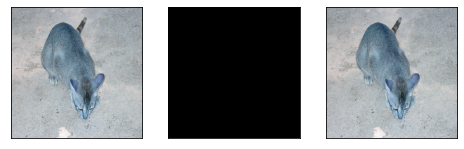

3001 [G loss: 13.499392]
3002 [G loss: 7.608552]
3003 [G loss: 6.647907]
3004 [G loss: 10.860574]
3005 [G loss: 8.206621]
3006 [G loss: 5.977212]
3007 [G loss: 14.020342]
3008 [G loss: 13.029538]
3009 [G loss: 10.113629]
3010 [G loss: 12.454222]
3011 [G loss: 10.814084]
3012 [G loss: 11.263614]
3013 [G loss: 10.636559]
3014 [G loss: 10.417214]
3015 [G loss: 11.648724]
3016 [G loss: 12.981237]
3017 [G loss: 11.854532]
3018 [G loss: 13.126066]
3019 [G loss: 9.124789]
3020 [G loss: 7.917512]
3021 [G loss: 9.899073]
3022 [G loss: 9.237715]
3023 [G loss: 6.607686]
3024 [G loss: 12.355149]
3025 [G loss: 13.757178]
3026 [G loss: 9.888668]
3027 [G loss: 13.477650]
3028 [G loss: 7.567129]
3029 [G loss: 7.932190]
3030 [G loss: 6.599252]
3031 [G loss: 8.088348]
3032 [G loss: 14.218783]
3033 [G loss: 9.576962]
3034 [G loss: 6.666603]
3035 [G loss: 11.671962]
3036 [G loss: 7.379148]
3037 [G loss: 12.742776]
3038 [G loss: 8.906521]
3039 [G loss: 6.743362]
3040 [G loss: 7.670517]
3041 [G loss: 5.1710

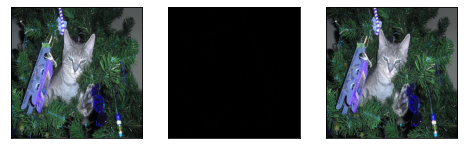

3101 [G loss: 10.360728]
3102 [G loss: 6.016388]
3103 [G loss: 3.829148]
3104 [G loss: 15.583800]
3105 [G loss: 10.508345]
3106 [G loss: 10.999160]
3107 [G loss: 5.499461]
3108 [G loss: 9.415865]
3109 [G loss: 4.847396]
3110 [G loss: 6.119399]
3111 [G loss: 8.863241]
3112 [G loss: 8.455483]
3113 [G loss: 7.325253]
3114 [G loss: 6.493169]
3115 [G loss: 9.228358]
3116 [G loss: 9.820338]
3117 [G loss: 12.015533]
3118 [G loss: 7.125490]
3119 [G loss: 12.411271]
3120 [G loss: 14.204160]
3121 [G loss: 10.739441]
3122 [G loss: 7.283177]
3123 [G loss: 6.743736]
3124 [G loss: 10.817146]
3125 [G loss: 6.607905]
3126 [G loss: 7.000904]
3127 [G loss: 8.470735]
3128 [G loss: 10.695794]
3129 [G loss: 10.821707]
3130 [G loss: 6.650005]
3131 [G loss: 7.426436]
3132 [G loss: 8.090982]
3133 [G loss: 10.474493]
3134 [G loss: 8.291583]
3135 [G loss: 12.888310]
3136 [G loss: 10.161575]
3137 [G loss: 7.982902]
3138 [G loss: 15.339148]
3139 [G loss: 9.488657]
3140 [G loss: 7.477881]
3141 [G loss: 7.628645]
3

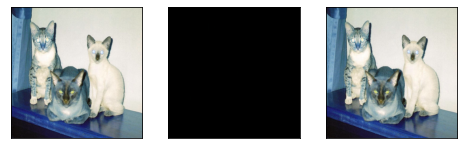

3201 [G loss: 13.719807]
3202 [G loss: 13.590656]
3203 [G loss: 9.697907]
3204 [G loss: 5.201255]
3205 [G loss: 12.946619]
3206 [G loss: 8.778081]
3207 [G loss: 18.776516]
3208 [G loss: 6.077569]
3209 [G loss: 7.538634]
3210 [G loss: 10.767338]
3211 [G loss: 6.530229]
3212 [G loss: 10.024553]
3213 [G loss: 8.000290]
3214 [G loss: 3.941033]
3215 [G loss: 9.568427]
3216 [G loss: 10.103356]
3217 [G loss: 9.398362]
3218 [G loss: 8.587657]
3219 [G loss: 6.628956]
3220 [G loss: 5.990739]
3221 [G loss: 8.502812]
3222 [G loss: 12.282250]
3223 [G loss: 10.456040]
3224 [G loss: 7.337725]
3225 [G loss: 5.522744]
3226 [G loss: 6.181148]
3227 [G loss: 4.179394]
3228 [G loss: 10.076209]
3229 [G loss: 4.882591]
3230 [G loss: 11.744970]
3231 [G loss: 8.913460]
3232 [G loss: 8.163652]
3233 [G loss: 10.946187]
3234 [G loss: 5.843136]
3235 [G loss: 5.357220]
3236 [G loss: 11.152086]
3237 [G loss: 9.124090]
3238 [G loss: 7.400206]
3239 [G loss: 8.285756]
3240 [G loss: 8.507611]
3241 [G loss: 10.196651]
32

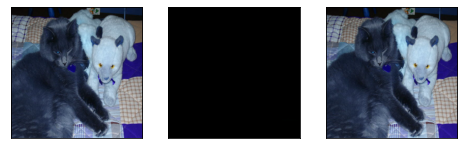

3301 [G loss: 7.809201]
3302 [G loss: 7.798948]
3303 [G loss: 7.553364]
3304 [G loss: 6.863383]
3305 [G loss: 8.833307]
3306 [G loss: 6.289261]
3307 [G loss: 11.352263]
3308 [G loss: 8.345886]
3309 [G loss: 8.675346]
3310 [G loss: 9.389840]
3311 [G loss: 6.805827]
3312 [G loss: 11.004433]
3313 [G loss: 10.714233]
3314 [G loss: 9.129203]
3315 [G loss: 7.864225]
3316 [G loss: 4.270647]
3317 [G loss: 5.677500]
3318 [G loss: 7.192791]
3319 [G loss: 6.299129]
3320 [G loss: 5.524328]
3321 [G loss: 10.345122]
3322 [G loss: 6.975296]
3323 [G loss: 6.081921]
3324 [G loss: 6.487147]
3325 [G loss: 7.262430]
3326 [G loss: 8.632360]
3327 [G loss: 9.110366]
3328 [G loss: 7.050831]
3329 [G loss: 10.078206]
3330 [G loss: 7.161220]
3331 [G loss: 9.746523]
3332 [G loss: 6.284372]
3333 [G loss: 8.191638]
3334 [G loss: 9.497374]
3335 [G loss: 5.796412]
3336 [G loss: 15.327428]
3337 [G loss: 13.702197]
3338 [G loss: 6.251749]
3339 [G loss: 6.468688]
3340 [G loss: 7.368609]
3341 [G loss: 9.176740]
3342 [G l

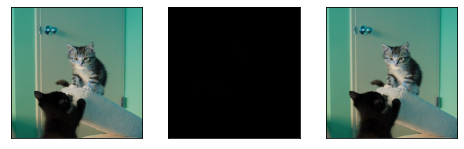

3401 [G loss: 9.644191]
3402 [G loss: 8.309699]
3403 [G loss: 11.042704]
3404 [G loss: 10.219209]
3405 [G loss: 5.655867]
3406 [G loss: 8.546747]
3407 [G loss: 10.095463]
3408 [G loss: 7.389619]
3409 [G loss: 6.882975]
3410 [G loss: 8.311421]
3411 [G loss: 7.705000]
3412 [G loss: 8.121262]
3413 [G loss: 7.572788]
3414 [G loss: 7.155822]
3415 [G loss: 13.951890]
3416 [G loss: 7.632062]
3417 [G loss: 9.662150]
3418 [G loss: 11.256124]
3419 [G loss: 6.895310]
3420 [G loss: 8.646132]
3421 [G loss: 11.311859]
3422 [G loss: 6.743670]
3423 [G loss: 6.034283]
3424 [G loss: 9.496099]
3425 [G loss: 4.595314]
3426 [G loss: 10.566670]
3427 [G loss: 8.712049]
3428 [G loss: 8.060680]
3429 [G loss: 9.054285]
3430 [G loss: 7.397438]
3431 [G loss: 7.130049]
3432 [G loss: 6.455436]
3433 [G loss: 4.937753]
3434 [G loss: 7.545463]
3435 [G loss: 5.394126]
3436 [G loss: 5.807756]
3437 [G loss: 6.448468]
3438 [G loss: 7.683923]
3439 [G loss: 7.514303]
3440 [G loss: 20.770697]
3441 [G loss: 6.079610]
3442 [G 

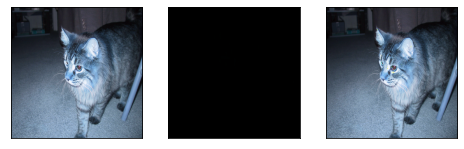

3501 [G loss: 6.840442]
3502 [G loss: 6.857671]
3503 [G loss: 10.781758]
3504 [G loss: 9.365751]
3505 [G loss: 11.958863]
3506 [G loss: 6.549000]
3507 [G loss: 5.988791]
3508 [G loss: 9.782471]
3509 [G loss: 14.596444]
3510 [G loss: 6.919466]
3511 [G loss: 9.919632]
3512 [G loss: 3.254862]
3513 [G loss: 3.713777]
3514 [G loss: 7.481707]
3515 [G loss: 7.442109]
3516 [G loss: 5.771836]
3517 [G loss: 6.408864]
3518 [G loss: 5.694315]
3519 [G loss: 6.520139]
3520 [G loss: 8.776502]
3521 [G loss: 6.485526]
3522 [G loss: 4.552776]
3523 [G loss: 5.775664]
3524 [G loss: 6.093130]
3525 [G loss: 6.603117]
3526 [G loss: 7.389330]
3527 [G loss: 3.572155]
3528 [G loss: 5.476786]
3529 [G loss: 9.991081]
3530 [G loss: 8.107546]
3531 [G loss: 7.299468]
3532 [G loss: 4.286383]
3533 [G loss: 12.189805]
3534 [G loss: 6.561500]
3535 [G loss: 6.321957]
3536 [G loss: 10.220293]
3537 [G loss: 7.496924]
3538 [G loss: 5.478949]
3539 [G loss: 6.993511]
3540 [G loss: 9.333393]
3541 [G loss: 6.419165]
3542 [G los

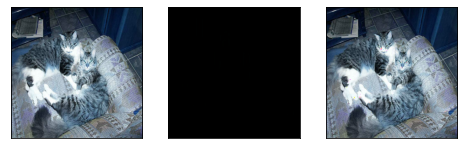

3601 [G loss: 11.359461]
3602 [G loss: 6.595627]
3603 [G loss: 5.657349]
3604 [G loss: 6.233766]
3605 [G loss: 6.615186]
3606 [G loss: 6.124568]
3607 [G loss: 9.289219]
3608 [G loss: 6.498490]
3609 [G loss: 6.508929]
3610 [G loss: 7.456218]
3611 [G loss: 8.301896]
3612 [G loss: 7.009713]
3613 [G loss: 6.413578]
3614 [G loss: 4.405979]
3615 [G loss: 4.504214]
3616 [G loss: 10.535116]
3617 [G loss: 13.812251]
3618 [G loss: 8.196958]
3619 [G loss: 9.439603]
3620 [G loss: 6.461696]
3621 [G loss: 8.879358]
3622 [G loss: 6.850125]
3623 [G loss: 9.713387]
3624 [G loss: 6.947622]
3625 [G loss: 12.061240]
3626 [G loss: 2.990394]
3627 [G loss: 3.673730]
3628 [G loss: 5.788306]
3629 [G loss: 6.672515]
3630 [G loss: 5.075191]
3631 [G loss: 7.740341]
3632 [G loss: 9.122941]
3633 [G loss: 6.967400]
3634 [G loss: 6.775517]
3635 [G loss: 3.492037]
3636 [G loss: 6.098819]
3637 [G loss: 3.755352]
3638 [G loss: 7.563017]
3639 [G loss: 7.178069]
3640 [G loss: 7.678708]
3641 [G loss: 5.562291]
3642 [G loss

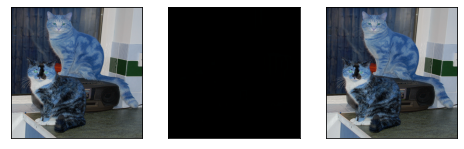

3701 [G loss: 6.800961]
3702 [G loss: 7.624491]
3703 [G loss: 5.209369]
3704 [G loss: 4.731306]
3705 [G loss: 7.875092]
3706 [G loss: 7.571250]
3707 [G loss: 8.832287]
3708 [G loss: 5.878898]
3709 [G loss: 7.893949]
3710 [G loss: 9.086480]
3711 [G loss: 5.728109]
3712 [G loss: 5.333318]
3713 [G loss: 7.639297]
3714 [G loss: 8.700096]
3715 [G loss: 5.835811]
3716 [G loss: 6.357306]
3717 [G loss: 4.671164]
3718 [G loss: 9.938598]
3719 [G loss: 2.888261]
3720 [G loss: 3.824978]
3721 [G loss: 11.178995]
3722 [G loss: 6.211225]
3723 [G loss: 8.268595]
3724 [G loss: 6.335523]
3725 [G loss: 6.282324]
3726 [G loss: 4.460840]
3727 [G loss: 7.962898]
3728 [G loss: 6.525940]
3729 [G loss: 9.089015]
3730 [G loss: 6.083600]
3731 [G loss: 4.705688]
3732 [G loss: 6.116008]
3733 [G loss: 7.606627]
3734 [G loss: 7.287422]
3735 [G loss: 7.653410]
3736 [G loss: 6.738151]
3737 [G loss: 6.303015]
3738 [G loss: 7.518347]
3739 [G loss: 9.597295]
3740 [G loss: 4.010201]
3741 [G loss: 5.423338]
3742 [G loss: 7

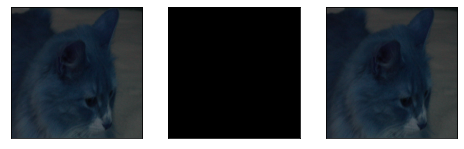

3801 [G loss: 4.393060]
3802 [G loss: 6.238138]
3803 [G loss: 9.360233]
3804 [G loss: 9.435207]
3805 [G loss: 7.092307]
3806 [G loss: 5.157200]
3807 [G loss: 5.091015]
3808 [G loss: 11.310383]
3809 [G loss: 3.843489]
3810 [G loss: 6.037368]
3811 [G loss: 5.530645]
3812 [G loss: 5.630820]
3813 [G loss: 4.271345]
3814 [G loss: 7.920805]
3815 [G loss: 4.911880]
3816 [G loss: 3.558211]
3817 [G loss: 8.223657]
3818 [G loss: 5.184457]
3819 [G loss: 4.760675]
3820 [G loss: 3.800410]
3821 [G loss: 4.230188]
3822 [G loss: 5.072452]
3823 [G loss: 3.333054]
3824 [G loss: 6.283841]
3825 [G loss: 6.528041]
3826 [G loss: 5.239177]
3827 [G loss: 7.008897]
3828 [G loss: 6.900880]
3829 [G loss: 4.613345]
3830 [G loss: 4.541166]
3831 [G loss: 8.894692]
3832 [G loss: 6.896875]
3833 [G loss: 7.876250]
3834 [G loss: 4.608181]
3835 [G loss: 4.803768]
3836 [G loss: 6.053978]
3837 [G loss: 7.562913]
3838 [G loss: 3.707480]
3839 [G loss: 5.295357]
3840 [G loss: 3.448347]
3841 [G loss: 8.835992]
3842 [G loss: 6

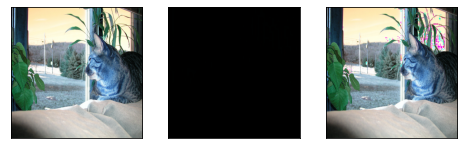

3901 [G loss: 9.380957]
3902 [G loss: 6.545799]
3903 [G loss: 5.281059]
3904 [G loss: 7.157935]
3905 [G loss: 5.736002]
3906 [G loss: 6.565502]
3907 [G loss: 4.013825]
3908 [G loss: 4.355908]
3909 [G loss: 7.479826]
3910 [G loss: 7.555151]
3911 [G loss: 7.887581]
3912 [G loss: 6.926297]
3913 [G loss: 5.634645]
3914 [G loss: 4.682534]
3915 [G loss: 3.784866]
3916 [G loss: 3.517317]
3917 [G loss: 6.698267]
3918 [G loss: 7.127440]
3919 [G loss: 4.147792]
3920 [G loss: 5.054556]
3921 [G loss: 4.547134]
3922 [G loss: 6.404575]
3923 [G loss: 4.184260]
3924 [G loss: 5.731939]
3925 [G loss: 5.289253]
3926 [G loss: 4.414075]
3927 [G loss: 8.065013]
3928 [G loss: 7.243039]
3929 [G loss: 3.962137]
3930 [G loss: 7.998816]
3931 [G loss: 6.973054]
3932 [G loss: 4.493320]
3933 [G loss: 9.329490]
3934 [G loss: 6.830384]
3935 [G loss: 5.873621]
3936 [G loss: 5.667128]
3937 [G loss: 6.590466]
3938 [G loss: 8.020934]
3939 [G loss: 5.959073]
3940 [G loss: 4.598683]
3941 [G loss: 5.856535]
3942 [G loss: 4.

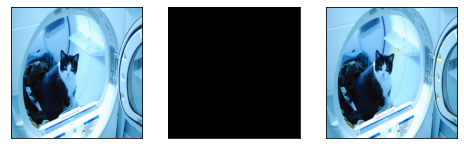

4001 [G loss: 5.297843]
4002 [G loss: 5.032359]
4003 [G loss: 5.293690]
4004 [G loss: 4.848979]
4005 [G loss: 8.254078]
4006 [G loss: 8.011257]
4007 [G loss: 7.418024]
4008 [G loss: 7.092560]
4009 [G loss: 6.200251]
4010 [G loss: 5.172835]
4011 [G loss: 8.194787]
4012 [G loss: 6.393660]
4013 [G loss: 7.781570]
4014 [G loss: 4.227032]
4015 [G loss: 6.951353]
4016 [G loss: 4.252718]
4017 [G loss: 4.095374]
4018 [G loss: 5.428879]
4019 [G loss: 6.629385]
4020 [G loss: 4.426546]
4021 [G loss: 4.897148]
4022 [G loss: 5.238730]
4023 [G loss: 8.832515]
4024 [G loss: 5.835807]
4025 [G loss: 3.590972]
4026 [G loss: 6.748506]
4027 [G loss: 7.663575]
4028 [G loss: 5.184474]
4029 [G loss: 3.968486]
4030 [G loss: 5.619422]
4031 [G loss: 5.108933]
4032 [G loss: 7.314397]
4033 [G loss: 4.472084]
4034 [G loss: 2.981908]
4035 [G loss: 3.291914]
4036 [G loss: 6.756580]
4037 [G loss: 5.785760]
4038 [G loss: 4.003231]
4039 [G loss: 5.824040]
4040 [G loss: 5.648113]
4041 [G loss: 7.835811]
4042 [G loss: 4.

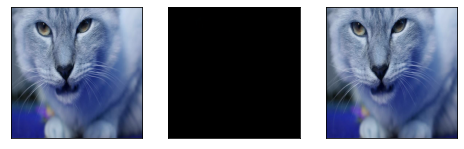

4101 [G loss: 5.831155]
4102 [G loss: 4.400049]
4103 [G loss: 5.959535]
4104 [G loss: 7.515033]
4105 [G loss: 6.114145]
4106 [G loss: 4.815734]
4107 [G loss: 7.871357]
4108 [G loss: 7.037223]
4109 [G loss: 7.354608]
4110 [G loss: 5.045473]
4111 [G loss: 4.384255]
4112 [G loss: 4.978163]
4113 [G loss: 2.870581]
4114 [G loss: 5.382764]
4115 [G loss: 3.799726]
4116 [G loss: 3.943191]
4117 [G loss: 5.322562]
4118 [G loss: 6.733281]
4119 [G loss: 5.228916]
4120 [G loss: 3.017484]
4121 [G loss: 6.197191]
4122 [G loss: 10.470565]
4123 [G loss: 3.751774]
4124 [G loss: 3.826394]
4125 [G loss: 4.352639]
4126 [G loss: 6.207614]
4127 [G loss: 3.892338]
4128 [G loss: 8.651755]
4129 [G loss: 6.326819]
4130 [G loss: 3.516714]
4131 [G loss: 4.375902]
4132 [G loss: 5.963043]
4133 [G loss: 6.081661]
4134 [G loss: 3.929287]
4135 [G loss: 5.491268]
4136 [G loss: 5.163332]
4137 [G loss: 4.329000]
4138 [G loss: 7.090186]
4139 [G loss: 4.213308]
4140 [G loss: 5.658210]
4141 [G loss: 3.474364]
4142 [G loss: 4

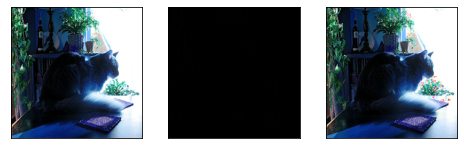

4201 [G loss: 5.227805]
4202 [G loss: 4.448977]
4203 [G loss: 6.002212]
4204 [G loss: 4.017321]
4205 [G loss: 4.734852]
4206 [G loss: 3.779444]
4207 [G loss: 4.154180]
4208 [G loss: 3.589813]
4209 [G loss: 4.702655]
4210 [G loss: 4.408401]
4211 [G loss: 4.706037]
4212 [G loss: 6.794898]
4213 [G loss: 6.314343]
4214 [G loss: 3.711603]
4215 [G loss: 4.218430]
4216 [G loss: 3.783100]
4217 [G loss: 4.420543]
4218 [G loss: 5.835675]
4219 [G loss: 3.737916]
4220 [G loss: 3.686052]
4221 [G loss: 5.257871]
4222 [G loss: 8.269751]
4223 [G loss: 5.452917]
4224 [G loss: 8.557920]
4225 [G loss: 5.833165]
4226 [G loss: 4.529242]
4227 [G loss: 4.381191]
4228 [G loss: 4.652527]
4229 [G loss: 4.406256]
4230 [G loss: 5.348659]
4231 [G loss: 5.481217]
4232 [G loss: 3.827256]
4233 [G loss: 3.188944]
4234 [G loss: 3.431067]
4235 [G loss: 6.120600]
4236 [G loss: 3.321845]
4237 [G loss: 3.984066]
4238 [G loss: 4.628270]
4239 [G loss: 2.559595]
4240 [G loss: 7.272193]
4241 [G loss: 5.696317]
4242 [G loss: 4.

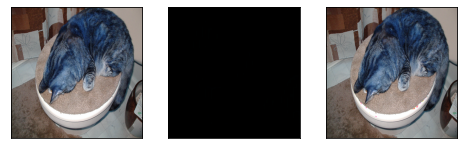

4301 [G loss: 5.745812]
4302 [G loss: 6.532485]
4303 [G loss: 3.909372]
4304 [G loss: 7.226592]
4305 [G loss: 3.277537]
4306 [G loss: 7.964018]
4307 [G loss: 4.509239]
4308 [G loss: 3.385562]
4309 [G loss: 10.481619]
4310 [G loss: 6.353502]
4311 [G loss: 7.585018]
4312 [G loss: 5.282553]
4313 [G loss: 2.107377]
4314 [G loss: 3.975044]
4315 [G loss: 2.616657]
4316 [G loss: 2.268773]
4317 [G loss: 5.660747]
4318 [G loss: 5.843841]
4319 [G loss: 5.396250]
4320 [G loss: 6.342953]
4321 [G loss: 6.041289]
4322 [G loss: 3.295960]
4323 [G loss: 3.745166]
4324 [G loss: 4.371458]
4325 [G loss: 2.873374]
4326 [G loss: 6.954475]
4327 [G loss: 2.514457]
4328 [G loss: 3.681340]
4329 [G loss: 6.602828]
4330 [G loss: 4.258780]
4331 [G loss: 4.284312]
4332 [G loss: 6.102315]
4333 [G loss: 3.947497]
4334 [G loss: 4.833856]
4335 [G loss: 4.061820]
4336 [G loss: 5.097713]
4337 [G loss: 5.019678]
4338 [G loss: 3.197961]
4339 [G loss: 4.714637]
4340 [G loss: 2.735479]
4341 [G loss: 4.479279]
4342 [G loss: 4

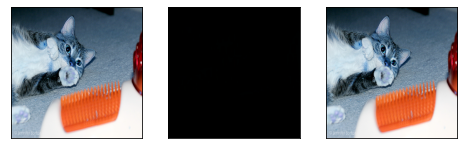

4401 [G loss: 5.009468]
4402 [G loss: 8.544804]
4403 [G loss: 3.531524]
4404 [G loss: 6.554054]
4405 [G loss: 5.058371]
4406 [G loss: 6.060818]
4407 [G loss: 3.825663]
4408 [G loss: 3.075609]
4409 [G loss: 5.112500]
4410 [G loss: 4.395157]
4411 [G loss: 2.368480]
4412 [G loss: 3.697625]
4413 [G loss: 6.883841]
4414 [G loss: 4.119566]
4415 [G loss: 4.613066]
4416 [G loss: 5.673362]
4417 [G loss: 6.443445]
4418 [G loss: 3.475121]
4419 [G loss: 3.068806]
4420 [G loss: 4.335677]
4421 [G loss: 3.293342]
4422 [G loss: 3.091292]
4423 [G loss: 8.680261]
4424 [G loss: 4.303170]
4425 [G loss: 4.930132]
4426 [G loss: 5.292818]
4427 [G loss: 4.723062]
4428 [G loss: 6.952446]
4429 [G loss: 4.086839]
4430 [G loss: 4.314684]
4431 [G loss: 3.215872]
4432 [G loss: 4.340159]
4433 [G loss: 3.177284]
4434 [G loss: 4.664244]
4435 [G loss: 5.560019]
4436 [G loss: 2.794868]
4437 [G loss: 4.262631]
4438 [G loss: 4.967619]
4439 [G loss: 4.391944]
4440 [G loss: 2.929966]
4441 [G loss: 4.316344]
4442 [G loss: 5.

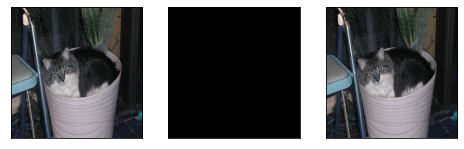

4501 [G loss: 4.054206]
4502 [G loss: 4.711541]
4503 [G loss: 8.102839]
4504 [G loss: 4.165625]
4505 [G loss: 3.181087]
4506 [G loss: 2.944362]
4507 [G loss: 4.990375]
4508 [G loss: 5.772858]
4509 [G loss: 4.637010]
4510 [G loss: 2.826384]
4511 [G loss: 2.991785]
4512 [G loss: 4.270247]
4513 [G loss: 2.384931]
4514 [G loss: 3.374768]
4515 [G loss: 6.128283]
4516 [G loss: 2.498907]
4517 [G loss: 3.441633]
4518 [G loss: 4.517056]
4519 [G loss: 3.947072]
4520 [G loss: 2.123329]
4521 [G loss: 6.674031]
4522 [G loss: 3.770942]
4523 [G loss: 5.746756]
4524 [G loss: 3.445388]
4525 [G loss: 4.796806]
4526 [G loss: 6.516568]
4527 [G loss: 2.959832]
4528 [G loss: 8.911481]
4529 [G loss: 2.765146]
4530 [G loss: 4.542713]
4531 [G loss: 3.697776]
4532 [G loss: 4.925327]
4533 [G loss: 2.394471]
4534 [G loss: 2.439419]
4535 [G loss: 5.792096]
4536 [G loss: 3.613828]
4537 [G loss: 4.316688]
4538 [G loss: 4.575683]
4539 [G loss: 4.151139]
4540 [G loss: 3.436117]
4541 [G loss: 1.996035]
4542 [G loss: 5.

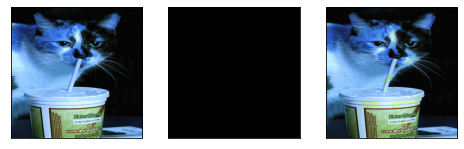

4601 [G loss: 4.706223]
4602 [G loss: 4.681568]
4603 [G loss: 4.785077]
4604 [G loss: 6.827227]
4605 [G loss: 2.946478]
4606 [G loss: 3.931898]
4607 [G loss: 3.697260]
4608 [G loss: 4.551591]
4609 [G loss: 3.203923]
4610 [G loss: 2.254366]
4611 [G loss: 3.857323]
4612 [G loss: 5.111321]
4613 [G loss: 4.585058]
4614 [G loss: 6.640277]
4615 [G loss: 3.826271]
4616 [G loss: 2.830308]
4617 [G loss: 6.667277]
4618 [G loss: 3.531578]
4619 [G loss: 3.222866]
4620 [G loss: 4.700809]
4621 [G loss: 3.930992]
4622 [G loss: 2.133441]
4623 [G loss: 6.756453]
4624 [G loss: 2.877888]
4625 [G loss: 2.821617]
4626 [G loss: 2.982272]
4627 [G loss: 4.981500]
4628 [G loss: 3.192774]
4629 [G loss: 5.762074]
4630 [G loss: 3.573916]
4631 [G loss: 4.391885]
4632 [G loss: 5.840612]
4633 [G loss: 6.834440]
4634 [G loss: 5.956712]
4635 [G loss: 3.384655]
4636 [G loss: 5.089324]
4637 [G loss: 2.992014]
4638 [G loss: 4.174819]
4639 [G loss: 3.354455]
4640 [G loss: 3.587265]
4641 [G loss: 3.968258]
4642 [G loss: 4.

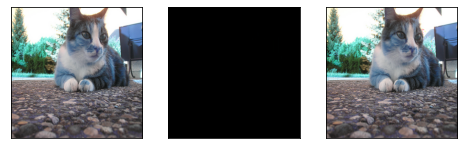

4701 [G loss: 6.013223]
4702 [G loss: 3.773194]
4703 [G loss: 5.118805]
4704 [G loss: 3.025896]
4705 [G loss: 4.428973]
4706 [G loss: 3.283891]
4707 [G loss: 3.629142]
4708 [G loss: 3.907587]
4709 [G loss: 5.124713]
4710 [G loss: 3.614249]
4711 [G loss: 2.983900]
4712 [G loss: 1.937509]
4713 [G loss: 2.756388]
4714 [G loss: 2.344940]
4715 [G loss: 4.197098]
4716 [G loss: 4.904733]
4717 [G loss: 3.714864]
4718 [G loss: 3.590369]
4719 [G loss: 5.151485]
4720 [G loss: 3.599234]
4721 [G loss: 2.025170]
4722 [G loss: 6.454206]
4723 [G loss: 3.699623]
4724 [G loss: 4.954137]
4725 [G loss: 4.682835]
4726 [G loss: 6.258508]
4727 [G loss: 5.517799]
4728 [G loss: 2.397111]
4729 [G loss: 6.744262]
4730 [G loss: 3.409048]
4731 [G loss: 1.860879]
4732 [G loss: 3.015680]
4733 [G loss: 4.741768]
4734 [G loss: 5.414147]
4735 [G loss: 4.249890]
4736 [G loss: 4.091184]
4737 [G loss: 4.408935]
4738 [G loss: 2.510366]
4739 [G loss: 4.307482]
4740 [G loss: 3.891571]
4741 [G loss: 3.729517]
4742 [G loss: 2.

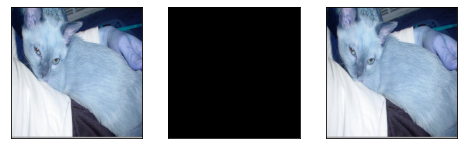

4801 [G loss: 4.370308]
4802 [G loss: 4.649783]
4803 [G loss: 3.118533]
4804 [G loss: 6.165246]
4805 [G loss: 6.179937]
4806 [G loss: 2.546781]
4807 [G loss: 2.591332]
4808 [G loss: 3.382357]
4809 [G loss: 3.460685]
4810 [G loss: 5.678030]
4811 [G loss: 3.683254]
4812 [G loss: 3.370022]
4813 [G loss: 4.011956]
4814 [G loss: 3.332873]
4815 [G loss: 3.088267]
4816 [G loss: 5.691449]
4817 [G loss: 3.093254]
4818 [G loss: 2.907998]
4819 [G loss: 4.435870]
4820 [G loss: 2.764306]
4821 [G loss: 3.344790]
4822 [G loss: 4.626669]
4823 [G loss: 5.615769]
4824 [G loss: 3.724642]
4825 [G loss: 5.566838]
4826 [G loss: 2.256107]
4827 [G loss: 4.358979]
4828 [G loss: 5.926589]
4829 [G loss: 5.938291]
4830 [G loss: 2.372905]
4831 [G loss: 4.580374]
4832 [G loss: 4.198553]
4833 [G loss: 3.607206]
4834 [G loss: 5.204307]
4835 [G loss: 3.900085]
4836 [G loss: 3.828002]
4837 [G loss: 2.410504]
4838 [G loss: 5.484110]
4839 [G loss: 2.809225]
4840 [G loss: 5.156753]
4841 [G loss: 2.969224]
4842 [G loss: 2.

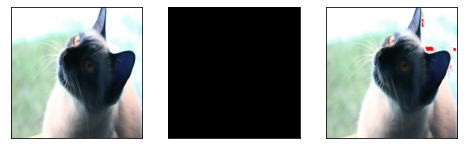

4901 [G loss: 3.954819]
4902 [G loss: 4.944489]
4903 [G loss: 5.775828]
4904 [G loss: 4.750981]
4905 [G loss: 1.911633]
4906 [G loss: 4.049894]
4907 [G loss: 1.897466]
4908 [G loss: 2.911025]
4909 [G loss: 4.609701]
4910 [G loss: 5.436462]
4911 [G loss: 3.136930]
4912 [G loss: 3.179898]
4913 [G loss: 2.867463]
4914 [G loss: 3.168156]
4915 [G loss: 2.731578]
4916 [G loss: 3.123846]
4917 [G loss: 2.457421]
4918 [G loss: 6.606236]
4919 [G loss: 2.200364]
4920 [G loss: 1.976105]
4921 [G loss: 4.053563]
4922 [G loss: 2.870224]
4923 [G loss: 1.756075]
4924 [G loss: 3.308171]
4925 [G loss: 3.586842]
4926 [G loss: 3.299054]
4927 [G loss: 2.488486]
4928 [G loss: 7.302293]
4929 [G loss: 5.511913]
4930 [G loss: 3.507029]
4931 [G loss: 2.704936]
4932 [G loss: 5.585467]
4933 [G loss: 4.862337]
4934 [G loss: 6.046634]
4935 [G loss: 2.714921]
4936 [G loss: 2.368299]
4937 [G loss: 3.216857]
4938 [G loss: 3.151096]
4939 [G loss: 4.255846]
4940 [G loss: 2.392746]
4941 [G loss: 3.587607]
4942 [G loss: 2.

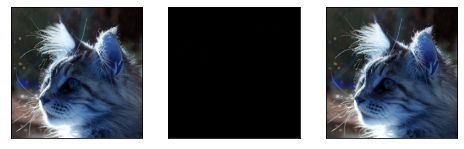

5001 [G loss: 4.136086]
5002 [G loss: 3.134049]
5003 [G loss: 2.485918]
5004 [G loss: 2.390584]
5005 [G loss: 6.956185]
5006 [G loss: 4.172455]
5007 [G loss: 1.489870]
5008 [G loss: 3.092244]
5009 [G loss: 2.615432]
5010 [G loss: 3.772821]
5011 [G loss: 2.875363]
5012 [G loss: 5.362641]
5013 [G loss: 2.448705]
5014 [G loss: 1.443691]
5015 [G loss: 3.542415]
5016 [G loss: 2.619242]
5017 [G loss: 4.886232]
5018 [G loss: 2.491042]
5019 [G loss: 5.622396]
5020 [G loss: 4.556496]
5021 [G loss: 4.446921]
5022 [G loss: 2.971076]
5023 [G loss: 3.499382]
5024 [G loss: 5.326373]
5025 [G loss: 3.342165]
5026 [G loss: 2.832132]
5027 [G loss: 2.539689]
5028 [G loss: 4.729653]
5029 [G loss: 3.103146]
5030 [G loss: 3.806470]
5031 [G loss: 4.901654]
5032 [G loss: 3.347023]
5033 [G loss: 3.193672]
5034 [G loss: 3.340598]
5035 [G loss: 3.823486]
5036 [G loss: 1.512870]
5037 [G loss: 2.926124]
5038 [G loss: 3.604242]
5039 [G loss: 3.665018]
5040 [G loss: 3.871411]
5041 [G loss: 4.439900]
5042 [G loss: 1.

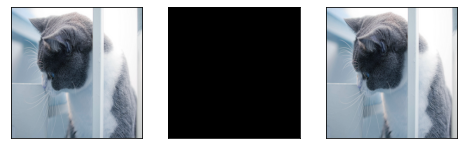

5101 [G loss: 1.316226]
5102 [G loss: 3.673996]
5103 [G loss: 2.471756]
5104 [G loss: 6.018806]
5105 [G loss: 3.659436]
5106 [G loss: 3.786919]
5107 [G loss: 3.601100]
5108 [G loss: 6.515368]
5109 [G loss: 4.175798]
5110 [G loss: 2.570705]
5111 [G loss: 5.306553]
5112 [G loss: 3.892818]
5113 [G loss: 3.544869]
5114 [G loss: 2.102814]
5115 [G loss: 3.530099]
5116 [G loss: 1.699863]
5117 [G loss: 2.898663]
5118 [G loss: 1.582898]
5119 [G loss: 1.755669]
5120 [G loss: 3.587383]
5121 [G loss: 3.533203]
5122 [G loss: 1.891655]
5123 [G loss: 4.042045]
5124 [G loss: 4.178052]
5125 [G loss: 3.195486]
5126 [G loss: 5.793303]
5127 [G loss: 3.409746]
5128 [G loss: 2.190062]
5129 [G loss: 3.695068]
5130 [G loss: 3.173349]
5131 [G loss: 3.204921]
5132 [G loss: 2.978637]
5133 [G loss: 2.962179]
5134 [G loss: 5.262963]
5135 [G loss: 1.258758]
5136 [G loss: 2.254801]
5137 [G loss: 1.341911]
5138 [G loss: 2.547680]
5139 [G loss: 3.627468]
5140 [G loss: 3.288643]
5141 [G loss: 3.568076]
5142 [G loss: 4.

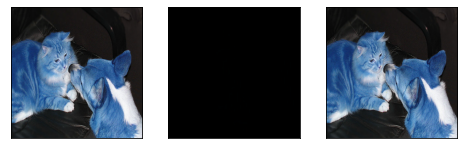

5201 [G loss: 3.527629]
5202 [G loss: 2.381230]
5203 [G loss: 4.168989]
5204 [G loss: 2.103132]
5205 [G loss: 5.075346]
5206 [G loss: 1.411563]
5207 [G loss: 3.205163]
5208 [G loss: 3.565053]
5209 [G loss: 3.666304]
5210 [G loss: 2.572870]
5211 [G loss: 1.999839]
5212 [G loss: 1.594784]
5213 [G loss: 8.136418]
5214 [G loss: 2.748255]
5215 [G loss: 2.692530]
5216 [G loss: 1.626913]
5217 [G loss: 5.628348]
5218 [G loss: 2.265731]
5219 [G loss: 2.943430]
5220 [G loss: 2.115871]
5221 [G loss: 3.089892]
5222 [G loss: 4.551363]
5223 [G loss: 3.738811]
5224 [G loss: 2.474713]
5225 [G loss: 2.588431]
5226 [G loss: 3.098524]
5227 [G loss: 2.387535]
5228 [G loss: 3.797668]
5229 [G loss: 4.837206]
5230 [G loss: 2.111358]
5231 [G loss: 4.287572]
5232 [G loss: 2.251431]
5233 [G loss: 2.530736]
5234 [G loss: 2.654406]
5235 [G loss: 1.656295]
5236 [G loss: 1.652058]
5237 [G loss: 2.543293]
5238 [G loss: 1.876215]
5239 [G loss: 4.008352]
5240 [G loss: 1.480999]
5241 [G loss: 5.102646]
5242 [G loss: 4.

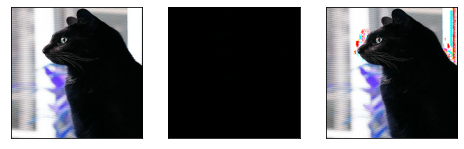

5301 [G loss: 2.903617]
5302 [G loss: 4.812304]
5303 [G loss: 4.517253]
5304 [G loss: 2.063944]
5305 [G loss: 2.505165]
5306 [G loss: 2.653815]
5307 [G loss: 3.473794]
5308 [G loss: 2.039164]
5309 [G loss: 3.255551]
5310 [G loss: 1.546719]
5311 [G loss: 2.658959]
5312 [G loss: 2.710352]
5313 [G loss: 4.552321]
5314 [G loss: 2.579717]
5315 [G loss: 3.876165]
5316 [G loss: 3.042983]
5317 [G loss: 2.854135]
5318 [G loss: 2.999413]
5319 [G loss: 2.647671]
5320 [G loss: 3.650320]
5321 [G loss: 2.302994]
5322 [G loss: 2.771500]
5323 [G loss: 2.260020]
5324 [G loss: 2.053173]
5325 [G loss: 2.924005]
5326 [G loss: 2.026986]
5327 [G loss: 3.130763]
5328 [G loss: 1.948966]
5329 [G loss: 4.050472]
5330 [G loss: 1.497091]
5331 [G loss: 2.651455]
5332 [G loss: 2.345481]
5333 [G loss: 1.948618]
5334 [G loss: 4.398641]
5335 [G loss: 4.285747]
5336 [G loss: 1.470922]
5337 [G loss: 3.704318]
5338 [G loss: 2.210716]
5339 [G loss: 2.249927]
5340 [G loss: 2.876151]
5341 [G loss: 2.265570]
5342 [G loss: 2.

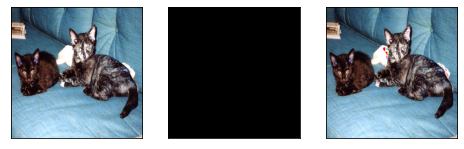

5401 [G loss: 2.843875]
5402 [G loss: 1.182715]
5403 [G loss: 2.287194]
5404 [G loss: 3.456523]
5405 [G loss: 3.582844]
5406 [G loss: 1.865826]
5407 [G loss: 3.313724]
5408 [G loss: 1.763082]
5409 [G loss: 1.878055]
5410 [G loss: 2.376273]
5411 [G loss: 2.663037]
5412 [G loss: 3.416046]
5413 [G loss: 2.995135]
5414 [G loss: 2.876627]
5415 [G loss: 3.445408]
5416 [G loss: 2.478863]
5417 [G loss: 2.932019]
5418 [G loss: 4.234068]
5419 [G loss: 2.564112]
5420 [G loss: 2.765815]
5421 [G loss: 3.179885]
5422 [G loss: 4.594476]
5423 [G loss: 1.689341]
5424 [G loss: 1.946635]
5425 [G loss: 1.785193]
5426 [G loss: 1.950320]
5427 [G loss: 3.059910]
5428 [G loss: 4.073043]
5429 [G loss: 2.834840]
5430 [G loss: 3.338231]
5431 [G loss: 2.053247]
5432 [G loss: 2.319870]
5433 [G loss: 3.065325]
5434 [G loss: 5.311679]
5435 [G loss: 1.913012]
5436 [G loss: 4.061354]
5437 [G loss: 2.921464]
5438 [G loss: 1.824880]
5439 [G loss: 4.836929]
5440 [G loss: 2.322743]
5441 [G loss: 2.289356]
5442 [G loss: 1.

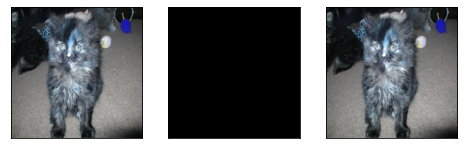

5501 [G loss: 2.557212]
5502 [G loss: 3.140472]
5503 [G loss: 2.469370]
5504 [G loss: 2.492592]
5505 [G loss: 1.515871]
5506 [G loss: 2.030073]
5507 [G loss: 3.530655]
5508 [G loss: 4.379422]
5509 [G loss: 2.734297]
5510 [G loss: 1.729671]
5511 [G loss: 3.029845]
5512 [G loss: 1.859724]
5513 [G loss: 1.561100]
5514 [G loss: 2.320781]
5515 [G loss: 3.330525]
5516 [G loss: 4.043243]
5517 [G loss: 1.306826]
5518 [G loss: 2.322539]
5519 [G loss: 1.410634]
5520 [G loss: 2.018405]
5521 [G loss: 1.749967]
5522 [G loss: 1.839886]
5523 [G loss: 1.645481]
5524 [G loss: 1.842189]
5525 [G loss: 2.365389]
5526 [G loss: 2.663823]
5527 [G loss: 2.231983]
5528 [G loss: 1.438913]
5529 [G loss: 2.838129]
5530 [G loss: 2.748273]
5531 [G loss: 1.728143]
5532 [G loss: 1.998085]
5533 [G loss: 2.836967]
5534 [G loss: 1.735612]
5535 [G loss: 2.616376]
5536 [G loss: 2.566614]
5537 [G loss: 2.613037]
5538 [G loss: 3.808503]
5539 [G loss: 2.490633]
5540 [G loss: 1.367585]
5541 [G loss: 2.159925]
5542 [G loss: 1.

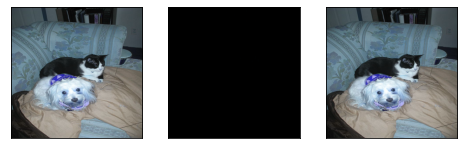

5601 [G loss: 2.345988]
5602 [G loss: 2.864814]
5603 [G loss: 2.592140]
5604 [G loss: 2.102750]
5605 [G loss: 1.684742]
5606 [G loss: 2.046540]
5607 [G loss: 1.603623]
5608 [G loss: 1.858274]
5609 [G loss: 2.354597]
5610 [G loss: 1.386707]
5611 [G loss: 2.502097]
5612 [G loss: 2.679261]
5613 [G loss: 2.673001]
5614 [G loss: 2.736387]
5615 [G loss: 2.367588]
5616 [G loss: 1.713358]
5617 [G loss: 2.089509]
5618 [G loss: 1.300542]
5619 [G loss: 1.852665]
5620 [G loss: 2.192894]
5621 [G loss: 1.630405]
5622 [G loss: 1.509698]
5623 [G loss: 3.806931]
5624 [G loss: 2.741146]
5625 [G loss: 1.647730]
5626 [G loss: 1.802218]
5627 [G loss: 3.453783]
5628 [G loss: 2.272740]
5629 [G loss: 2.262904]
5630 [G loss: 3.255075]
5631 [G loss: 4.247162]
5632 [G loss: 1.303403]
5633 [G loss: 2.894323]
5634 [G loss: 1.762039]
5635 [G loss: 3.784792]
5636 [G loss: 1.889416]
5637 [G loss: 3.361556]
5638 [G loss: 1.625922]
5639 [G loss: 1.777980]
5640 [G loss: 2.666544]
5641 [G loss: 1.646749]
5642 [G loss: 3.

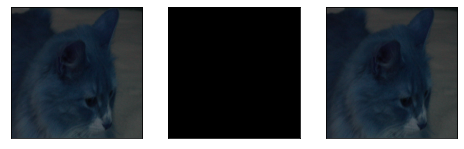

5701 [G loss: 2.033623]
5702 [G loss: 2.176490]
5703 [G loss: 1.532709]
5704 [G loss: 3.661866]
5705 [G loss: 2.741962]
5706 [G loss: 2.018270]
5707 [G loss: 3.444154]
5708 [G loss: 1.685375]
5709 [G loss: 3.193514]
5710 [G loss: 1.519702]
5711 [G loss: 1.486966]
5712 [G loss: 2.005838]
5713 [G loss: 2.283566]
5714 [G loss: 2.176213]
5715 [G loss: 1.655401]
5716 [G loss: 1.640015]
5717 [G loss: 2.387122]
5718 [G loss: 2.692940]
5719 [G loss: 2.013033]
5720 [G loss: 2.024766]
5721 [G loss: 1.957680]
5722 [G loss: 2.730703]
5723 [G loss: 4.297983]
5724 [G loss: 1.920927]
5725 [G loss: 2.230903]
5726 [G loss: 2.286756]
5727 [G loss: 2.199647]
5728 [G loss: 2.169495]
5729 [G loss: 2.779842]
5730 [G loss: 1.095976]
5731 [G loss: 3.359407]
5732 [G loss: 1.366083]
5733 [G loss: 1.176060]
5734 [G loss: 1.318762]
5735 [G loss: 1.236133]
5736 [G loss: 1.461713]
5737 [G loss: 1.980643]
5738 [G loss: 2.007232]
5739 [G loss: 2.185232]
5740 [G loss: 1.866617]
5741 [G loss: 3.059991]
5742 [G loss: 1.

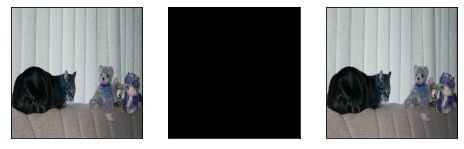

5801 [G loss: 3.078700]
5802 [G loss: 1.909590]
5803 [G loss: 2.100855]
5804 [G loss: 1.361239]
5805 [G loss: 1.544382]
5806 [G loss: 1.221533]
5807 [G loss: 2.290430]
5808 [G loss: 3.070477]
5809 [G loss: 2.741241]
5810 [G loss: 2.153760]
5811 [G loss: 2.146070]
5812 [G loss: 2.289497]
5813 [G loss: 1.926740]
5814 [G loss: 2.884608]
5815 [G loss: 2.010472]
5816 [G loss: 1.304691]
5817 [G loss: 2.697952]
5818 [G loss: 0.978929]
5819 [G loss: 1.552819]
5820 [G loss: 2.678184]
5821 [G loss: 2.260350]
5822 [G loss: 2.297617]
5823 [G loss: 1.472385]
5824 [G loss: 1.827286]
5825 [G loss: 2.314591]
5826 [G loss: 0.965280]
5827 [G loss: 1.121155]
5828 [G loss: 2.368346]
5829 [G loss: 2.483842]
5830 [G loss: 1.318819]
5831 [G loss: 3.117578]
5832 [G loss: 1.572344]
5833 [G loss: 3.181365]
5834 [G loss: 1.319307]
5835 [G loss: 1.557377]
5836 [G loss: 1.616657]
5837 [G loss: 2.765560]
5838 [G loss: 2.478649]
5839 [G loss: 2.093665]
5840 [G loss: 1.703860]
5841 [G loss: 3.679199]
5842 [G loss: 1.

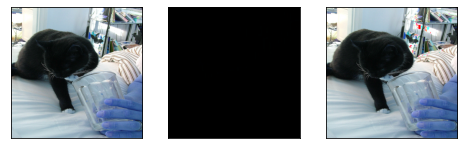

5901 [G loss: 2.117805]
5902 [G loss: 1.843426]
5903 [G loss: 1.551170]
5904 [G loss: 2.125943]
5905 [G loss: 2.472277]
5906 [G loss: 1.575149]
5907 [G loss: 2.074978]
5908 [G loss: 1.638916]
5909 [G loss: 2.453012]
5910 [G loss: 2.339474]
5911 [G loss: 3.234817]
5912 [G loss: 1.483406]
5913 [G loss: 2.097958]
5914 [G loss: 2.818262]
5915 [G loss: 3.052947]
5916 [G loss: 2.342641]
5917 [G loss: 1.648823]
5918 [G loss: 1.449396]
5919 [G loss: 1.995943]
5920 [G loss: 2.215423]
5921 [G loss: 2.859648]
5922 [G loss: 1.460768]
5923 [G loss: 2.247994]
5924 [G loss: 2.016880]
5925 [G loss: 1.060162]
5926 [G loss: 1.545750]
5927 [G loss: 1.657971]
5928 [G loss: 2.204486]
5929 [G loss: 0.971568]
5930 [G loss: 2.298072]
5931 [G loss: 2.561879]
5932 [G loss: 2.411300]
5933 [G loss: 1.644823]
5934 [G loss: 1.833641]
5935 [G loss: 3.182990]
5936 [G loss: 2.852296]
5937 [G loss: 1.790811]
5938 [G loss: 2.460320]
5939 [G loss: 1.850552]
5940 [G loss: 2.230398]
5941 [G loss: 1.659780]
5942 [G loss: 1.

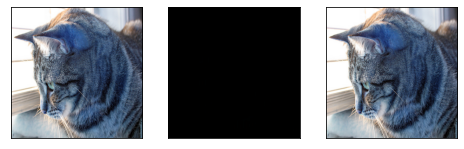

6001 [G loss: 1.468315]
6002 [G loss: 2.055229]
6003 [G loss: 2.013390]
6004 [G loss: 1.657748]
6005 [G loss: 2.230947]
6006 [G loss: 1.823634]
6007 [G loss: 2.240076]
6008 [G loss: 3.546101]
6009 [G loss: 1.533636]
6010 [G loss: 1.448738]
6011 [G loss: 1.549950]
6012 [G loss: 3.121898]
6013 [G loss: 1.775982]
6014 [G loss: 1.913007]
6015 [G loss: 1.616944]
6016 [G loss: 1.051613]
6017 [G loss: 1.692894]
6018 [G loss: 1.545478]
6019 [G loss: 1.620637]
6020 [G loss: 2.438699]
6021 [G loss: 2.134893]
6022 [G loss: 1.587848]
6023 [G loss: 1.510540]
6024 [G loss: 1.094057]
6025 [G loss: 1.889916]
6026 [G loss: 1.480658]
6027 [G loss: 1.075892]
6028 [G loss: 1.173302]
6029 [G loss: 1.397207]
6030 [G loss: 1.673791]
6031 [G loss: 1.218034]
6032 [G loss: 1.821589]
6033 [G loss: 1.098507]
6034 [G loss: 1.308688]
6035 [G loss: 1.697027]
6036 [G loss: 1.901989]
6037 [G loss: 1.417317]
6038 [G loss: 2.109021]
6039 [G loss: 1.368767]
6040 [G loss: 2.395520]
6041 [G loss: 3.278817]
6042 [G loss: 2.

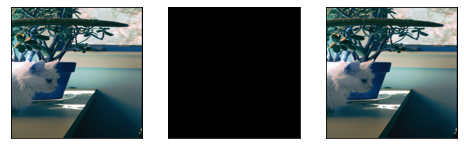

6101 [G loss: 3.229062]
6102 [G loss: 1.219508]
6103 [G loss: 1.718280]
6104 [G loss: 1.637816]
6105 [G loss: 1.013627]
6106 [G loss: 1.411630]
6107 [G loss: 3.533054]
6108 [G loss: 1.628758]
6109 [G loss: 1.066238]
6110 [G loss: 1.379798]
6111 [G loss: 1.435514]
6112 [G loss: 1.989526]
6113 [G loss: 1.031758]
6114 [G loss: 1.912504]
6115 [G loss: 2.226771]
6116 [G loss: 1.161822]
6117 [G loss: 2.032727]
6118 [G loss: 1.932578]
6119 [G loss: 2.600488]
6120 [G loss: 2.194249]
6121 [G loss: 3.001727]
6122 [G loss: 1.787267]
6123 [G loss: 1.860070]
6124 [G loss: 1.395591]
6125 [G loss: 2.347336]
6126 [G loss: 2.307729]
6127 [G loss: 2.314134]
6128 [G loss: 1.606831]
6129 [G loss: 1.229042]
6130 [G loss: 1.776003]
6131 [G loss: 2.034613]
6132 [G loss: 1.550740]
6133 [G loss: 1.839262]
6134 [G loss: 1.174333]
6135 [G loss: 2.153877]
6136 [G loss: 2.034455]
6137 [G loss: 2.295857]
6138 [G loss: 1.049136]
6139 [G loss: 1.407758]
6140 [G loss: 1.999278]
6141 [G loss: 1.913201]
6142 [G loss: 2.

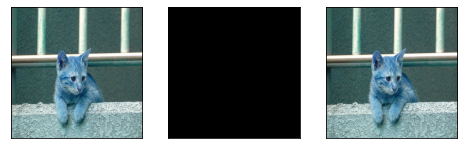

6201 [G loss: 2.133003]
6202 [G loss: 1.233097]
6203 [G loss: 1.157129]
6204 [G loss: 1.818955]
6205 [G loss: 1.515145]
6206 [G loss: 1.670753]
6207 [G loss: 2.582850]
6208 [G loss: 1.835545]
6209 [G loss: 2.492138]
6210 [G loss: 3.169721]
6211 [G loss: 1.682193]
6212 [G loss: 2.196488]
6213 [G loss: 2.730891]
6214 [G loss: 2.750583]
6215 [G loss: 1.606659]
6216 [G loss: 2.013059]
6217 [G loss: 2.063251]
6218 [G loss: 2.234030]
6219 [G loss: 1.210518]
6220 [G loss: 2.723269]
6221 [G loss: 1.479130]
6222 [G loss: 1.246713]
6223 [G loss: 3.149230]
6224 [G loss: 2.591552]
6225 [G loss: 0.861587]
6226 [G loss: 1.766324]
6227 [G loss: 1.625872]
6228 [G loss: 1.394400]
6229 [G loss: 1.322618]
6230 [G loss: 1.470233]
6231 [G loss: 1.682931]
6232 [G loss: 1.183233]
6233 [G loss: 1.489628]
6234 [G loss: 1.205243]
6235 [G loss: 1.597658]
6236 [G loss: 1.817550]
6237 [G loss: 1.862799]
6238 [G loss: 1.348111]
6239 [G loss: 1.438573]
6240 [G loss: 2.079521]
6241 [G loss: 1.671917]
6242 [G loss: 2.

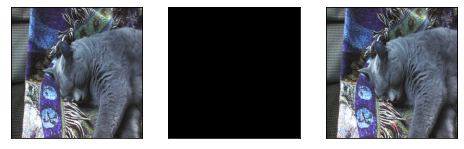

6301 [G loss: 1.913862]
6302 [G loss: 1.534331]
6303 [G loss: 3.725910]
6304 [G loss: 1.798756]
6305 [G loss: 3.316199]
6306 [G loss: 1.571014]
6307 [G loss: 1.377927]
6308 [G loss: 1.893437]
6309 [G loss: 2.348393]
6310 [G loss: 1.313254]
6311 [G loss: 4.780882]
6312 [G loss: 2.059773]
6313 [G loss: 1.099266]
6314 [G loss: 1.802962]
6315 [G loss: 1.690888]
6316 [G loss: 2.518706]
6317 [G loss: 1.509570]
6318 [G loss: 1.764787]
6319 [G loss: 2.014080]
6320 [G loss: 3.903489]
6321 [G loss: 1.769498]
6322 [G loss: 1.420052]
6323 [G loss: 1.104999]
6324 [G loss: 1.680509]
6325 [G loss: 2.018446]
6326 [G loss: 1.602283]
6327 [G loss: 1.145755]
6328 [G loss: 1.519264]
6329 [G loss: 1.859421]
6330 [G loss: 1.661885]
6331 [G loss: 1.346139]
6332 [G loss: 1.459936]
6333 [G loss: 1.447559]
6334 [G loss: 1.981643]
6335 [G loss: 3.337232]
6336 [G loss: 2.550565]
6337 [G loss: 1.810183]
6338 [G loss: 1.708228]
6339 [G loss: 1.957086]
6340 [G loss: 1.557513]
6341 [G loss: 2.184471]
6342 [G loss: 1.

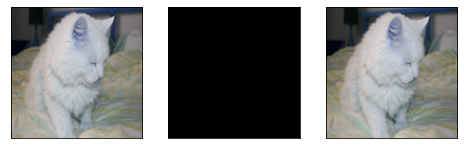

6401 [G loss: 1.942341]
6402 [G loss: 2.024733]
6403 [G loss: 1.318940]
6404 [G loss: 0.774302]
6405 [G loss: 1.567084]
6406 [G loss: 1.322714]
6407 [G loss: 1.020137]
6408 [G loss: 0.851459]
6409 [G loss: 1.796568]
6410 [G loss: 1.606560]
6411 [G loss: 2.338700]
6412 [G loss: 2.462592]
6413 [G loss: 1.242291]
6414 [G loss: 0.774309]
6415 [G loss: 1.852116]
6416 [G loss: 1.207057]
6417 [G loss: 2.511493]
6418 [G loss: 1.992198]
6419 [G loss: 1.441819]
6420 [G loss: 2.277586]
6421 [G loss: 2.674897]
6422 [G loss: 0.963071]
6423 [G loss: 2.126455]
6424 [G loss: 1.250111]
6425 [G loss: 2.132662]
6426 [G loss: 2.561051]
6427 [G loss: 1.582037]
6428 [G loss: 1.663480]
6429 [G loss: 2.205290]
6430 [G loss: 1.461156]
6431 [G loss: 0.889459]
6432 [G loss: 1.622086]
6433 [G loss: 2.562591]
6434 [G loss: 1.087136]
6435 [G loss: 1.150210]
6436 [G loss: 1.528140]
6437 [G loss: 1.192779]
6438 [G loss: 1.482976]
6439 [G loss: 1.245417]
6440 [G loss: 1.638746]
6441 [G loss: 1.459950]
6442 [G loss: 3.

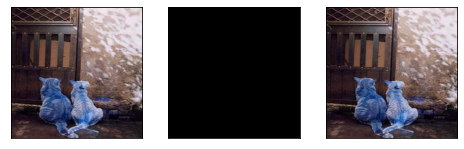

6501 [G loss: 0.659723]
6502 [G loss: 1.018642]
6503 [G loss: 1.797912]
6504 [G loss: 1.167932]
6505 [G loss: 1.335972]
6506 [G loss: 1.387445]
6507 [G loss: 2.076894]
6508 [G loss: 1.621938]
6509 [G loss: 2.585207]
6510 [G loss: 0.855825]
6511 [G loss: 1.764681]
6512 [G loss: 1.373018]
6513 [G loss: 1.753967]
6514 [G loss: 0.959385]
6515 [G loss: 1.009634]
6516 [G loss: 1.056124]
6517 [G loss: 2.524270]
6518 [G loss: 1.198722]
6519 [G loss: 2.870150]
6520 [G loss: 1.167795]
6521 [G loss: 2.417652]
6522 [G loss: 1.603697]
6523 [G loss: 1.261788]
6524 [G loss: 1.407025]
6525 [G loss: 1.281917]
6526 [G loss: 1.862241]
6527 [G loss: 0.508257]
6528 [G loss: 1.043022]
6529 [G loss: 1.551968]
6530 [G loss: 1.749941]
6531 [G loss: 1.148635]
6532 [G loss: 0.810485]
6533 [G loss: 1.450525]
6534 [G loss: 1.939447]
6535 [G loss: 2.685744]
6536 [G loss: 1.950309]
6537 [G loss: 1.825683]
6538 [G loss: 1.083534]
6539 [G loss: 1.206582]
6540 [G loss: 1.275960]
6541 [G loss: 1.142776]
6542 [G loss: 1.

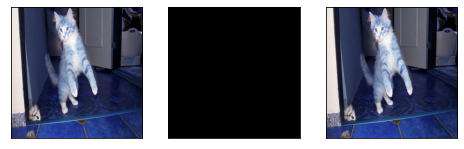

6601 [G loss: 1.352647]
6602 [G loss: 1.728143]
6603 [G loss: 1.483242]
6604 [G loss: 1.616692]
6605 [G loss: 1.090358]
6606 [G loss: 1.939854]
6607 [G loss: 1.376216]
6608 [G loss: 1.010610]
6609 [G loss: 2.082240]
6610 [G loss: 0.967309]
6611 [G loss: 1.481500]
6612 [G loss: 1.426177]
6613 [G loss: 0.990957]
6614 [G loss: 1.286652]
6615 [G loss: 1.424472]
6616 [G loss: 1.513466]
6617 [G loss: 1.010649]
6618 [G loss: 1.332444]
6619 [G loss: 1.556361]
6620 [G loss: 1.339778]
6621 [G loss: 2.457516]
6622 [G loss: 2.336794]
6623 [G loss: 1.959181]
6624 [G loss: 1.250844]
6625 [G loss: 1.857270]
6626 [G loss: 1.363764]
6627 [G loss: 1.489184]
6628 [G loss: 2.058961]
6629 [G loss: 2.457612]
6630 [G loss: 0.965573]
6631 [G loss: 1.510064]
6632 [G loss: 0.869935]
6633 [G loss: 1.737321]
6634 [G loss: 1.273235]
6635 [G loss: 2.304898]
6636 [G loss: 1.404297]
6637 [G loss: 1.429291]
6638 [G loss: 0.816282]
6639 [G loss: 1.281603]
6640 [G loss: 1.114180]
6641 [G loss: 1.535745]
6642 [G loss: 0.

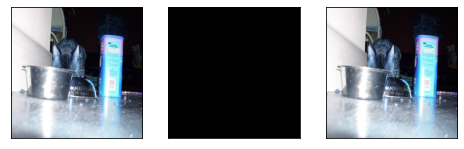

6701 [G loss: 1.173247]
6702 [G loss: 1.108914]
6703 [G loss: 1.424693]
6704 [G loss: 1.567869]
6705 [G loss: 0.986046]
6706 [G loss: 1.158901]
6707 [G loss: 1.263484]
6708 [G loss: 1.698517]
6709 [G loss: 1.371161]
6710 [G loss: 0.773747]
6711 [G loss: 0.728389]
6712 [G loss: 1.633257]
6713 [G loss: 1.743162]
6714 [G loss: 0.998275]
6715 [G loss: 0.765052]
6716 [G loss: 0.907020]
6717 [G loss: 1.492779]
6718 [G loss: 1.833929]
6719 [G loss: 1.241424]
6720 [G loss: 1.325014]
6721 [G loss: 0.952978]
6722 [G loss: 0.936812]
6723 [G loss: 0.732106]
6724 [G loss: 1.572483]
6725 [G loss: 1.218736]
6726 [G loss: 1.446306]
6727 [G loss: 1.123508]
6728 [G loss: 1.295119]
6729 [G loss: 1.462591]
6730 [G loss: 1.090627]
6731 [G loss: 1.872076]
6732 [G loss: 1.058567]
6733 [G loss: 2.330086]
6734 [G loss: 1.697884]
6735 [G loss: 1.980563]
6736 [G loss: 2.016635]
6737 [G loss: 1.292659]
6738 [G loss: 1.588381]
6739 [G loss: 1.442627]
6740 [G loss: 0.777348]
6741 [G loss: 1.336186]
6742 [G loss: 2.

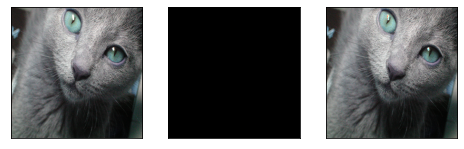

6801 [G loss: 1.388769]
6802 [G loss: 1.429307]
6803 [G loss: 1.560737]
6804 [G loss: 0.684728]
6805 [G loss: 1.499464]
6806 [G loss: 1.972750]
6807 [G loss: 1.347657]
6808 [G loss: 1.548572]
6809 [G loss: 1.004958]
6810 [G loss: 1.043869]
6811 [G loss: 1.323985]
6812 [G loss: 1.219062]
6813 [G loss: 1.432699]
6814 [G loss: 0.870435]
6815 [G loss: 1.212574]
6816 [G loss: 0.767457]
6817 [G loss: 0.881121]
6818 [G loss: 2.327938]
6819 [G loss: 1.429351]
6820 [G loss: 2.559866]
6821 [G loss: 1.024174]
6822 [G loss: 2.026474]
6823 [G loss: 0.778121]
6824 [G loss: 1.734061]
6825 [G loss: 1.123991]
6826 [G loss: 1.743312]
6827 [G loss: 1.435800]
6828 [G loss: 1.253151]
6829 [G loss: 0.969468]
6830 [G loss: 1.263387]
6831 [G loss: 1.671219]
6832 [G loss: 1.511298]
6833 [G loss: 1.187671]
6834 [G loss: 1.867438]
6835 [G loss: 2.236285]
6836 [G loss: 1.501770]
6837 [G loss: 1.287652]
6838 [G loss: 0.976511]
6839 [G loss: 1.324511]
6840 [G loss: 0.836102]
6841 [G loss: 1.533107]
6842 [G loss: 1.

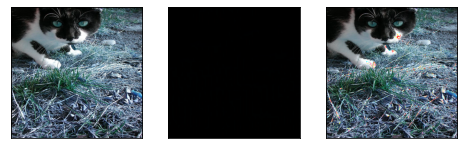

6901 [G loss: 1.345243]
6902 [G loss: 0.560338]
6903 [G loss: 2.465179]
6904 [G loss: 1.176261]
6905 [G loss: 2.012249]
6906 [G loss: 0.883622]
6907 [G loss: 1.567832]
6908 [G loss: 1.069327]
6909 [G loss: 1.417088]
6910 [G loss: 1.066782]
6911 [G loss: 0.760590]
6912 [G loss: 1.015544]
6913 [G loss: 1.498987]
6914 [G loss: 2.615943]
6915 [G loss: 1.560726]
6916 [G loss: 1.120751]
6917 [G loss: 1.413379]
6918 [G loss: 1.759998]
6919 [G loss: 0.769344]
6920 [G loss: 0.863022]
6921 [G loss: 1.205617]
6922 [G loss: 1.490698]
6923 [G loss: 0.915224]
6924 [G loss: 1.536416]
6925 [G loss: 0.805562]
6926 [G loss: 1.279473]
6927 [G loss: 1.180946]
6928 [G loss: 1.628083]
6929 [G loss: 1.341701]
6930 [G loss: 1.470679]
6931 [G loss: 2.090983]
6932 [G loss: 1.184136]
6933 [G loss: 1.512389]
6934 [G loss: 0.928745]
6935 [G loss: 1.475305]
6936 [G loss: 1.489950]
6937 [G loss: 1.058433]
6938 [G loss: 1.411038]
6939 [G loss: 0.987433]
6940 [G loss: 0.935094]
6941 [G loss: 1.363591]
6942 [G loss: 1.

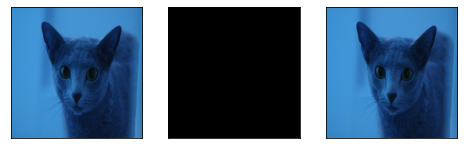

7001 [G loss: 1.603786]
7002 [G loss: 1.489143]
7003 [G loss: 1.030906]
7004 [G loss: 0.675229]
7005 [G loss: 1.159872]
7006 [G loss: 1.240245]
7007 [G loss: 1.583247]
7008 [G loss: 1.462245]
7009 [G loss: 0.810967]
7010 [G loss: 1.060056]
7011 [G loss: 1.086892]
7012 [G loss: 1.205720]
7013 [G loss: 1.121691]
7014 [G loss: 1.976729]
7015 [G loss: 1.056511]
7016 [G loss: 1.026051]
7017 [G loss: 1.053154]
7018 [G loss: 0.877635]
7019 [G loss: 0.927224]
7020 [G loss: 1.102783]
7021 [G loss: 1.697116]
7022 [G loss: 1.463284]
7023 [G loss: 1.063052]
7024 [G loss: 0.907597]
7025 [G loss: 1.454412]
7026 [G loss: 1.481401]
7027 [G loss: 1.226026]
7028 [G loss: 1.096088]
7029 [G loss: 0.886294]
7030 [G loss: 1.594729]
7031 [G loss: 1.526337]
7032 [G loss: 1.223491]
7033 [G loss: 0.972793]
7034 [G loss: 1.398757]
7035 [G loss: 1.265690]
7036 [G loss: 1.462509]
7037 [G loss: 1.260101]
7038 [G loss: 0.824810]
7039 [G loss: 1.652653]
7040 [G loss: 0.890603]
7041 [G loss: 0.675547]
7042 [G loss: 0.

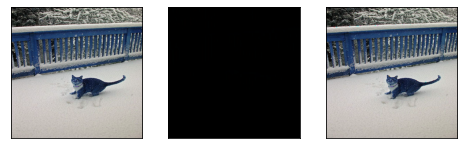

7101 [G loss: 0.754430]
7102 [G loss: 1.541738]
7103 [G loss: 0.732976]
7104 [G loss: 1.164113]
7105 [G loss: 1.379348]
7106 [G loss: 0.693846]
7107 [G loss: 1.820020]
7108 [G loss: 0.804780]
7109 [G loss: 1.726190]
7110 [G loss: 1.606407]
7111 [G loss: 1.461538]
7112 [G loss: 1.165232]
7113 [G loss: 1.053303]
7114 [G loss: 1.254431]
7115 [G loss: 0.975686]
7116 [G loss: 0.662760]
7117 [G loss: 1.169002]
7118 [G loss: 0.676300]
7119 [G loss: 0.865579]
7120 [G loss: 1.100169]
7121 [G loss: 1.237825]
7122 [G loss: 1.122170]
7123 [G loss: 0.477140]
7124 [G loss: 0.614062]
7125 [G loss: 1.216698]
7126 [G loss: 1.302900]
7127 [G loss: 1.980398]
7128 [G loss: 1.113517]
7129 [G loss: 1.253579]
7130 [G loss: 1.024771]
7131 [G loss: 1.208639]
7132 [G loss: 1.069846]
7133 [G loss: 0.992654]
7134 [G loss: 0.765325]
7135 [G loss: 1.166507]
7136 [G loss: 1.667521]
7137 [G loss: 0.922195]
7138 [G loss: 1.540833]
7139 [G loss: 1.098668]
7140 [G loss: 1.190819]
7141 [G loss: 0.626104]
7142 [G loss: 1.

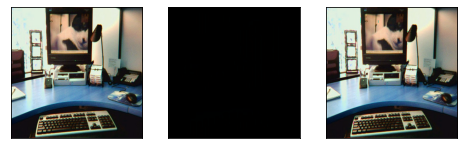

7201 [G loss: 1.586997]
7202 [G loss: 1.188569]
7203 [G loss: 1.556010]
7204 [G loss: 1.082822]
7205 [G loss: 0.694822]
7206 [G loss: 1.019534]
7207 [G loss: 0.660922]
7208 [G loss: 1.287976]
7209 [G loss: 1.103588]
7210 [G loss: 0.734419]
7211 [G loss: 0.904463]
7212 [G loss: 1.240534]
7213 [G loss: 1.204287]
7214 [G loss: 0.399895]
7215 [G loss: 0.891873]
7216 [G loss: 0.886370]
7217 [G loss: 0.842651]
7218 [G loss: 1.640326]
7219 [G loss: 1.040278]
7220 [G loss: 0.957464]
7221 [G loss: 0.625256]
7222 [G loss: 1.137188]
7223 [G loss: 0.880849]
7224 [G loss: 1.028666]
7225 [G loss: 0.763729]
7226 [G loss: 0.995897]
7227 [G loss: 0.910955]
7228 [G loss: 0.888794]
7229 [G loss: 1.068032]
7230 [G loss: 1.071147]
7231 [G loss: 0.616372]
7232 [G loss: 1.047290]
7233 [G loss: 1.292312]
7234 [G loss: 1.087036]
7235 [G loss: 1.047230]
7236 [G loss: 1.178904]
7237 [G loss: 1.058135]
7238 [G loss: 1.409577]
7239 [G loss: 0.651513]
7240 [G loss: 0.657325]
7241 [G loss: 0.579836]
7242 [G loss: 1.

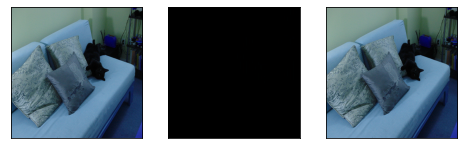

7301 [G loss: 0.824796]
7302 [G loss: 1.411842]
7303 [G loss: 1.253375]
7304 [G loss: 1.346143]
7305 [G loss: 0.963038]
7306 [G loss: 1.224507]
7307 [G loss: 1.333009]
7308 [G loss: 0.833079]
7309 [G loss: 0.976712]
7310 [G loss: 1.399454]
7311 [G loss: 0.653883]
7312 [G loss: 0.737691]
7313 [G loss: 2.176473]
7314 [G loss: 1.103762]
7315 [G loss: 1.173579]
7316 [G loss: 0.647672]
7317 [G loss: 1.795326]
7318 [G loss: 1.248449]
7319 [G loss: 1.087381]
7320 [G loss: 1.320952]
7321 [G loss: 1.086073]
7322 [G loss: 0.913298]
7323 [G loss: 0.652576]
7324 [G loss: 1.367317]
7325 [G loss: 1.274683]
7326 [G loss: 0.985477]
7327 [G loss: 1.128150]
7328 [G loss: 1.937661]
7329 [G loss: 0.692808]
7330 [G loss: 0.793491]
7331 [G loss: 1.185823]
7332 [G loss: 0.950615]
7333 [G loss: 0.915848]
7334 [G loss: 0.834972]
7335 [G loss: 1.320583]
7336 [G loss: 1.123272]
7337 [G loss: 0.448175]
7338 [G loss: 0.488688]
7339 [G loss: 0.713730]
7340 [G loss: 0.935534]
7341 [G loss: 0.514713]
7342 [G loss: 1.

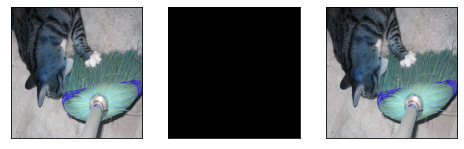

7401 [G loss: 1.316310]
7402 [G loss: 1.029117]
7403 [G loss: 0.922305]
7404 [G loss: 0.707808]
7405 [G loss: 0.769486]
7406 [G loss: 0.981832]
7407 [G loss: 1.953523]
7408 [G loss: 0.520475]
7409 [G loss: 1.710316]
7410 [G loss: 0.741073]
7411 [G loss: 1.013377]
7412 [G loss: 0.388813]
7413 [G loss: 1.244573]
7414 [G loss: 1.701480]
7415 [G loss: 0.461863]
7416 [G loss: 0.822939]
7417 [G loss: 1.130403]
7418 [G loss: 1.207568]
7419 [G loss: 1.501477]
7420 [G loss: 1.331394]
7421 [G loss: 1.425963]
7422 [G loss: 0.667948]
7423 [G loss: 1.364102]
7424 [G loss: 1.280234]
7425 [G loss: 0.939572]
7426 [G loss: 0.906330]
7427 [G loss: 0.711852]
7428 [G loss: 0.902571]
7429 [G loss: 1.483739]
7430 [G loss: 0.924492]
7431 [G loss: 0.906727]
7432 [G loss: 0.579543]
7433 [G loss: 0.954578]
7434 [G loss: 0.804365]
7435 [G loss: 0.874744]
7436 [G loss: 0.784964]
7437 [G loss: 1.021138]
7438 [G loss: 0.819342]
7439 [G loss: 1.235702]
7440 [G loss: 1.130168]
7441 [G loss: 0.931342]
7442 [G loss: 0.

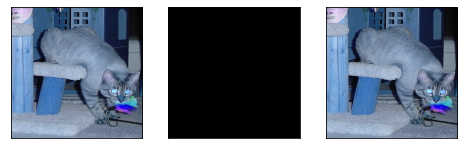

7501 [G loss: 1.379579]
7502 [G loss: 1.005101]
7503 [G loss: 1.677296]
7504 [G loss: 1.415702]
7505 [G loss: 0.970475]
7506 [G loss: 1.122270]
7507 [G loss: 1.180408]
7508 [G loss: 0.855077]
7509 [G loss: 0.794769]
7510 [G loss: 0.974123]
7511 [G loss: 1.192604]
7512 [G loss: 1.038701]
7513 [G loss: 1.672187]
7514 [G loss: 0.958380]
7515 [G loss: 0.703579]
7516 [G loss: 0.836336]
7517 [G loss: 1.257658]
7518 [G loss: 1.365121]
7519 [G loss: 1.091981]
7520 [G loss: 1.227974]
7521 [G loss: 0.762110]
7522 [G loss: 1.084194]
7523 [G loss: 0.887555]
7524 [G loss: 0.903306]
7525 [G loss: 0.643553]
7526 [G loss: 0.686018]
7527 [G loss: 1.188699]
7528 [G loss: 0.607382]
7529 [G loss: 0.805240]
7530 [G loss: 1.316206]
7531 [G loss: 0.923323]
7532 [G loss: 1.175591]
7533 [G loss: 0.817924]
7534 [G loss: 1.806817]
7535 [G loss: 0.620127]
7536 [G loss: 0.665309]
7537 [G loss: 1.097386]
7538 [G loss: 0.781839]
7539 [G loss: 1.671646]
7540 [G loss: 1.135546]
7541 [G loss: 0.802922]
7542 [G loss: 0.

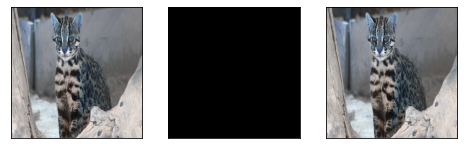

7601 [G loss: 1.169823]
7602 [G loss: 0.836651]
7603 [G loss: 0.938129]
7604 [G loss: 0.610334]
7605 [G loss: 0.957360]
7606 [G loss: 0.924582]
7607 [G loss: 0.903249]
7608 [G loss: 0.771266]
7609 [G loss: 1.191123]
7610 [G loss: 0.902897]
7611 [G loss: 1.252087]
7612 [G loss: 1.021146]
7613 [G loss: 0.962418]
7614 [G loss: 0.979640]
7615 [G loss: 1.076660]
7616 [G loss: 1.017819]
7617 [G loss: 0.721550]
7618 [G loss: 0.513643]
7619 [G loss: 0.891876]
7620 [G loss: 1.134829]
7621 [G loss: 0.731644]
7622 [G loss: 1.214584]
7623 [G loss: 0.628146]
7624 [G loss: 0.803931]
7625 [G loss: 1.111918]
7626 [G loss: 1.188882]
7627 [G loss: 1.815422]
7628 [G loss: 0.475402]
7629 [G loss: 0.775043]
7630 [G loss: 0.977364]
7631 [G loss: 0.745156]
7632 [G loss: 0.982663]
7633 [G loss: 0.842318]
7634 [G loss: 1.087634]
7635 [G loss: 0.635977]
7636 [G loss: 0.548019]
7637 [G loss: 0.798691]
7638 [G loss: 1.289058]
7639 [G loss: 1.020537]
7640 [G loss: 1.373167]
7641 [G loss: 0.822723]
7642 [G loss: 1.

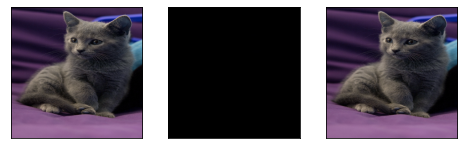

7701 [G loss: 0.533299]
7702 [G loss: 0.857244]
7703 [G loss: 0.655290]
7704 [G loss: 0.650087]
7705 [G loss: 0.911438]
7706 [G loss: 0.758723]
7707 [G loss: 1.405208]
7708 [G loss: 1.462032]
7709 [G loss: 1.215584]
7710 [G loss: 0.659362]
7711 [G loss: 1.060911]
7712 [G loss: 1.241667]
7713 [G loss: 1.027322]
7714 [G loss: 0.489278]
7715 [G loss: 1.002692]
7716 [G loss: 1.544272]
7717 [G loss: 1.527944]
7718 [G loss: 0.521152]
7719 [G loss: 0.812676]
7720 [G loss: 1.340893]
7721 [G loss: 0.383835]
7722 [G loss: 1.150582]
7723 [G loss: 0.847585]
7724 [G loss: 0.542849]
7725 [G loss: 0.465760]
7726 [G loss: 0.638098]
7727 [G loss: 1.026635]
7728 [G loss: 0.605786]
7729 [G loss: 0.914917]
7730 [G loss: 0.522816]
7731 [G loss: 0.717263]
7732 [G loss: 0.797647]
7733 [G loss: 0.714829]
7734 [G loss: 0.741267]
7735 [G loss: 0.838352]
7736 [G loss: 0.898406]
7737 [G loss: 1.054498]
7738 [G loss: 0.829549]
7739 [G loss: 1.580258]
7740 [G loss: 0.811737]
7741 [G loss: 1.231007]
7742 [G loss: 0.

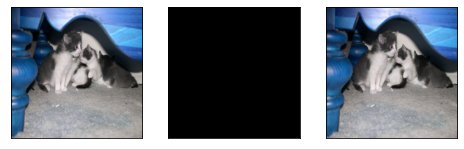

7801 [G loss: 0.855646]
7802 [G loss: 0.461806]
7803 [G loss: 1.205793]
7804 [G loss: 1.189277]
7805 [G loss: 0.602555]
7806 [G loss: 0.758023]
7807 [G loss: 0.761306]
7808 [G loss: 1.048385]
7809 [G loss: 0.876651]
7810 [G loss: 0.570504]
7811 [G loss: 0.914128]
7812 [G loss: 0.886898]
7813 [G loss: 0.908002]
7814 [G loss: 0.863513]
7815 [G loss: 0.533219]
7816 [G loss: 1.118042]
7817 [G loss: 1.098654]
7818 [G loss: 0.744820]
7819 [G loss: 0.941526]
7820 [G loss: 0.576885]
7821 [G loss: 0.353098]
7822 [G loss: 0.800546]
7823 [G loss: 0.414556]
7824 [G loss: 0.838802]
7825 [G loss: 1.074025]
7826 [G loss: 1.538476]
7827 [G loss: 0.773286]
7828 [G loss: 0.872358]
7829 [G loss: 0.531378]
7830 [G loss: 0.933242]
7831 [G loss: 0.838635]
7832 [G loss: 1.073874]
7833 [G loss: 0.914560]
7834 [G loss: 1.126952]
7835 [G loss: 0.481879]
7836 [G loss: 1.207853]
7837 [G loss: 0.677805]
7838 [G loss: 0.532451]
7839 [G loss: 0.761554]
7840 [G loss: 0.405517]
7841 [G loss: 0.779983]
7842 [G loss: 0.

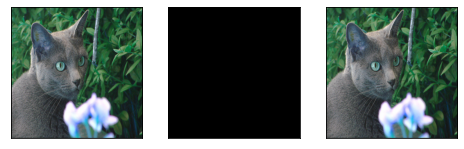

7901 [G loss: 1.081879]
7902 [G loss: 1.063566]
7903 [G loss: 0.650388]
7904 [G loss: 0.645730]
7905 [G loss: 0.861020]
7906 [G loss: 0.803461]
7907 [G loss: 0.938244]
7908 [G loss: 0.369921]
7909 [G loss: 0.622683]
7910 [G loss: 0.669282]
7911 [G loss: 1.128844]
7912 [G loss: 0.809160]
7913 [G loss: 0.521829]
7914 [G loss: 1.026190]
7915 [G loss: 0.674216]
7916 [G loss: 1.043347]
7917 [G loss: 0.581634]
7918 [G loss: 0.479990]
7919 [G loss: 0.645098]
7920 [G loss: 0.549953]
7921 [G loss: 0.744783]
7922 [G loss: 0.981199]
7923 [G loss: 0.444676]
7924 [G loss: 0.837303]
7925 [G loss: 0.681968]
7926 [G loss: 0.714149]
7927 [G loss: 0.440666]
7928 [G loss: 1.165927]
7929 [G loss: 1.165962]
7930 [G loss: 0.708347]
7931 [G loss: 0.754545]
7932 [G loss: 0.578200]
7933 [G loss: 1.089992]
7934 [G loss: 0.886244]
7935 [G loss: 0.703383]
7936 [G loss: 0.925144]
7937 [G loss: 1.141595]
7938 [G loss: 0.945639]
7939 [G loss: 1.257253]
7940 [G loss: 0.816575]
7941 [G loss: 0.759224]
7942 [G loss: 0.

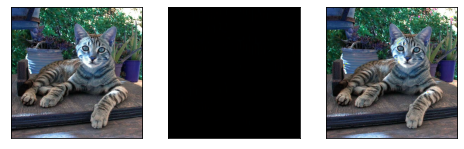

8001 [G loss: 1.167063]
8002 [G loss: 0.799913]
8003 [G loss: 0.477749]
8004 [G loss: 0.767212]
8005 [G loss: 0.726743]
8006 [G loss: 1.178476]
8007 [G loss: 0.425383]
8008 [G loss: 0.731347]
8009 [G loss: 0.878510]
8010 [G loss: 0.610748]
8011 [G loss: 0.459156]
8012 [G loss: 1.139654]
8013 [G loss: 0.858377]
8014 [G loss: 0.498615]
8015 [G loss: 0.842565]
8016 [G loss: 0.962524]
8017 [G loss: 1.368407]
8018 [G loss: 0.790268]
8019 [G loss: 0.858041]
8020 [G loss: 1.097068]
8021 [G loss: 1.123960]
8022 [G loss: 0.647745]
8023 [G loss: 0.773308]
8024 [G loss: 0.451363]
8025 [G loss: 0.643659]
8026 [G loss: 0.916538]
8027 [G loss: 0.629242]
8028 [G loss: 0.647215]
8029 [G loss: 0.918036]
8030 [G loss: 0.683160]
8031 [G loss: 1.323595]
8032 [G loss: 0.383468]
8033 [G loss: 0.631591]
8034 [G loss: 0.782561]
8035 [G loss: 1.167474]
8036 [G loss: 0.637887]
8037 [G loss: 0.668915]
8038 [G loss: 0.900436]
8039 [G loss: 0.952077]
8040 [G loss: 0.396817]
8041 [G loss: 0.818768]
8042 [G loss: 0.

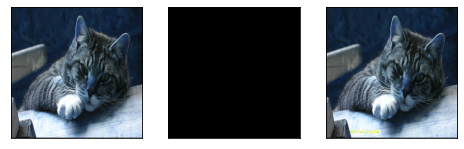

8101 [G loss: 0.923783]
8102 [G loss: 0.537208]
8103 [G loss: 1.308217]
8104 [G loss: 0.787857]
8105 [G loss: 0.693428]
8106 [G loss: 1.392637]
8107 [G loss: 0.871452]
8108 [G loss: 1.070631]
8109 [G loss: 0.720937]
8110 [G loss: 1.049560]
8111 [G loss: 0.802840]
8112 [G loss: 0.676038]
8113 [G loss: 0.904963]
8114 [G loss: 1.160986]
8115 [G loss: 1.048920]
8116 [G loss: 0.796690]
8117 [G loss: 0.927972]
8118 [G loss: 0.863810]
8119 [G loss: 0.883837]
8120 [G loss: 0.673682]
8121 [G loss: 0.854224]
8122 [G loss: 0.623703]
8123 [G loss: 0.540087]
8124 [G loss: 0.803925]
8125 [G loss: 0.655195]
8126 [G loss: 0.782022]
8127 [G loss: 0.770856]
8128 [G loss: 0.811382]
8129 [G loss: 0.657179]
8130 [G loss: 1.191881]
8131 [G loss: 0.567615]
8132 [G loss: 0.864984]
8133 [G loss: 0.781876]
8134 [G loss: 0.511593]
8135 [G loss: 0.840752]
8136 [G loss: 0.593441]
8137 [G loss: 0.615930]
8138 [G loss: 0.882178]
8139 [G loss: 0.920071]
8140 [G loss: 0.324716]
8141 [G loss: 1.202127]
8142 [G loss: 0.

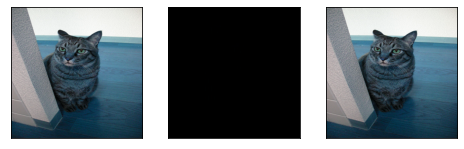

8201 [G loss: 1.095535]
8202 [G loss: 0.651343]
8203 [G loss: 1.060826]
8204 [G loss: 0.542462]
8205 [G loss: 0.829080]
8206 [G loss: 0.675685]
8207 [G loss: 0.340647]
8208 [G loss: 0.805011]
8209 [G loss: 0.721096]
8210 [G loss: 1.474357]
8211 [G loss: 0.740357]
8212 [G loss: 1.354921]
8213 [G loss: 1.071172]
8214 [G loss: 1.128004]
8215 [G loss: 1.014303]
8216 [G loss: 0.502857]
8217 [G loss: 0.433491]
8218 [G loss: 0.846570]
8219 [G loss: 1.311011]
8220 [G loss: 0.696107]
8221 [G loss: 0.610628]
8222 [G loss: 0.956410]
8223 [G loss: 0.717071]
8224 [G loss: 0.495326]
8225 [G loss: 0.683217]
8226 [G loss: 0.663659]
8227 [G loss: 1.311722]
8228 [G loss: 0.553339]
8229 [G loss: 0.248893]
8230 [G loss: 1.117189]
8231 [G loss: 0.598778]
8232 [G loss: 0.519251]
8233 [G loss: 0.551436]
8234 [G loss: 0.609637]
8235 [G loss: 0.362926]
8236 [G loss: 0.520222]
8237 [G loss: 0.715289]
8238 [G loss: 0.601116]
8239 [G loss: 0.794916]
8240 [G loss: 0.615465]
8241 [G loss: 0.767612]
8242 [G loss: 0.

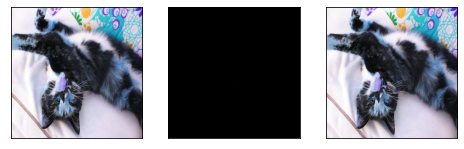

8301 [G loss: 0.772630]
8302 [G loss: 0.586314]
8303 [G loss: 0.533237]
8304 [G loss: 0.426306]
8305 [G loss: 1.118776]
8306 [G loss: 0.745640]
8307 [G loss: 1.081107]
8308 [G loss: 0.945611]
8309 [G loss: 0.826085]
8310 [G loss: 0.533443]
8311 [G loss: 0.696579]
8312 [G loss: 0.790706]
8313 [G loss: 0.762720]
8314 [G loss: 0.827491]
8315 [G loss: 0.865686]
8316 [G loss: 0.778748]
8317 [G loss: 1.186988]
8318 [G loss: 0.628612]
8319 [G loss: 0.574833]
8320 [G loss: 0.591771]
8321 [G loss: 0.995952]
8322 [G loss: 0.749138]
8323 [G loss: 0.816913]
8324 [G loss: 1.185331]
8325 [G loss: 0.781591]
8326 [G loss: 0.511447]
8327 [G loss: 0.555682]
8328 [G loss: 0.529284]
8329 [G loss: 1.012375]
8330 [G loss: 0.889976]
8331 [G loss: 0.491900]
8332 [G loss: 0.909606]
8333 [G loss: 0.579733]
8334 [G loss: 0.556738]
8335 [G loss: 0.763438]
8336 [G loss: 0.699008]
8337 [G loss: 0.678417]
8338 [G loss: 0.774999]
8339 [G loss: 0.679756]
8340 [G loss: 0.467438]
8341 [G loss: 1.345329]
8342 [G loss: 0.

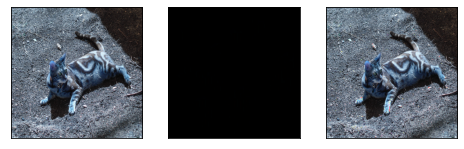

8401 [G loss: 0.617715]
8402 [G loss: 0.382622]
8403 [G loss: 0.673304]
8404 [G loss: 0.920908]
8405 [G loss: 0.637034]
8406 [G loss: 0.745890]
8407 [G loss: 0.479011]
8408 [G loss: 0.366050]
8409 [G loss: 1.098139]
8410 [G loss: 0.764135]
8411 [G loss: 0.661805]
8412 [G loss: 0.624487]
8413 [G loss: 0.317667]
8414 [G loss: 0.533983]
8415 [G loss: 0.369341]
8416 [G loss: 0.876104]
8417 [G loss: 0.614185]
8418 [G loss: 0.558182]
8419 [G loss: 1.049110]
8420 [G loss: 0.489180]
8421 [G loss: 0.448544]
8422 [G loss: 0.726528]
8423 [G loss: 0.696363]
8424 [G loss: 0.463673]
8425 [G loss: 0.365462]
8426 [G loss: 0.452134]
8427 [G loss: 0.595455]
8428 [G loss: 1.161522]
8429 [G loss: 0.578320]
8430 [G loss: 0.426753]
8431 [G loss: 0.588608]
8432 [G loss: 0.670724]
8433 [G loss: 0.614237]
8434 [G loss: 0.645539]
8435 [G loss: 0.654495]
8436 [G loss: 0.817055]
8437 [G loss: 0.552170]
8438 [G loss: 0.492682]
8439 [G loss: 0.416405]
8440 [G loss: 0.606419]
8441 [G loss: 0.445481]
8442 [G loss: 0.

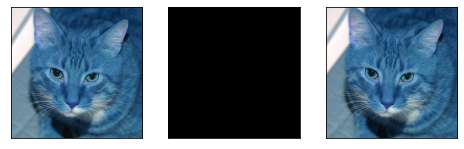

8501 [G loss: 0.926994]
8502 [G loss: 0.736453]
8503 [G loss: 0.604896]
8504 [G loss: 0.551277]
8505 [G loss: 0.500849]
8506 [G loss: 0.402297]
8507 [G loss: 1.099342]
8508 [G loss: 0.668226]
8509 [G loss: 0.508699]
8510 [G loss: 0.955505]
8511 [G loss: 0.562741]
8512 [G loss: 0.794781]
8513 [G loss: 0.459543]
8514 [G loss: 0.389374]
8515 [G loss: 0.999694]
8516 [G loss: 0.408365]
8517 [G loss: 0.404407]
8518 [G loss: 0.676773]
8519 [G loss: 0.512547]
8520 [G loss: 0.718603]
8521 [G loss: 0.667851]
8522 [G loss: 0.537716]
8523 [G loss: 0.487596]
8524 [G loss: 0.556498]
8525 [G loss: 0.790979]
8526 [G loss: 0.829440]
8527 [G loss: 0.406627]
8528 [G loss: 0.720677]
8529 [G loss: 0.375558]
8530 [G loss: 0.412863]
8531 [G loss: 0.776607]
8532 [G loss: 0.570443]
8533 [G loss: 0.951951]
8534 [G loss: 0.923538]
8535 [G loss: 0.575779]
8536 [G loss: 1.151770]
8537 [G loss: 0.656525]
8538 [G loss: 0.844572]
8539 [G loss: 0.817474]
8540 [G loss: 0.446368]
8541 [G loss: 0.450953]
8542 [G loss: 0.

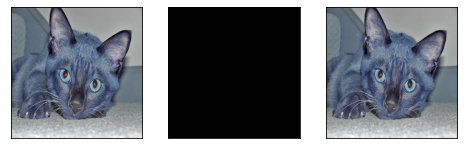

8601 [G loss: 0.604444]
8602 [G loss: 0.621436]
8603 [G loss: 0.724185]
8604 [G loss: 0.886600]
8605 [G loss: 0.405220]
8606 [G loss: 0.470260]
8607 [G loss: 0.246078]
8608 [G loss: 1.098319]
8609 [G loss: 0.985199]
8610 [G loss: 0.548133]
8611 [G loss: 1.008757]
8612 [G loss: 0.607505]
8613 [G loss: 0.995175]
8614 [G loss: 0.601432]
8615 [G loss: 0.635056]
8616 [G loss: 0.385993]
8617 [G loss: 0.510421]
8618 [G loss: 0.379083]
8619 [G loss: 0.466144]
8620 [G loss: 0.839726]
8621 [G loss: 0.507138]
8622 [G loss: 0.741353]
8623 [G loss: 0.628982]
8624 [G loss: 1.160802]
8625 [G loss: 0.341453]
8626 [G loss: 0.602694]
8627 [G loss: 0.517309]
8628 [G loss: 0.646746]
8629 [G loss: 0.526712]
8630 [G loss: 0.696581]
8631 [G loss: 0.604959]
8632 [G loss: 0.426178]
8633 [G loss: 0.576932]
8634 [G loss: 0.295770]
8635 [G loss: 1.091995]
8636 [G loss: 0.895731]
8637 [G loss: 0.882877]
8638 [G loss: 1.303826]
8639 [G loss: 1.010161]
8640 [G loss: 0.835474]
8641 [G loss: 0.631527]
8642 [G loss: 0.

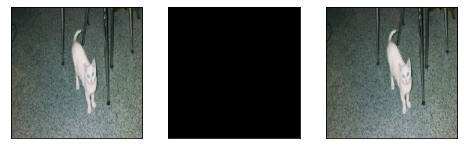

8701 [G loss: 0.347266]
8702 [G loss: 0.589689]
8703 [G loss: 0.619722]
8704 [G loss: 0.720076]
8705 [G loss: 0.660552]
8706 [G loss: 0.489821]
8707 [G loss: 0.749983]
8708 [G loss: 0.653914]
8709 [G loss: 0.947704]
8710 [G loss: 0.992040]
8711 [G loss: 0.695392]
8712 [G loss: 0.458349]
8713 [G loss: 0.692985]
8714 [G loss: 0.286492]
8715 [G loss: 0.766871]
8716 [G loss: 0.864629]
8717 [G loss: 0.513374]
8718 [G loss: 0.869788]
8719 [G loss: 1.216257]
8720 [G loss: 0.449852]
8721 [G loss: 0.575132]
8722 [G loss: 0.910176]
8723 [G loss: 0.670113]
8724 [G loss: 0.678534]
8725 [G loss: 0.957844]
8726 [G loss: 0.885622]
8727 [G loss: 0.346357]
8728 [G loss: 0.667760]
8729 [G loss: 0.429833]
8730 [G loss: 0.785913]
8731 [G loss: 0.416978]
8732 [G loss: 0.553850]
8733 [G loss: 0.501865]
8734 [G loss: 0.309564]
8735 [G loss: 0.411389]
8736 [G loss: 0.948872]
8737 [G loss: 0.492970]
8738 [G loss: 0.576563]
8739 [G loss: 0.592434]
8740 [G loss: 0.516651]
8741 [G loss: 1.109556]
8742 [G loss: 0.

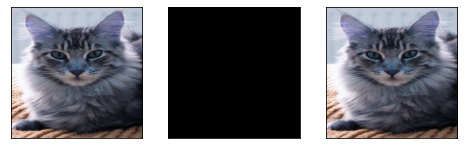

8801 [G loss: 0.872038]
8802 [G loss: 0.538399]
8803 [G loss: 0.713455]
8804 [G loss: 0.359402]
8805 [G loss: 0.403048]
8806 [G loss: 1.022608]
8807 [G loss: 0.611752]
8808 [G loss: 0.697968]
8809 [G loss: 0.547424]
8810 [G loss: 0.607456]
8811 [G loss: 0.575839]
8812 [G loss: 0.578178]
8813 [G loss: 0.353382]
8814 [G loss: 0.553512]
8815 [G loss: 0.549825]
8816 [G loss: 0.478645]
8817 [G loss: 0.403754]
8818 [G loss: 0.740846]
8819 [G loss: 0.394119]
8820 [G loss: 0.759613]
8821 [G loss: 0.546227]
8822 [G loss: 0.328437]
8823 [G loss: 0.842308]
8824 [G loss: 0.538876]
8825 [G loss: 0.314267]
8826 [G loss: 0.850078]
8827 [G loss: 0.523187]
8828 [G loss: 0.728153]
8829 [G loss: 0.999614]
8830 [G loss: 0.393961]
8831 [G loss: 0.324572]
8832 [G loss: 0.254534]
8833 [G loss: 0.681180]
8834 [G loss: 0.478259]
8835 [G loss: 0.446159]
8836 [G loss: 0.711104]
8837 [G loss: 0.503594]
8838 [G loss: 0.696331]
8839 [G loss: 0.415704]
8840 [G loss: 0.472325]
8841 [G loss: 0.429104]
8842 [G loss: 0.

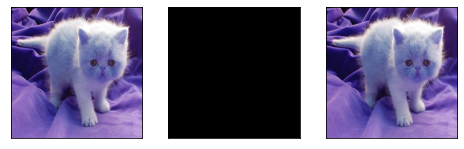

8901 [G loss: 0.365004]
8902 [G loss: 0.394355]
8903 [G loss: 0.675016]
8904 [G loss: 0.534157]
8905 [G loss: 0.282933]
8906 [G loss: 0.388812]
8907 [G loss: 0.398730]
8908 [G loss: 0.877612]
8909 [G loss: 0.326220]
8910 [G loss: 0.404862]
8911 [G loss: 0.895340]
8912 [G loss: 0.448488]
8913 [G loss: 0.883328]
8914 [G loss: 0.473146]
8915 [G loss: 0.466186]
8916 [G loss: 0.998045]
8917 [G loss: 0.483538]
8918 [G loss: 0.802874]
8919 [G loss: 0.304853]
8920 [G loss: 0.504390]
8921 [G loss: 0.431856]
8922 [G loss: 0.328417]
8923 [G loss: 1.539679]
8924 [G loss: 0.486152]
8925 [G loss: 0.727652]
8926 [G loss: 0.490229]
8927 [G loss: 0.416146]
8928 [G loss: 0.617567]
8929 [G loss: 0.541846]
8930 [G loss: 0.633038]
8931 [G loss: 0.409389]
8932 [G loss: 0.873498]
8933 [G loss: 0.524757]
8934 [G loss: 0.548771]
8935 [G loss: 0.296719]
8936 [G loss: 0.552571]
8937 [G loss: 0.591308]
8938 [G loss: 0.530982]
8939 [G loss: 0.463518]
8940 [G loss: 0.717674]
8941 [G loss: 0.405869]
8942 [G loss: 0.

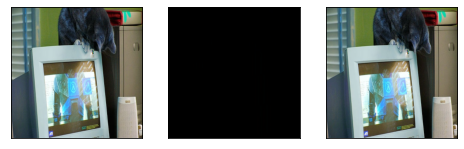

9001 [G loss: 0.360524]
9002 [G loss: 0.455118]
9003 [G loss: 0.273971]
9004 [G loss: 0.474497]
9005 [G loss: 0.420792]
9006 [G loss: 0.541592]
9007 [G loss: 0.420355]
9008 [G loss: 0.940236]
9009 [G loss: 0.560915]
9010 [G loss: 0.542116]
9011 [G loss: 0.499020]
9012 [G loss: 0.529728]
9013 [G loss: 0.319189]
9014 [G loss: 0.640379]
9015 [G loss: 0.402493]
9016 [G loss: 0.485298]
9017 [G loss: 0.680619]
9018 [G loss: 1.114825]
9019 [G loss: 0.568502]
9020 [G loss: 0.465177]
9021 [G loss: 0.668599]
9022 [G loss: 0.439998]
9023 [G loss: 0.565017]
9024 [G loss: 0.791518]
9025 [G loss: 0.456379]
9026 [G loss: 0.604408]
9027 [G loss: 0.425950]
9028 [G loss: 0.704979]
9029 [G loss: 0.278435]
9030 [G loss: 0.420455]
9031 [G loss: 0.365963]
9032 [G loss: 0.652103]
9033 [G loss: 0.429029]
9034 [G loss: 0.380619]
9035 [G loss: 0.399404]
9036 [G loss: 0.484581]
9037 [G loss: 0.694631]
9038 [G loss: 0.495807]
9039 [G loss: 0.606598]
9040 [G loss: 0.627968]
9041 [G loss: 0.560709]
9042 [G loss: 0.

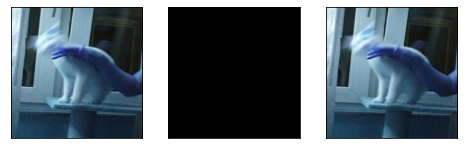

9101 [G loss: 0.446155]
9102 [G loss: 0.537635]
9103 [G loss: 0.595935]
9104 [G loss: 0.467779]
9105 [G loss: 0.449358]
9106 [G loss: 0.331805]
9107 [G loss: 0.671047]
9108 [G loss: 0.274814]
9109 [G loss: 0.500243]
9110 [G loss: 0.506894]
9111 [G loss: 0.666348]
9112 [G loss: 0.625561]
9113 [G loss: 0.430966]
9114 [G loss: 0.414578]
9115 [G loss: 0.591483]
9116 [G loss: 1.001375]
9117 [G loss: 0.609311]
9118 [G loss: 1.009044]
9119 [G loss: 0.646479]
9120 [G loss: 0.546251]
9121 [G loss: 0.351697]
9122 [G loss: 0.660139]
9123 [G loss: 0.628210]
9124 [G loss: 0.737683]
9125 [G loss: 0.858107]
9126 [G loss: 0.420627]
9127 [G loss: 0.732618]
9128 [G loss: 0.526042]
9129 [G loss: 0.585310]
9130 [G loss: 0.329067]
9131 [G loss: 0.671426]
9132 [G loss: 0.769962]
9133 [G loss: 0.900204]
9134 [G loss: 0.487013]
9135 [G loss: 0.716926]
9136 [G loss: 0.490917]
9137 [G loss: 0.378186]
9138 [G loss: 0.895994]
9139 [G loss: 0.587247]
9140 [G loss: 0.386451]
9141 [G loss: 0.394445]
9142 [G loss: 0.

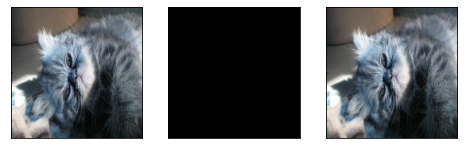

9201 [G loss: 0.322939]
9202 [G loss: 0.546702]
9203 [G loss: 0.412610]
9204 [G loss: 0.231629]
9205 [G loss: 0.550674]
9206 [G loss: 0.685672]
9207 [G loss: 0.550245]
9208 [G loss: 0.759780]
9209 [G loss: 0.833308]
9210 [G loss: 0.443199]
9211 [G loss: 0.406825]
9212 [G loss: 0.423854]
9213 [G loss: 0.513991]
9214 [G loss: 0.650536]
9215 [G loss: 0.468144]
9216 [G loss: 0.345452]
9217 [G loss: 0.318994]
9218 [G loss: 0.386361]
9219 [G loss: 0.549535]
9220 [G loss: 0.556566]
9221 [G loss: 0.603145]
9222 [G loss: 0.742717]
9223 [G loss: 0.303878]
9224 [G loss: 0.467559]
9225 [G loss: 0.576636]
9226 [G loss: 0.506067]
9227 [G loss: 0.579162]
9228 [G loss: 0.498687]
9229 [G loss: 0.437149]
9230 [G loss: 0.445895]
9231 [G loss: 0.406676]
9232 [G loss: 0.222744]
9233 [G loss: 0.372651]
9234 [G loss: 0.717757]
9235 [G loss: 0.572068]
9236 [G loss: 0.419354]
9237 [G loss: 0.277289]
9238 [G loss: 0.385317]
9239 [G loss: 0.609869]
9240 [G loss: 0.343892]
9241 [G loss: 0.430983]
9242 [G loss: 0.

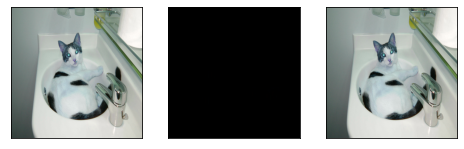

9301 [G loss: 0.555493]
9302 [G loss: 0.480699]
9303 [G loss: 0.390349]
9304 [G loss: 0.504862]
9305 [G loss: 0.729746]
9306 [G loss: 0.354810]
9307 [G loss: 0.435959]
9308 [G loss: 0.365620]
9309 [G loss: 0.695626]
9310 [G loss: 0.285020]
9311 [G loss: 0.594196]
9312 [G loss: 0.784638]
9313 [G loss: 0.703988]
9314 [G loss: 0.535152]
9315 [G loss: 0.562304]
9316 [G loss: 0.349574]
9317 [G loss: 0.543810]
9318 [G loss: 0.423806]
9319 [G loss: 0.340892]
9320 [G loss: 0.496815]
9321 [G loss: 0.570825]
9322 [G loss: 0.523657]
9323 [G loss: 0.470228]
9324 [G loss: 0.235888]
9325 [G loss: 0.317827]
9326 [G loss: 0.605736]
9327 [G loss: 0.339623]
9328 [G loss: 0.586169]
9329 [G loss: 0.365655]
9330 [G loss: 0.564396]
9331 [G loss: 0.396130]
9332 [G loss: 0.606080]
9333 [G loss: 0.606359]
9334 [G loss: 0.780961]
9335 [G loss: 0.428851]
9336 [G loss: 1.027268]
9337 [G loss: 0.827313]
9338 [G loss: 0.417511]
9339 [G loss: 0.551187]
9340 [G loss: 0.418426]
9341 [G loss: 0.709294]
9342 [G loss: 0.

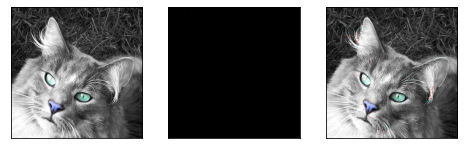

9401 [G loss: 0.493297]
9402 [G loss: 0.584357]
9403 [G loss: 0.519151]
9404 [G loss: 0.602367]
9405 [G loss: 0.367950]
9406 [G loss: 0.344103]
9407 [G loss: 0.519834]
9408 [G loss: 0.496738]
9409 [G loss: 0.391036]
9410 [G loss: 0.454463]
9411 [G loss: 0.317761]
9412 [G loss: 0.402418]
9413 [G loss: 0.514713]
9414 [G loss: 0.508405]
9415 [G loss: 0.556549]
9416 [G loss: 0.281868]
9417 [G loss: 0.460862]
9418 [G loss: 0.482857]
9419 [G loss: 0.561656]
9420 [G loss: 0.405056]
9421 [G loss: 0.333875]
9422 [G loss: 0.476099]
9423 [G loss: 0.327870]
9424 [G loss: 0.410984]
9425 [G loss: 0.521049]
9426 [G loss: 0.605879]
9427 [G loss: 0.327510]
9428 [G loss: 0.457047]
9429 [G loss: 0.580075]
9430 [G loss: 0.593701]
9431 [G loss: 0.819921]
9432 [G loss: 0.448407]
9433 [G loss: 0.757786]
9434 [G loss: 0.682617]
9435 [G loss: 0.453453]
9436 [G loss: 0.640887]
9437 [G loss: 0.376264]
9438 [G loss: 0.464886]
9439 [G loss: 0.407911]
9440 [G loss: 0.292349]
9441 [G loss: 0.297856]
9442 [G loss: 0.

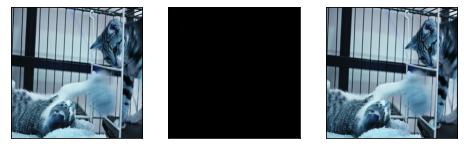

9501 [G loss: 0.378307]
9502 [G loss: 0.279444]
9503 [G loss: 0.883684]
9504 [G loss: 0.573452]
9505 [G loss: 0.803162]
9506 [G loss: 0.465756]
9507 [G loss: 0.332515]
9508 [G loss: 0.266756]
9509 [G loss: 0.804887]
9510 [G loss: 0.228504]
9511 [G loss: 0.379704]
9512 [G loss: 0.632222]
9513 [G loss: 0.445976]
9514 [G loss: 0.596462]
9515 [G loss: 0.588500]
9516 [G loss: 0.779761]
9517 [G loss: 0.661877]
9518 [G loss: 0.450054]
9519 [G loss: 0.445548]
9520 [G loss: 0.765015]
9521 [G loss: 0.455183]
9522 [G loss: 0.437255]
9523 [G loss: 0.357671]
9524 [G loss: 0.197440]
9525 [G loss: 0.446819]
9526 [G loss: 1.089478]
9527 [G loss: 0.451374]
9528 [G loss: 0.440221]
9529 [G loss: 0.904870]
9530 [G loss: 0.608533]
9531 [G loss: 0.850508]
9532 [G loss: 0.482512]
9533 [G loss: 0.496838]
9534 [G loss: 0.461247]
9535 [G loss: 0.501919]
9536 [G loss: 0.733052]
9537 [G loss: 0.546955]
9538 [G loss: 0.542889]
9539 [G loss: 0.551427]
9540 [G loss: 0.699887]
9541 [G loss: 0.603062]
9542 [G loss: 0.

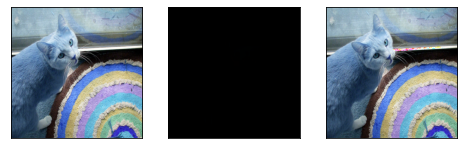

9601 [G loss: 0.382372]
9602 [G loss: 0.295279]
9603 [G loss: 0.311078]
9604 [G loss: 0.567227]
9605 [G loss: 0.368980]
9606 [G loss: 0.237589]
9607 [G loss: 0.471576]
9608 [G loss: 0.563856]
9609 [G loss: 0.329558]
9610 [G loss: 0.404023]
9611 [G loss: 0.695324]
9612 [G loss: 0.790048]
9613 [G loss: 0.311086]
9614 [G loss: 0.368834]
9615 [G loss: 0.326510]
9616 [G loss: 0.277049]
9617 [G loss: 0.345972]
9618 [G loss: 0.501000]
9619 [G loss: 0.410505]
9620 [G loss: 0.348172]
9621 [G loss: 0.561143]
9622 [G loss: 0.280412]
9623 [G loss: 0.419357]
9624 [G loss: 0.574006]
9625 [G loss: 0.381673]
9626 [G loss: 0.423824]
9627 [G loss: 0.610512]
9628 [G loss: 0.293723]
9629 [G loss: 0.746935]
9630 [G loss: 0.524702]
9631 [G loss: 0.509900]
9632 [G loss: 0.466179]
9633 [G loss: 0.460490]
9634 [G loss: 0.729559]
9635 [G loss: 0.630258]
9636 [G loss: 0.499308]
9637 [G loss: 0.398887]
9638 [G loss: 0.514741]
9639 [G loss: 0.696580]
9640 [G loss: 0.731267]
9641 [G loss: 0.445387]
9642 [G loss: 0.

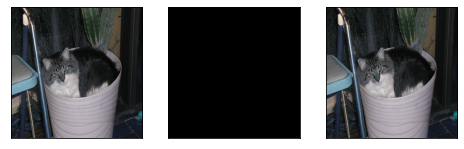

9701 [G loss: 0.375533]
9702 [G loss: 0.362556]
9703 [G loss: 0.596508]
9704 [G loss: 0.384732]
9705 [G loss: 0.321976]
9706 [G loss: 0.300243]
9707 [G loss: 0.199189]
9708 [G loss: 0.265373]
9709 [G loss: 0.531780]
9710 [G loss: 0.729671]
9711 [G loss: 0.654641]
9712 [G loss: 0.311266]
9713 [G loss: 0.337730]
9714 [G loss: 0.459122]
9715 [G loss: 0.273065]
9716 [G loss: 0.413804]
9717 [G loss: 0.635260]
9718 [G loss: 0.648545]
9719 [G loss: 0.584866]
9720 [G loss: 0.504929]
9721 [G loss: 0.254311]
9722 [G loss: 0.465741]
9723 [G loss: 0.735706]
9724 [G loss: 0.456257]
9725 [G loss: 0.490071]
9726 [G loss: 0.347573]
9727 [G loss: 0.285981]
9728 [G loss: 0.398329]
9729 [G loss: 0.276034]
9730 [G loss: 0.562979]
9731 [G loss: 0.417594]
9732 [G loss: 0.647680]
9733 [G loss: 0.582068]
9734 [G loss: 0.389967]
9735 [G loss: 0.562065]
9736 [G loss: 0.680449]
9737 [G loss: 0.566346]
9738 [G loss: 0.498287]
9739 [G loss: 0.497596]
9740 [G loss: 0.572916]
9741 [G loss: 0.435551]
9742 [G loss: 0.

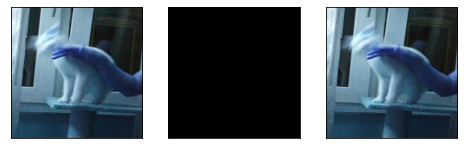

9801 [G loss: 0.633202]
9802 [G loss: 0.317634]
9803 [G loss: 0.469694]
9804 [G loss: 0.437357]
9805 [G loss: 0.657370]
9806 [G loss: 0.580719]
9807 [G loss: 0.468828]
9808 [G loss: 0.493027]
9809 [G loss: 0.340864]
9810 [G loss: 0.443014]
9811 [G loss: 0.557229]
9812 [G loss: 0.423604]
9813 [G loss: 0.588789]
9814 [G loss: 0.536868]
9815 [G loss: 0.673317]
9816 [G loss: 0.376805]
9817 [G loss: 0.560724]
9818 [G loss: 0.384052]
9819 [G loss: 0.455795]
9820 [G loss: 0.463080]
9821 [G loss: 0.377609]
9822 [G loss: 0.495790]
9823 [G loss: 0.687364]
9824 [G loss: 0.538782]
9825 [G loss: 0.425627]
9826 [G loss: 0.371116]
9827 [G loss: 0.638649]
9828 [G loss: 0.347305]
9829 [G loss: 0.651029]
9830 [G loss: 0.211469]
9831 [G loss: 0.439067]
9832 [G loss: 0.529164]
9833 [G loss: 0.298438]
9834 [G loss: 0.258873]
9835 [G loss: 0.542390]
9836 [G loss: 0.521206]
9837 [G loss: 0.472323]
9838 [G loss: 0.485027]
9839 [G loss: 0.345955]
9840 [G loss: 0.529727]
9841 [G loss: 0.651265]
9842 [G loss: 0.

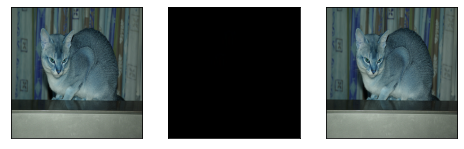

9901 [G loss: 0.250771]
9902 [G loss: 0.299786]
9903 [G loss: 0.470051]
9904 [G loss: 0.421547]
9905 [G loss: 0.502724]
9906 [G loss: 0.389382]
9907 [G loss: 0.867780]
9908 [G loss: 0.520699]
9909 [G loss: 0.398983]
9910 [G loss: 0.448630]
9911 [G loss: 0.637684]
9912 [G loss: 0.353631]
9913 [G loss: 0.501279]
9914 [G loss: 0.531652]
9915 [G loss: 0.435945]
9916 [G loss: 0.500046]
9917 [G loss: 0.442571]
9918 [G loss: 0.511308]
9919 [G loss: 0.437675]
9920 [G loss: 0.475545]
9921 [G loss: 0.673881]
9922 [G loss: 0.511064]
9923 [G loss: 0.608435]
9924 [G loss: 0.305314]
9925 [G loss: 0.265294]
9926 [G loss: 0.374357]
9927 [G loss: 0.505006]
9928 [G loss: 0.251238]
9929 [G loss: 0.282996]
9930 [G loss: 0.423663]
9931 [G loss: 0.469610]
9932 [G loss: 0.376054]
9933 [G loss: 0.718320]
9934 [G loss: 0.731814]
9935 [G loss: 0.299165]
9936 [G loss: 0.596650]
9937 [G loss: 0.298014]
9938 [G loss: 0.450204]
9939 [G loss: 0.382008]
9940 [G loss: 0.549718]
9941 [G loss: 0.228832]
9942 [G loss: 0.

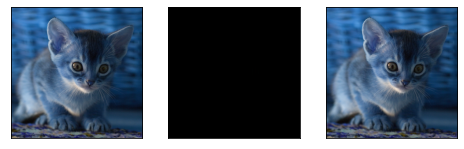

[[0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.57136266e-21 0.00000000e+00 1.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [8.82427871e-01 1.17572136e-01 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [0]:
from sklearn.model_selection import train_test_split

# Load cat images
selected_class_id = 2 # cat
selected_idx = np.where(labels[:, selected_class_id] == 1)
labels_selected = labels[selected_idx]
images = np.asarray(images) 
images_selected = images[selected_idx]
x_train, x_test, y_train, y_test = train_test_split(images_selected, labels_selected, test_size=0.35, random_state=seed)

# Run adversarial attack
gan = GAN()
gan.train(x_train,
          true_class=1,
          fake_class=5,
          epochs=10000, 
          batch_size=32, 
          sample_interval=100)